In [1]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch.utils.data import random_split

# Checking if cuda is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [2]:
import torch
from sklearn.model_selection import StratifiedShuffleSplit
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, Subset


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),  
])


full_trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)


labels = full_trainset.targets


labels = torch.tensor(labels)


sss = StratifiedShuffleSplit(n_splits=1, test_size=10000, random_state=42)


for train_idx, val_idx in sss.split(torch.zeros(len(labels)), labels):
    train_subset = Subset(full_trainset, train_idx)
    val_subset = Subset(full_trainset, val_idx)


trainloader = DataLoader(train_subset, batch_size=128, shuffle=True, num_workers=0)
valloader = DataLoader(val_subset, batch_size=128, shuffle=False, num_workers=0)


testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False, num_workers=0)

Files already downloaded and verified
Files already downloaded and verified


In [3]:
import torch.nn.functional as F
import matplotlib.pyplot as plt


def one_hot_encode(labels, num_classes=10):
    return F.one_hot(labels, num_classes).float()


class EarlyStopping:
    def __init__(self, patience=3, min_delta=0):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
            min_delta (float): Minimum change in the monitored quantity to qualify as an improvement.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0  
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True


def train_model(model, criterion, optimizer, num_epochs=10, plot=True, patience=3, inception=0):
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []
    
  
    early_stopping = EarlyStopping(patience=patience, min_delta=0.001)
    
    for epoch in range(num_epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        
        for images, labels in trainloader:
            images, labels = images.to(device), labels.to(device)
            
            
            labels_onehot = one_hot_encode(labels, num_classes=10)
            
            
            optimizer.zero_grad()
            
            
            outputs = model(images)
            if inception:
                loss= criterion(outputs.logits, labels_onehot)
            else:
                loss = criterion(outputs, labels_onehot)
            loss.backward()
            optimizer.step()
            
            
            running_loss += loss.item()
            
            
            predicted = torch.argmax(outputs, dim=1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(trainloader)
        train_accuracy = 100 * correct / total
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        
        
        model.eval()
        val_loss, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for images, labels in valloader:
                images, labels = images.to(device), labels.to(device)
                
                
                labels_onehot = one_hot_encode(labels, num_classes=10)
                
                outputs = model(images)
                loss = criterion(outputs, labels_onehot)
                
                val_loss += loss.item()
                
                
                predicted = torch.argmax(outputs, dim=1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / len(valloader)
        val_accuracy = 100 * correct / total
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)
        
        print(f'Epoch [{epoch + 1}/{num_epochs}], '
              f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, '
              f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')
        
        
        early_stopping(val_loss)
        if early_stopping.early_stop:
            print("Early stopping triggered.")
            break

    if plot:
        
        plt.figure()
        plt.plot(range(len(train_losses)), train_losses, label='Train Loss')
        plt.plot(range(len(val_losses)), val_losses, label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.title('Training and Validation Loss')
        plt.show()

        
        plt.figure()
        plt.plot(range(len(train_accuracies)), train_accuracies, label='Train Accuracy')
        plt.plot(range(len(val_accuracies)), val_accuracies, label='Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.title('Training and Validation Accuracy')
        plt.show()

    return train_losses, val_losses, train_accuracies, val_accuracies


In [4]:
import torch
import torch.nn as nn
import torchvision.models as models

class ModelWithDropout(nn.Module):
    def __init__(self, model_name, num_classes=10, dropout_prob=0.5):
        super(ModelWithDropout, self).__init__()
        
        if model_name == 'resnet50':
            self.model = models.resnet50(num_classes=10)
            in_features = self.model.fc.in_features
            self.model.fc = nn.Sequential(
                nn.Dropout(p=dropout_prob),     
                nn.Linear(in_features, num_classes)
            )
        
        elif model_name == 'densenet121':
            self.model = models.densenet121(num_classes=10)
            in_features = self.model.classifier.in_features
            self.model.classifier = nn.Sequential(
                nn.Dropout(p=dropout_prob),     
                nn.Linear(in_features, num_classes)
            )
        
        elif model_name == 'mobilenet_v3_large':
            self.model = models.mobilenet_v3_large(num_classes=10)
            in_features = self.model.classifier[3].in_features
            self.model.classifier[3] = nn.Sequential(
                nn.Dropout(p=dropout_prob),     
                nn.Linear(in_features, num_classes)
            )
        
        elif model_name == 'wide_resnet50_2':
            self.model = models.wide_resnet50_2(num_classes=10)
            in_features = self.model.fc.in_features
            self.model.fc = nn.Sequential(
                nn.Dropout(p=dropout_prob),     
                nn.Linear(in_features, num_classes)
            )
        else:
            raise ValueError(f"Unknown model name: {model_name}")

    def forward(self, x):
        return self.model(x)




In [90]:
import matplotlib.pyplot as plt
import numpy as np

def plot_cnn_performance(models_data, model_names=None, ylim=(0,2)):
    """
    Visualizes the training and validation losses and accuracies of multiple CNN models.
    
    Args:
        models_data (list): List of dictionaries where each dictionary contains 
                             the performance data for a model, 
                             e.g. {'train_losses': ..., 'val_losses': ..., 
                                   'train_accuracies': ..., 'val_accuracies': ...}.
        num_epochs (int): Number of epochs.
        model_names (list): List of model names to label in the plot.
    
    Returns:
        None
    """
    
    colors = plt.cm.Set1(np.linspace(0, 1, len(models_data)))  
    num_epochs=max([max([len(j) for j in i.values()]) for i in models_data])
    max_epochs=num_epochs
    plt.figure(figsize=(6, 12))

    
    for idx, model_data in enumerate(models_data):
        train_losses = model_data['train_losses'] + [None] * (max_epochs - len(model_data['train_losses']))
        val_losses = model_data['val_losses'] + [None] * (max_epochs - len(model_data['val_losses']))
        train_accuracies = model_data['train_accuracies'] + [None] * (max_epochs - len(model_data['train_accuracies']))
        val_accuracies = model_data['val_accuracies'] + [None] * (max_epochs - len(model_data['val_accuracies']))
        
        
        # Plot Losses
        plt.subplot(2, 1, 1)  
        plt.plot(range(num_epochs), train_losses, color=colors[idx], alpha=1, label=f'{model_names[idx]} Train Loss' if model_names else f'Model {idx+1} Train Loss')
        plt.plot(range(num_epochs), val_losses, color=colors[idx], linestyle=":", label=f'{model_names[idx]} Val Loss' if model_names else f'Model {idx+1} Val Loss')

        # Plot Accuracies
        plt.subplot(2, 1, 2)  
        plt.plot(range(num_epochs), train_accuracies, color=colors[idx], alpha=1, label=f'{model_names[idx]} Train Accuracy' if model_names else f'Model {idx+1} Train Accuracy')
        plt.plot(range(num_epochs), val_accuracies, color=colors[idx], linestyle=":",label=f'{model_names[idx]} Val Accuracy' if model_names else f'Model {idx+1} Val Accuracy')

    
    plt.subplot(2, 1, 1)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim(ylim)
    plt.title('Training and Validation Losses')
    plt.legend(loc='upper right')

    # Plot for Accuracies
    plt.subplot(2, 1, 2)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracies')
    plt.legend(loc='lower right')

    # Show the plot
    plt.tight_layout()
    plt.show()




## Training Resnet-50

### Base Resnet 50

Epoch [1/30], Train Loss: 0.2639, Train Accuracy: 38.87%, Val Loss: 0.2239, Val Accuracy: 49.12%
Epoch [2/30], Train Loss: 0.2138, Train Accuracy: 51.98%, Val Loss: 0.2169, Val Accuracy: 50.76%
Epoch [3/30], Train Loss: 0.2018, Train Accuracy: 56.06%, Val Loss: 0.4609, Val Accuracy: 44.72%
Epoch [4/30], Train Loss: 0.1868, Train Accuracy: 60.01%, Val Loss: 0.1818, Val Accuracy: 61.09%
Epoch [5/30], Train Loss: 0.1785, Train Accuracy: 63.04%, Val Loss: 0.1768, Val Accuracy: 63.86%
Epoch [6/30], Train Loss: 0.1468, Train Accuracy: 69.60%, Val Loss: 0.1776, Val Accuracy: 62.85%
Epoch [7/30], Train Loss: 0.1352, Train Accuracy: 72.54%, Val Loss: 0.2193, Val Accuracy: 67.89%
Epoch [8/30], Train Loss: 0.1276, Train Accuracy: 74.18%, Val Loss: 0.1519, Val Accuracy: 67.47%
Epoch [9/30], Train Loss: 0.1435, Train Accuracy: 70.62%, Val Loss: 0.1444, Val Accuracy: 69.88%
Epoch [10/30], Train Loss: 0.0944, Train Accuracy: 80.64%, Val Loss: 0.1382, Val Accuracy: 72.06%
Epoch [11/30], Train Loss: 0.

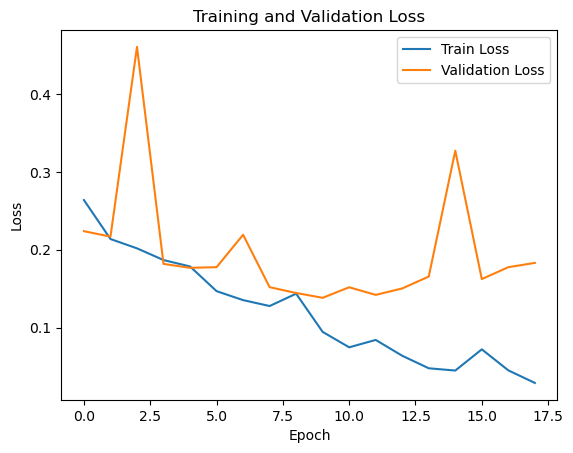

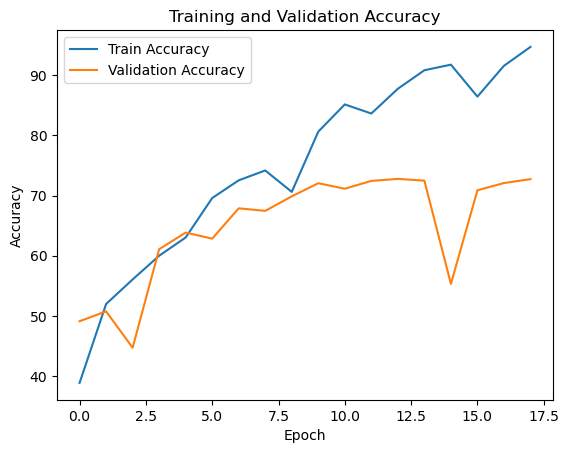

In [6]:
# ResNet-50 model 
model = torchvision.models.resnet50(num_classes=10).to(device)

# loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, criterion, optimizer, num_epochs=30, patience=8)

### Resnet 50 with Adam optimizer and different learning rate

Optimizer : Adam, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3736, Train Accuracy: 18.02%, Val Loss: 0.2973, Val Accuracy: 21.79%
Epoch [2/30], Train Loss: 0.2730, Train Accuracy: 29.52%, Val Loss: 0.2579, Val Accuracy: 35.36%
Epoch [3/30], Train Loss: 0.2435, Train Accuracy: 40.53%, Val Loss: 0.2369, Val Accuracy: 42.15%
Epoch [4/30], Train Loss: 0.2196, Train Accuracy: 48.56%, Val Loss: 0.2020, Val Accuracy: 53.15%
Epoch [5/30], Train Loss: 0.1961, Train Accuracy: 55.04%, Val Loss: 0.1878, Val Accuracy: 57.33%
Epoch [6/30], Train Loss: 0.1766, Train Accuracy: 60.65%, Val Loss: 0.1984, Val Accuracy: 60.03%
Epoch [7/30], Train Loss: 0.1570, Train Accuracy: 65.62%, Val Loss: 0.1635, Val Accuracy: 64.14%
Epoch [8/30], Train Loss: 0.1662, Train Accuracy: 63.47%, Val Loss: 0.1681, Val Accuracy: 63.64%
Epoch [9/30], Train Loss: 0.1439, Train Accuracy: 68.89%, Val Loss: 0.1552, Val Accuracy: 67.32%
Epoch [10/30], Train Loss: 0.1340, Train Accuracy: 71.55%, Val Loss: 0.1454, Val Accuracy

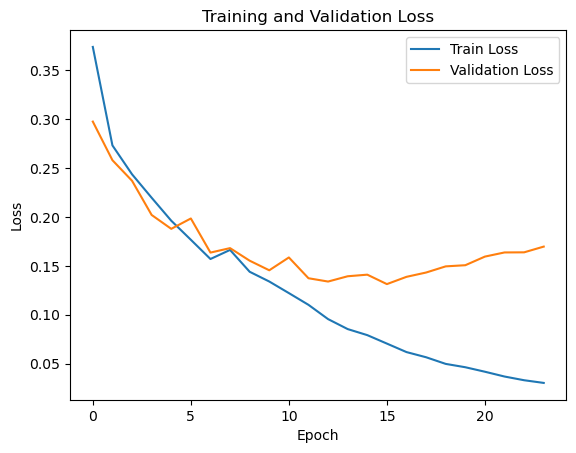

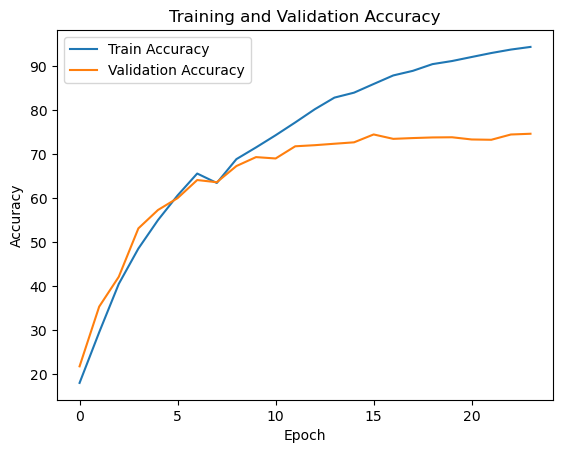

Optimizer : Adam, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2674, Train Accuracy: 38.55%, Val Loss: 0.2276, Val Accuracy: 47.06%
Epoch [2/30], Train Loss: 0.2393, Train Accuracy: 46.29%, Val Loss: 0.2345, Val Accuracy: 44.41%
Epoch [3/30], Train Loss: 0.2217, Train Accuracy: 49.63%, Val Loss: 0.2073, Val Accuracy: 52.73%
Epoch [4/30], Train Loss: 0.2269, Train Accuracy: 49.27%, Val Loss: 0.2192, Val Accuracy: 48.55%
Epoch [5/30], Train Loss: 0.2125, Train Accuracy: 53.41%, Val Loss: 0.1946, Val Accuracy: 56.75%
Epoch [6/30], Train Loss: 0.1985, Train Accuracy: 56.72%, Val Loss: 0.4112, Val Accuracy: 52.79%
Epoch [7/30], Train Loss: 0.1884, Train Accuracy: 59.60%, Val Loss: 0.2012, Val Accuracy: 61.64%
Epoch [8/30], Train Loss: 0.1682, Train Accuracy: 64.03%, Val Loss: 0.1603, Val Accuracy: 65.07%
Epoch [9/30], Train Loss: 0.1383, Train Accuracy: 70.46%, Val Loss: 0.1441, Val Accuracy: 69.36%
Epoch [10/30], Train Loss: 0.1192, Train Accuracy: 75.02%, Val Loss: 0.1471, Val Accurac

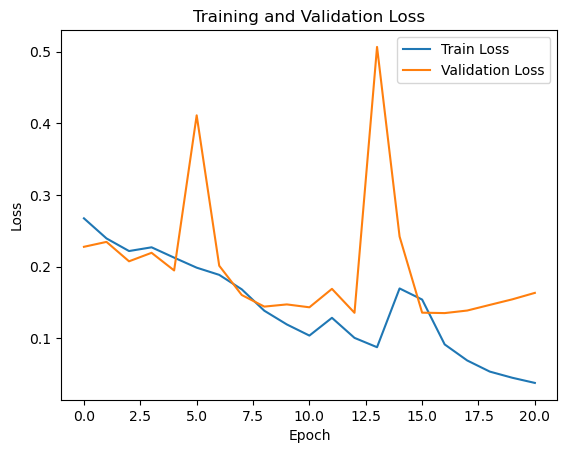

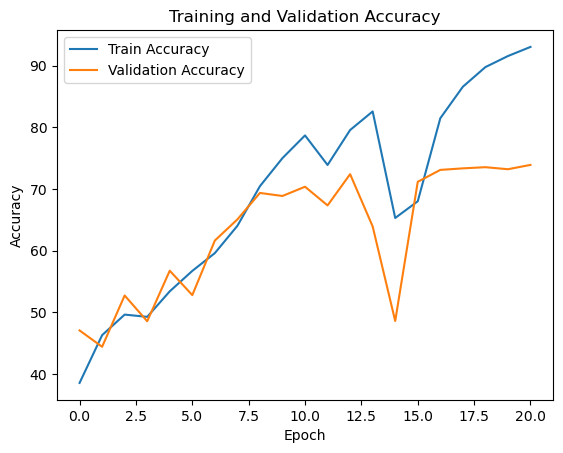

Optimizer : Adam, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3129, Train Accuracy: 22.20%, Val Loss: 0.2941, Val Accuracy: 28.58%
Epoch [2/30], Train Loss: 0.2735, Train Accuracy: 32.74%, Val Loss: 0.2686, Val Accuracy: 35.31%
Epoch [3/30], Train Loss: 0.2511, Train Accuracy: 40.14%, Val Loss: 0.2486, Val Accuracy: 40.58%
Epoch [4/30], Train Loss: 0.2306, Train Accuracy: 46.06%, Val Loss: 0.2398, Val Accuracy: 43.47%
Epoch [5/30], Train Loss: 0.2121, Train Accuracy: 51.43%, Val Loss: 0.2325, Val Accuracy: 45.02%
Epoch [6/30], Train Loss: 0.1929, Train Accuracy: 56.90%, Val Loss: 0.2342, Val Accuracy: 46.61%
Epoch [7/30], Train Loss: 0.1760, Train Accuracy: 61.08%, Val Loss: 0.2330, Val Accuracy: 48.27%
Epoch [8/30], Train Loss: 0.1575, Train Accuracy: 66.21%, Val Loss: 0.2330, Val Accuracy: 48.50%
Epoch [9/30], Train Loss: 0.1391, Train Accuracy: 70.77%, Val Loss: 0.2383, Val Accuracy: 49.68%
Epoch [10/30], Train Loss: 0.1212, Train Accuracy: 74.98%, Val Loss: 0.2545, Val Accura

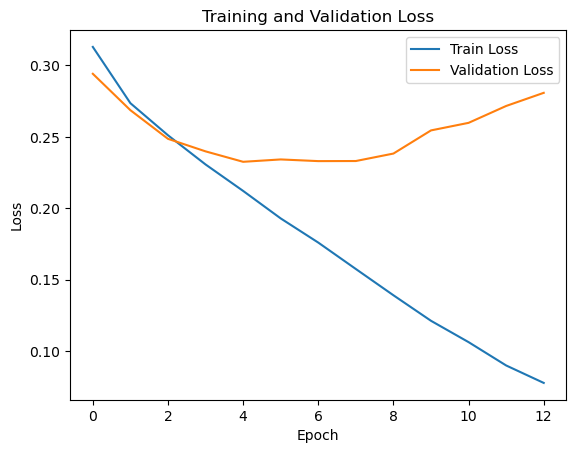

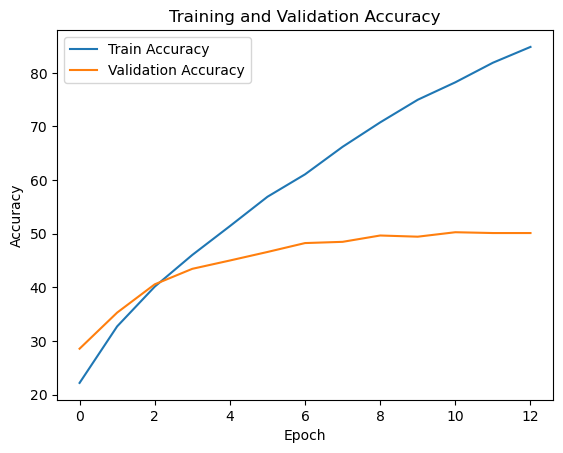

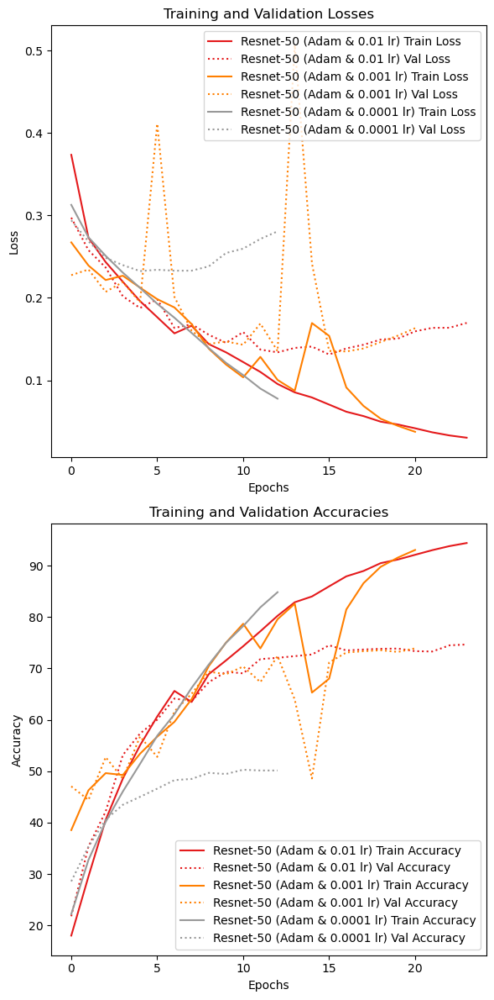

In [23]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adam, Learning rate: {i}")
    model = torchvision.models.resnet50(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Resnet-50 (Adam & {i} lr)')

resnet_50_adam_metrics=metrics
resnet_50_adam_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

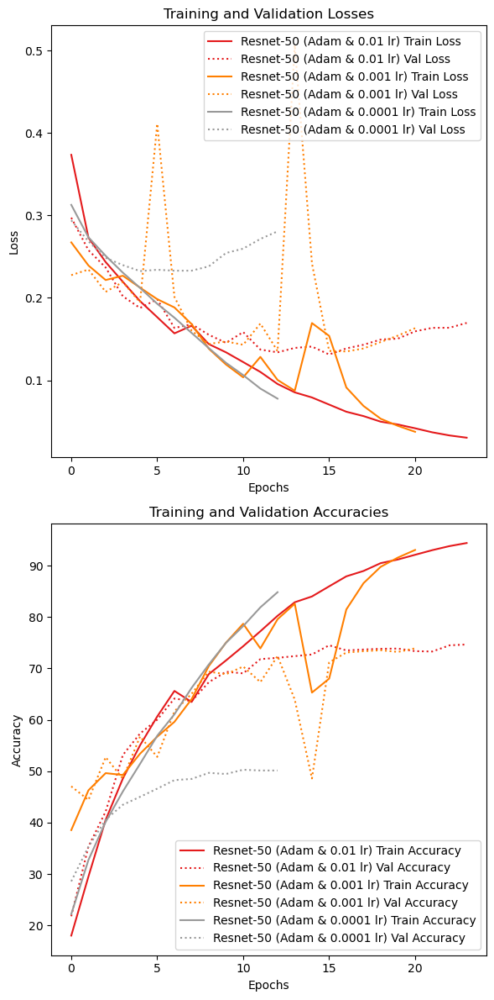

In [24]:
plot_cnn_performance(metrics, model_names)

### Resnet 50 with Adamax optimizer and different learning rate

Optimizer : Adamax, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3461, Train Accuracy: 25.92%, Val Loss: 10.3542, Val Accuracy: 21.15%
Epoch [2/30], Train Loss: 0.2697, Train Accuracy: 35.93%, Val Loss: 0.3311, Val Accuracy: 40.32%
Epoch [3/30], Train Loss: 0.2406, Train Accuracy: 44.00%, Val Loss: 0.3172, Val Accuracy: 49.30%
Epoch [4/30], Train Loss: 0.2167, Train Accuracy: 50.47%, Val Loss: 0.3243, Val Accuracy: 52.36%
Epoch [5/30], Train Loss: 0.2037, Train Accuracy: 55.30%, Val Loss: 0.3790, Val Accuracy: 49.59%
Epoch [6/30], Train Loss: 0.1831, Train Accuracy: 59.57%, Val Loss: 0.1899, Val Accuracy: 60.27%
Epoch [7/30], Train Loss: 0.1665, Train Accuracy: 63.81%, Val Loss: 0.2086, Val Accuracy: 61.83%
Epoch [8/30], Train Loss: 0.1534, Train Accuracy: 66.89%, Val Loss: 0.2328, Val Accuracy: 62.67%
Epoch [9/30], Train Loss: 0.1389, Train Accuracy: 70.43%, Val Loss: 0.1700, Val Accuracy: 66.28%
Epoch [10/30], Train Loss: 0.1188, Train Accuracy: 75.71%, Val Loss: 0.1810, Val Accur

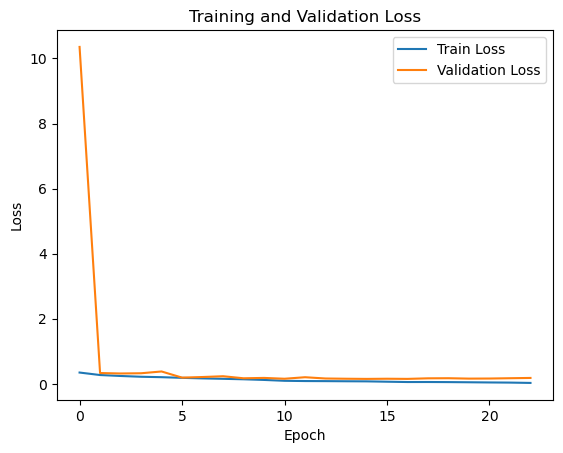

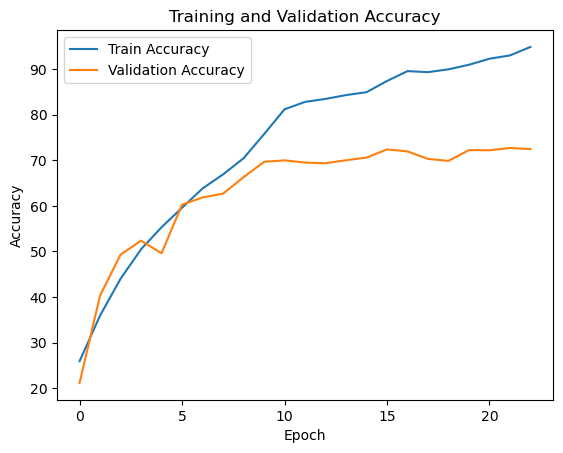

Optimizer : Adamax, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2795, Train Accuracy: 32.79%, Val Loss: 0.2523, Val Accuracy: 40.84%
Epoch [2/30], Train Loss: 0.2312, Train Accuracy: 46.20%, Val Loss: 0.2334, Val Accuracy: 47.41%
Epoch [3/30], Train Loss: 0.2061, Train Accuracy: 53.45%, Val Loss: 0.2170, Val Accuracy: 50.41%
Epoch [4/30], Train Loss: 0.1874, Train Accuracy: 58.76%, Val Loss: 0.2082, Val Accuracy: 53.97%
Epoch [5/30], Train Loss: 0.1689, Train Accuracy: 63.18%, Val Loss: 0.1955, Val Accuracy: 56.64%
Epoch [6/30], Train Loss: 0.1532, Train Accuracy: 67.36%, Val Loss: 0.1919, Val Accuracy: 58.27%
Epoch [7/30], Train Loss: 0.1356, Train Accuracy: 71.42%, Val Loss: 0.1888, Val Accuracy: 60.14%
Epoch [8/30], Train Loss: 0.1187, Train Accuracy: 75.32%, Val Loss: 0.1949, Val Accuracy: 60.68%
Epoch [9/30], Train Loss: 0.0992, Train Accuracy: 79.90%, Val Loss: 0.1830, Val Accuracy: 62.97%
Epoch [10/30], Train Loss: 0.0838, Train Accuracy: 83.27%, Val Loss: 0.2041, Val Accur

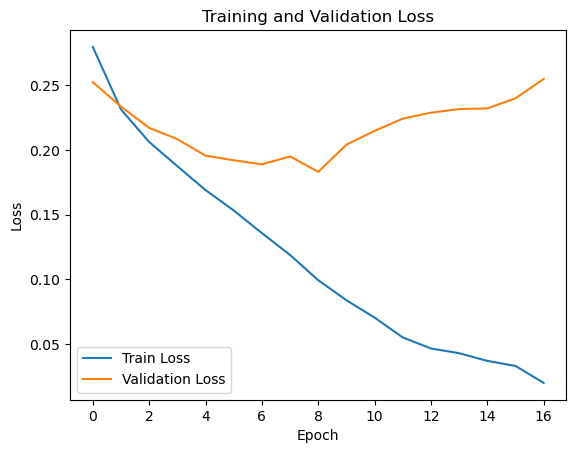

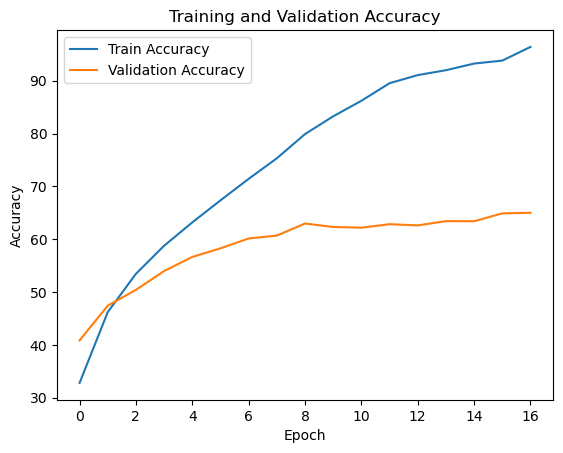

Optimizer : Adamax, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3254, Train Accuracy: 16.84%, Val Loss: 0.3115, Val Accuracy: 19.89%
Epoch [2/30], Train Loss: 0.3006, Train Accuracy: 23.34%, Val Loss: 0.2954, Val Accuracy: 24.99%
Epoch [3/30], Train Loss: 0.2878, Train Accuracy: 27.73%, Val Loss: 0.2873, Val Accuracy: 28.54%
Epoch [4/30], Train Loss: 0.2793, Train Accuracy: 30.67%, Val Loss: 0.2782, Val Accuracy: 30.99%
Epoch [5/30], Train Loss: 0.2689, Train Accuracy: 34.76%, Val Loss: 0.2715, Val Accuracy: 33.36%
Epoch [6/30], Train Loss: 0.2592, Train Accuracy: 37.38%, Val Loss: 0.2634, Val Accuracy: 36.53%
Epoch [7/30], Train Loss: 0.2500, Train Accuracy: 40.20%, Val Loss: 0.2588, Val Accuracy: 38.23%
Epoch [8/30], Train Loss: 0.2392, Train Accuracy: 43.60%, Val Loss: 0.2536, Val Accuracy: 40.49%
Epoch [9/30], Train Loss: 0.2264, Train Accuracy: 47.62%, Val Loss: 0.2482, Val Accuracy: 41.77%
Epoch [10/30], Train Loss: 0.2135, Train Accuracy: 51.16%, Val Loss: 0.2459, Val Accu

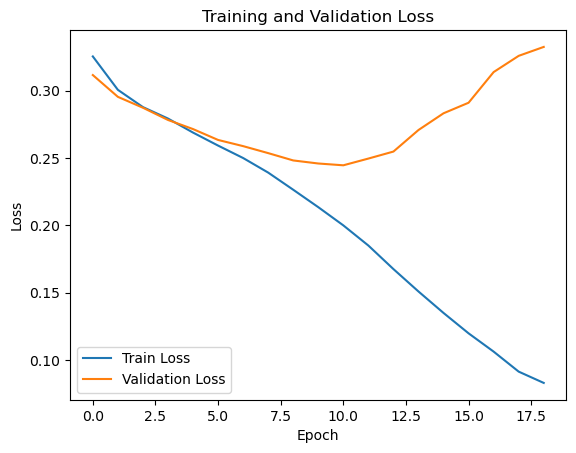

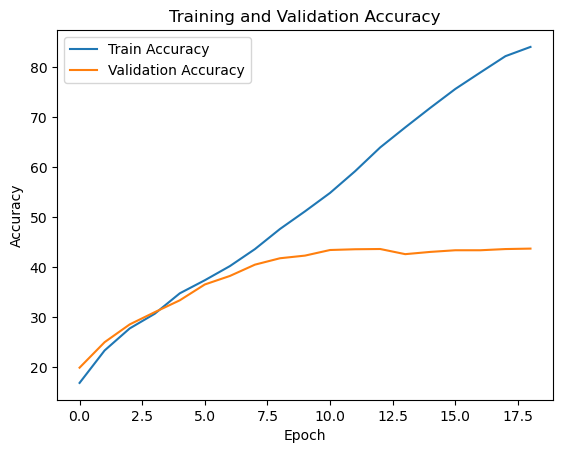

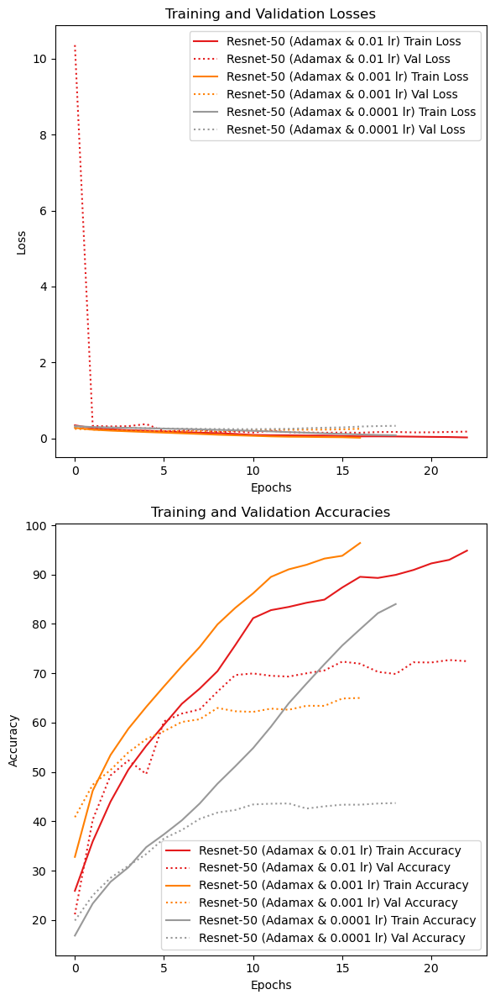

In [25]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adamax, Learning rate: {i}")
    model = torchvision.models.resnet50(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adamax(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Resnet-50 (Adamax & {i} lr)')

resnet_50_adamax_metrics=metrics
resnet_50_adamax_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

### Resnet 50 with AdamW optimizer and different learning rate

Optimizer : AdamW, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3661, Train Accuracy: 19.30%, Val Loss: 0.4141, Val Accuracy: 22.52%
Epoch [2/30], Train Loss: 0.2677, Train Accuracy: 33.62%, Val Loss: 4.0085, Val Accuracy: 25.56%
Epoch [3/30], Train Loss: 0.2418, Train Accuracy: 41.63%, Val Loss: 0.2865, Val Accuracy: 42.78%
Epoch [4/30], Train Loss: 0.2210, Train Accuracy: 48.29%, Val Loss: 0.2176, Val Accuracy: 51.34%
Epoch [5/30], Train Loss: 0.2486, Train Accuracy: 40.25%, Val Loss: 0.2460, Val Accuracy: 41.78%
Epoch [6/30], Train Loss: 0.2201, Train Accuracy: 48.60%, Val Loss: 0.2193, Val Accuracy: 51.33%
Epoch [7/30], Train Loss: 0.1966, Train Accuracy: 54.92%, Val Loss: 0.1925, Val Accuracy: 56.56%
Epoch [8/30], Train Loss: 0.1806, Train Accuracy: 59.54%, Val Loss: 0.1818, Val Accuracy: 59.23%
Epoch [9/30], Train Loss: 0.1668, Train Accuracy: 63.15%, Val Loss: 0.1781, Val Accuracy: 60.85%
Epoch [10/30], Train Loss: 0.1534, Train Accuracy: 66.79%, Val Loss: 0.1695, Val Accurac

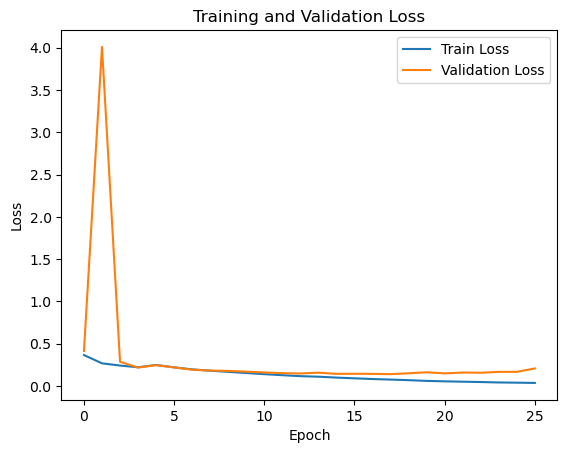

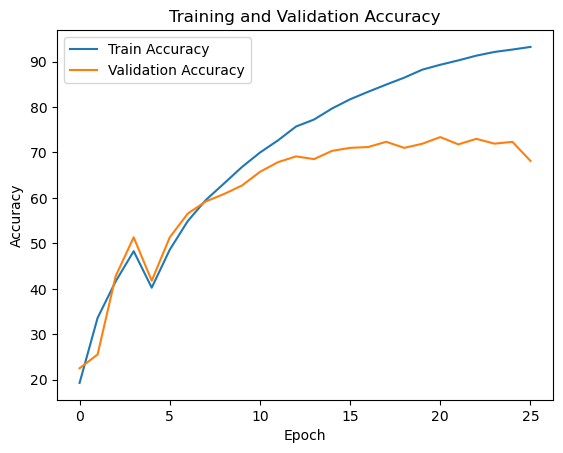

Optimizer : AdamW, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2694, Train Accuracy: 37.67%, Val Loss: 18.3670, Val Accuracy: 25.86%
Epoch [2/30], Train Loss: 0.2223, Train Accuracy: 50.12%, Val Loss: 0.4180, Val Accuracy: 49.16%
Epoch [3/30], Train Loss: 0.1955, Train Accuracy: 57.99%, Val Loss: 0.1922, Val Accuracy: 57.87%
Epoch [4/30], Train Loss: 0.2013, Train Accuracy: 57.38%, Val Loss: 0.2420, Val Accuracy: 46.38%
Epoch [5/30], Train Loss: 0.1914, Train Accuracy: 59.36%, Val Loss: 0.2518, Val Accuracy: 60.80%
Epoch [6/30], Train Loss: 0.1768, Train Accuracy: 62.27%, Val Loss: 0.1883, Val Accuracy: 57.80%
Epoch [7/30], Train Loss: 0.1586, Train Accuracy: 65.99%, Val Loss: 0.1758, Val Accuracy: 61.68%
Epoch [8/30], Train Loss: 0.2122, Train Accuracy: 53.57%, Val Loss: 0.1885, Val Accuracy: 59.16%
Epoch [9/30], Train Loss: 0.1624, Train Accuracy: 65.73%, Val Loss: 0.1705, Val Accuracy: 66.67%
Epoch [10/30], Train Loss: 0.1379, Train Accuracy: 71.31%, Val Loss: 0.1454, Val Accur

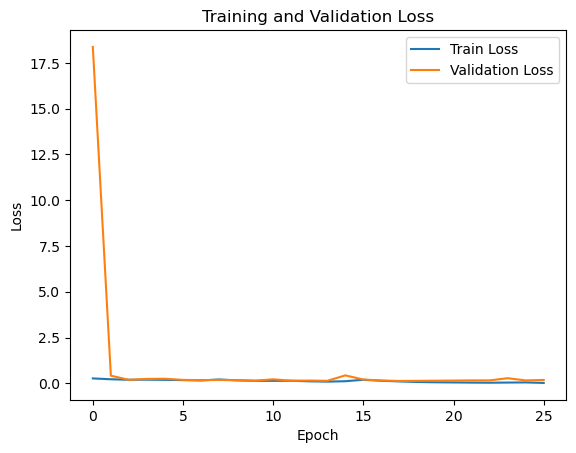

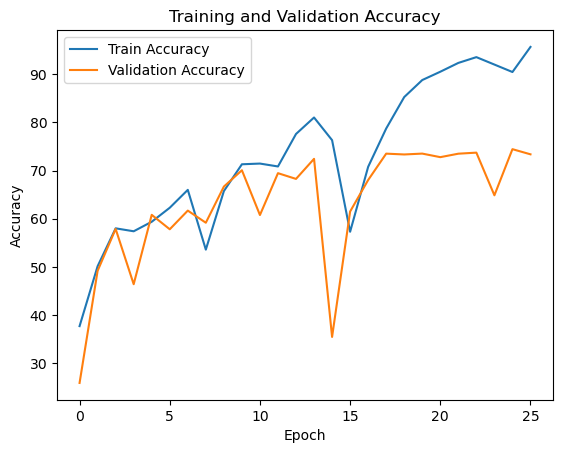

Optimizer : AdamW, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3149, Train Accuracy: 20.85%, Val Loss: 0.2968, Val Accuracy: 27.42%
Epoch [2/30], Train Loss: 0.2786, Train Accuracy: 31.63%, Val Loss: 0.2693, Val Accuracy: 34.34%
Epoch [3/30], Train Loss: 0.2565, Train Accuracy: 38.27%, Val Loss: 0.2574, Val Accuracy: 38.45%
Epoch [4/30], Train Loss: 0.2368, Train Accuracy: 44.48%, Val Loss: 0.2448, Val Accuracy: 42.23%
Epoch [5/30], Train Loss: 0.2202, Train Accuracy: 49.05%, Val Loss: 0.2394, Val Accuracy: 44.39%
Epoch [6/30], Train Loss: 0.2031, Train Accuracy: 54.05%, Val Loss: 0.2335, Val Accuracy: 46.17%
Epoch [7/30], Train Loss: 0.1868, Train Accuracy: 58.38%, Val Loss: 0.2358, Val Accuracy: 47.10%
Epoch [8/30], Train Loss: 0.1693, Train Accuracy: 63.16%, Val Loss: 0.2340, Val Accuracy: 47.97%
Epoch [9/30], Train Loss: 0.1522, Train Accuracy: 67.40%, Val Loss: 0.2408, Val Accuracy: 47.86%
Epoch [10/30], Train Loss: 0.1345, Train Accuracy: 71.85%, Val Loss: 0.2478, Val Accur

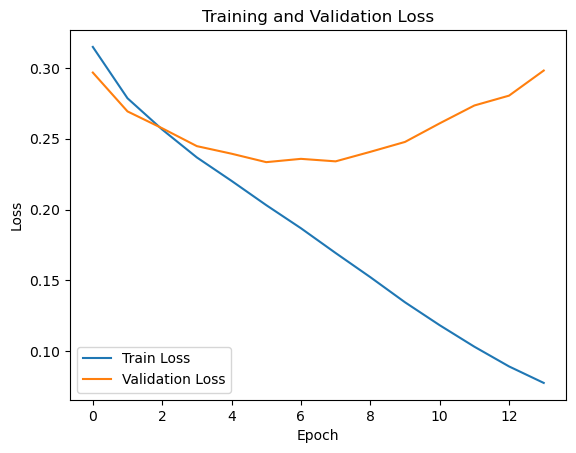

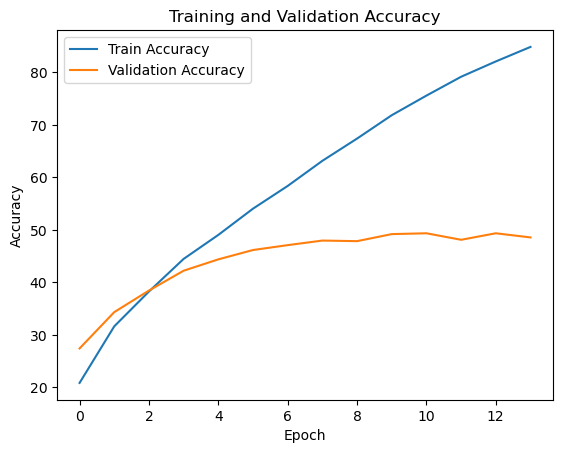

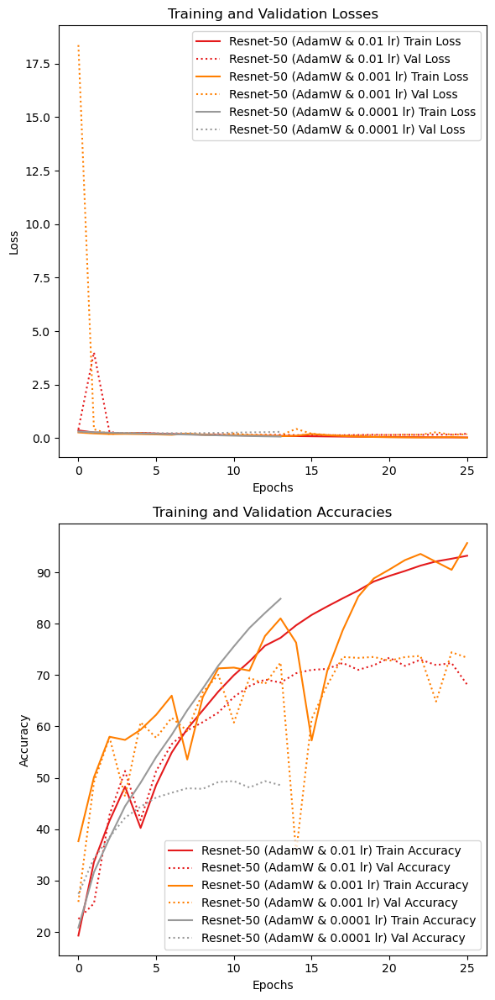

In [26]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : AdamW, Learning rate: {i}")
    model = torchvision.models.resnet50(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.AdamW(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Resnet-50 (AdamW & {i} lr)')

resnet_50_adamw_metrics=metrics
resnet_50_adamw_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

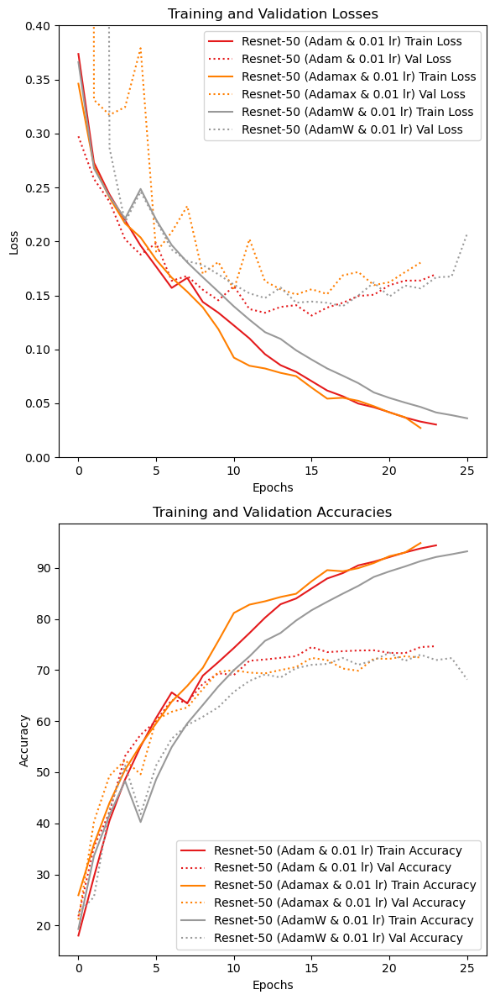

In [54]:
plot_cnn_performance([resnet_50_adam_metrics[0],resnet_50_adamax_metrics[0], resnet_50_adamw_metrics[0]],[resnet_50_adam_name[0],resnet_50_adamax_name[0],resnet_50_adamw_name[0]], ylim=(0,0.4))

### wiTH DROPOUT LAYER

Optimizer : AdamW, Learning rate: 0.01, Dropout: 0.2
Epoch [1/30], Train Loss: 0.3838, Train Accuracy: 16.88%, Val Loss: 0.3010, Val Accuracy: 23.12%
Epoch [2/30], Train Loss: 0.2780, Train Accuracy: 30.08%, Val Loss: 0.2816, Val Accuracy: 29.93%
Epoch [3/30], Train Loss: 0.2481, Train Accuracy: 38.81%, Val Loss: 0.2389, Val Accuracy: 41.90%
Epoch [4/30], Train Loss: 0.2263, Train Accuracy: 46.05%, Val Loss: 0.2315, Val Accuracy: 45.29%
Epoch [5/30], Train Loss: 0.2101, Train Accuracy: 51.25%, Val Loss: 0.2267, Val Accuracy: 50.44%
Epoch [6/30], Train Loss: 0.1949, Train Accuracy: 55.59%, Val Loss: 0.2718, Val Accuracy: 53.45%
Epoch [7/30], Train Loss: 0.1925, Train Accuracy: 56.65%, Val Loss: 0.1901, Val Accuracy: 57.32%
Epoch [8/30], Train Loss: 0.1687, Train Accuracy: 62.83%, Val Loss: 2.0671, Val Accuracy: 37.91%
Epoch [9/30], Train Loss: 0.1702, Train Accuracy: 62.60%, Val Loss: 0.1886, Val Accuracy: 60.23%
Epoch [10/30], Train Loss: 0.1574, Train Accuracy: 65.72%, Val Loss: 1.380

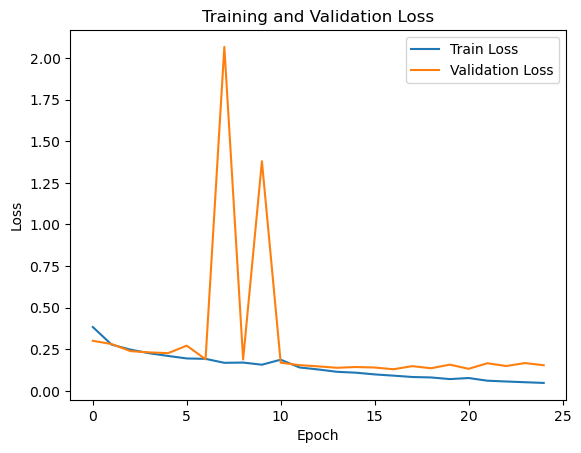

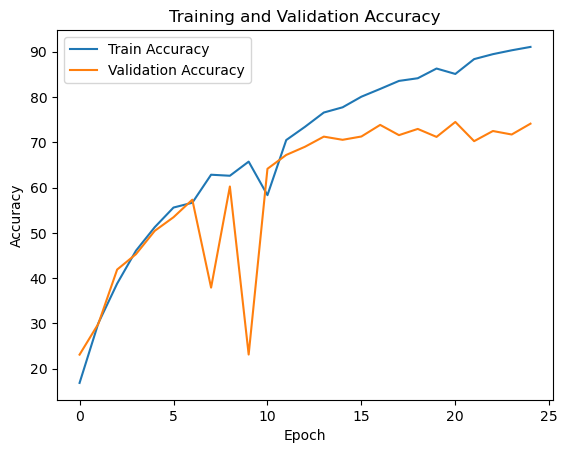

Optimizer : AdamW, Learning rate: 0.01, Dropout: 0.35
Epoch [1/30], Train Loss: 0.4319, Train Accuracy: 13.48%, Val Loss: 0.3141, Val Accuracy: 18.71%
Epoch [2/30], Train Loss: 0.2961, Train Accuracy: 28.14%, Val Loss: 0.3946, Val Accuracy: 31.39%
Epoch [3/30], Train Loss: 0.2599, Train Accuracy: 37.41%, Val Loss: 0.2313, Val Accuracy: 45.22%
Epoch [4/30], Train Loss: 0.2309, Train Accuracy: 45.85%, Val Loss: 0.2253, Val Accuracy: 47.32%
Epoch [5/30], Train Loss: 0.2124, Train Accuracy: 51.19%, Val Loss: 0.2096, Val Accuracy: 52.65%
Epoch [6/30], Train Loss: 0.1965, Train Accuracy: 55.75%, Val Loss: 0.1910, Val Accuracy: 56.56%
Epoch [7/30], Train Loss: 0.1802, Train Accuracy: 59.98%, Val Loss: 0.1901, Val Accuracy: 61.50%
Epoch [8/30], Train Loss: 0.1645, Train Accuracy: 64.15%, Val Loss: 0.2014, Val Accuracy: 61.56%
Epoch [9/30], Train Loss: 0.1534, Train Accuracy: 67.21%, Val Loss: 0.2236, Val Accuracy: 59.97%
Epoch [10/30], Train Loss: 0.1565, Train Accuracy: 66.53%, Val Loss: 0.18

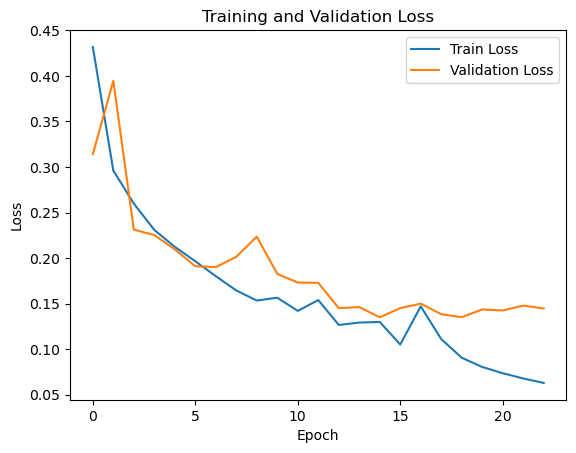

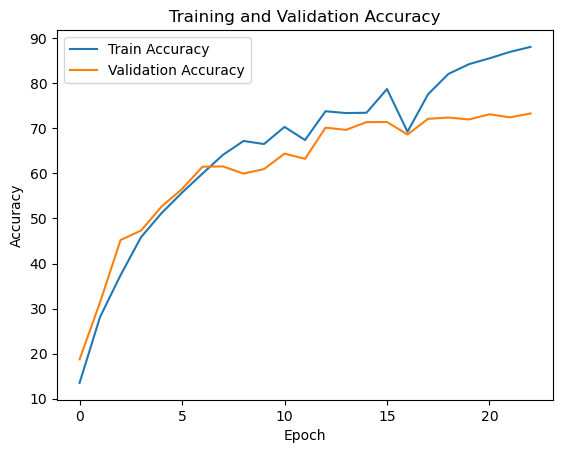

Optimizer : AdamW, Learning rate: 0.01, Dropout: 0.5
Epoch [1/30], Train Loss: 0.4426, Train Accuracy: 18.34%, Val Loss: 0.3439, Val Accuracy: 23.72%
Epoch [2/30], Train Loss: 0.3320, Train Accuracy: 27.18%, Val Loss: 0.3167, Val Accuracy: 26.92%
Epoch [3/30], Train Loss: 0.2871, Train Accuracy: 34.96%, Val Loss: 0.3066, Val Accuracy: 39.21%
Epoch [4/30], Train Loss: 0.2464, Train Accuracy: 43.09%, Val Loss: 0.2272, Val Accuracy: 45.98%
Epoch [5/30], Train Loss: 0.2274, Train Accuracy: 47.20%, Val Loss: 0.2234, Val Accuracy: 52.07%
Epoch [6/30], Train Loss: 0.2212, Train Accuracy: 48.60%, Val Loss: 0.2125, Val Accuracy: 50.77%
Epoch [7/30], Train Loss: 0.2031, Train Accuracy: 53.90%, Val Loss: 0.1976, Val Accuracy: 55.28%
Epoch [8/30], Train Loss: 0.1958, Train Accuracy: 56.09%, Val Loss: 0.1990, Val Accuracy: 57.88%
Epoch [9/30], Train Loss: 0.1742, Train Accuracy: 61.90%, Val Loss: 0.2198, Val Accuracy: 58.18%
Epoch [10/30], Train Loss: 0.1700, Train Accuracy: 63.60%, Val Loss: 0.172

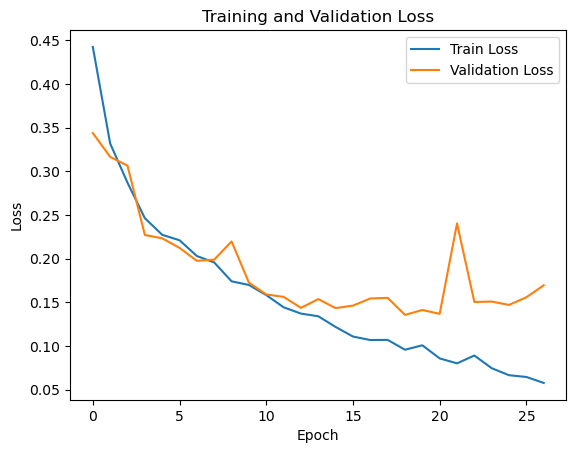

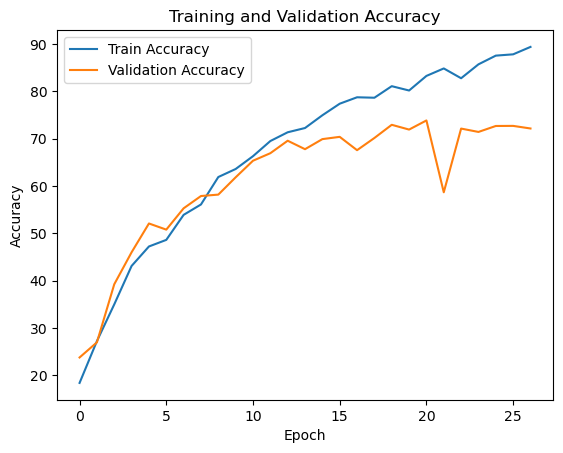

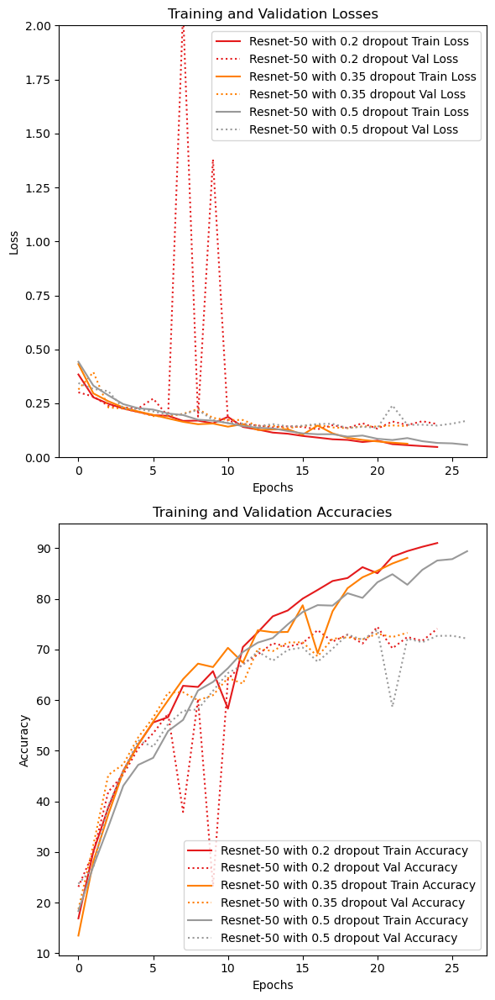

In [55]:
metrics=[]
model_names=[]
for i in [0.2,0.35,0.5]:
    print(f"Optimizer : AdamW, Learning rate: 0.01, Dropout: {i}")
    model = ModelWithDropout(model_name='resnet50', num_classes=10, dropout_prob=i).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.AdamW(model.parameters(), lr=0.01)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Resnet-50 with {i} dropout')

resnet_50_dropout_metrics=metrics
resnet_50_dropout_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

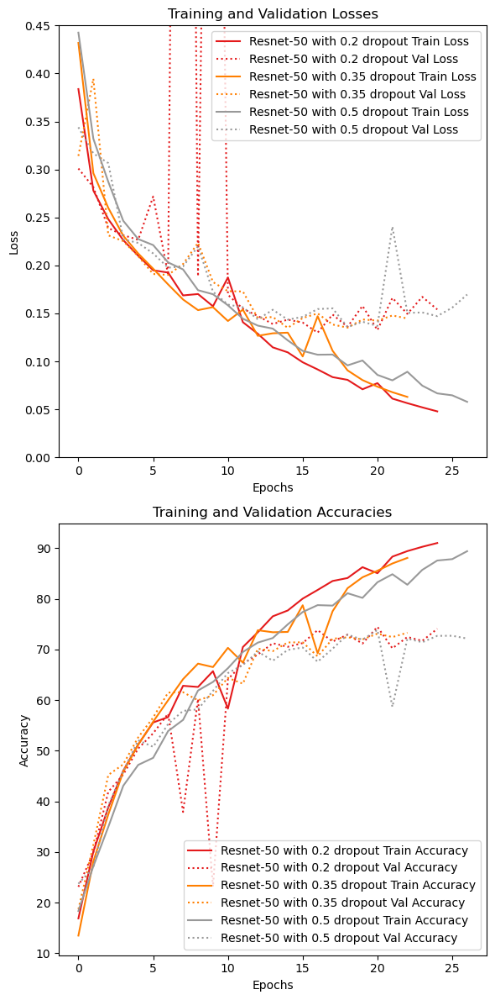

In [58]:
plot_cnn_performance(resnet_50_dropout_metrics, resnet_50_dropout_name, ylim=(0,0.45))

## Densenet 121

## Densenet base model

Epoch [1/30], Train Loss: 0.2204, Train Accuracy: 48.95%, Val Loss: 0.1943, Val Accuracy: 55.92%
Epoch [2/30], Train Loss: 0.1633, Train Accuracy: 64.08%, Val Loss: 0.1614, Val Accuracy: 65.08%
Epoch [3/30], Train Loss: 0.1349, Train Accuracy: 71.06%, Val Loss: 0.1411, Val Accuracy: 69.49%
Epoch [4/30], Train Loss: 0.1150, Train Accuracy: 75.88%, Val Loss: 0.1378, Val Accuracy: 71.65%
Epoch [5/30], Train Loss: 0.0971, Train Accuracy: 80.03%, Val Loss: 0.1350, Val Accuracy: 72.35%
Epoch [6/30], Train Loss: 0.0831, Train Accuracy: 82.90%, Val Loss: 0.1309, Val Accuracy: 73.00%
Epoch [7/30], Train Loss: 0.0706, Train Accuracy: 85.86%, Val Loss: 0.1301, Val Accuracy: 74.14%
Epoch [8/30], Train Loss: 0.0580, Train Accuracy: 88.53%, Val Loss: 0.1437, Val Accuracy: 73.01%
Epoch [9/30], Train Loss: 0.0491, Train Accuracy: 90.47%, Val Loss: 0.1408, Val Accuracy: 74.19%
Epoch [10/30], Train Loss: 0.0398, Train Accuracy: 92.48%, Val Loss: 0.1573, Val Accuracy: 74.02%
Epoch [11/30], Train Loss: 0.

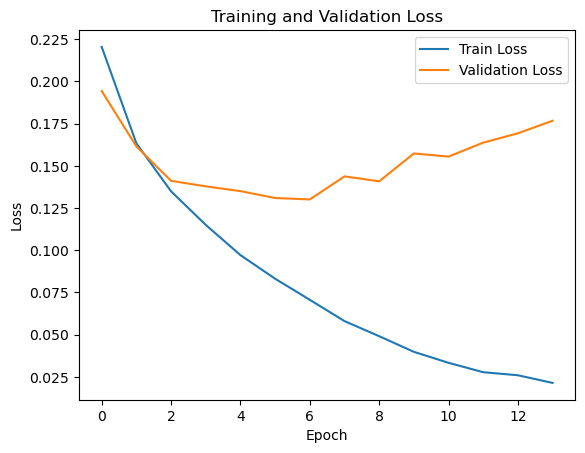

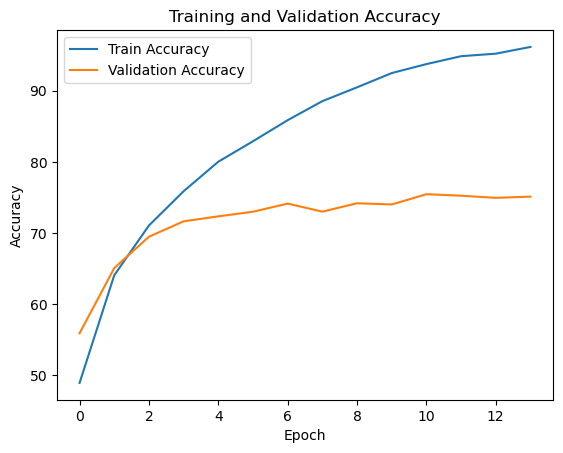

In [27]:
# Densenet121 model
model = torchvision.models.densenet121(num_classes=10)  # CIFAR-10 has 10 classes
model = model.to(device)

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train the model
num_epochs = 30
train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, criterion, optimizer, num_epochs=num_epochs, patience=8)

### Densenet 121 with Adam optimizer and different learning rates

Optimizer : Adam, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.2783, Train Accuracy: 33.36%, Val Loss: 0.3138, Val Accuracy: 40.07%
Epoch [2/30], Train Loss: 0.2291, Train Accuracy: 45.42%, Val Loss: 0.2047, Val Accuracy: 52.17%
Epoch [3/30], Train Loss: 0.1927, Train Accuracy: 56.08%, Val Loss: 0.1876, Val Accuracy: 57.53%
Epoch [4/30], Train Loss: 0.1681, Train Accuracy: 62.70%, Val Loss: 0.1554, Val Accuracy: 66.21%
Epoch [5/30], Train Loss: 0.1468, Train Accuracy: 68.32%, Val Loss: 0.1513, Val Accuracy: 67.53%
Epoch [6/30], Train Loss: 0.1304, Train Accuracy: 72.17%, Val Loss: 0.1556, Val Accuracy: 67.81%
Epoch [7/30], Train Loss: 0.1174, Train Accuracy: 75.36%, Val Loss: 0.1343, Val Accuracy: 71.98%
Epoch [8/30], Train Loss: 0.1062, Train Accuracy: 77.89%, Val Loss: 0.1278, Val Accuracy: 73.38%
Epoch [9/30], Train Loss: 0.0945, Train Accuracy: 80.69%, Val Loss: 0.1288, Val Accuracy: 74.20%
Epoch [10/30], Train Loss: 0.0859, Train Accuracy: 82.71%, Val Loss: 0.1246, Val Accuracy

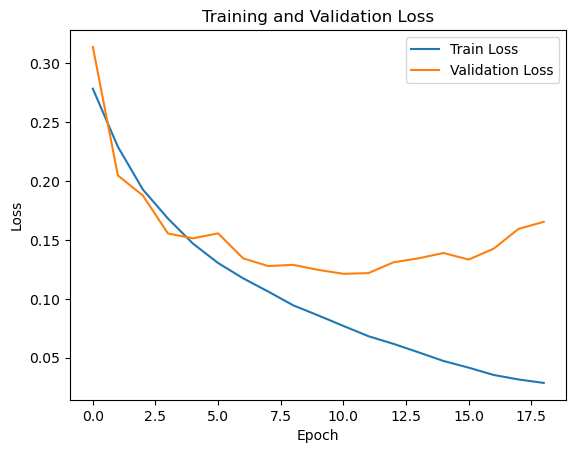

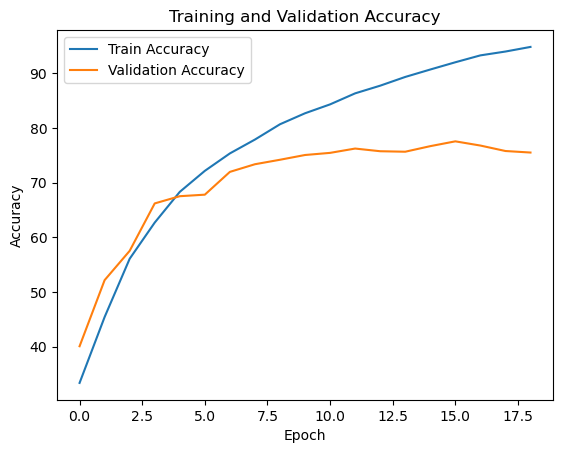

Optimizer : Adam, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2229, Train Accuracy: 48.05%, Val Loss: 0.1919, Val Accuracy: 56.94%
Epoch [2/30], Train Loss: 0.1665, Train Accuracy: 63.29%, Val Loss: 0.1597, Val Accuracy: 65.32%
Epoch [3/30], Train Loss: 0.1382, Train Accuracy: 70.45%, Val Loss: 0.1415, Val Accuracy: 69.54%
Epoch [4/30], Train Loss: 0.1168, Train Accuracy: 75.45%, Val Loss: 0.1323, Val Accuracy: 71.65%
Epoch [5/30], Train Loss: 0.0991, Train Accuracy: 79.55%, Val Loss: 0.1380, Val Accuracy: 71.85%
Epoch [6/30], Train Loss: 0.0845, Train Accuracy: 82.79%, Val Loss: 0.1305, Val Accuracy: 73.05%
Epoch [7/30], Train Loss: 0.0711, Train Accuracy: 85.83%, Val Loss: 0.1317, Val Accuracy: 74.02%
Epoch [8/30], Train Loss: 0.0595, Train Accuracy: 88.31%, Val Loss: 0.1378, Val Accuracy: 74.21%
Epoch [9/30], Train Loss: 0.0487, Train Accuracy: 90.59%, Val Loss: 0.1434, Val Accuracy: 75.28%
Epoch [10/30], Train Loss: 0.0411, Train Accuracy: 92.13%, Val Loss: 0.1489, Val Accurac

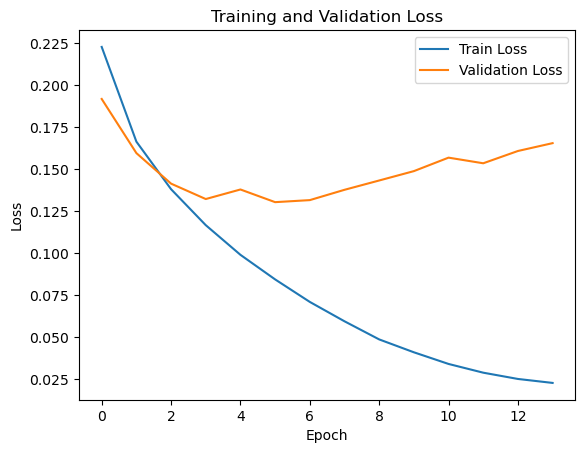

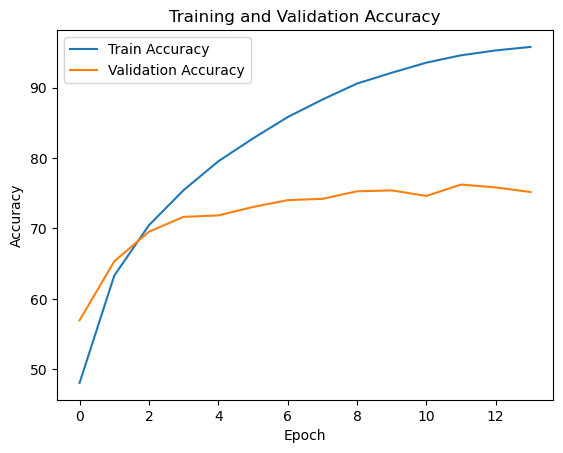

Optimizer : Adam, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.2840, Train Accuracy: 37.55%, Val Loss: 0.2278, Val Accuracy: 46.99%
Epoch [2/30], Train Loss: 0.2080, Train Accuracy: 52.59%, Val Loss: 0.2066, Val Accuracy: 52.61%
Epoch [3/30], Train Loss: 0.1777, Train Accuracy: 60.79%, Val Loss: 0.1974, Val Accuracy: 55.03%
Epoch [4/30], Train Loss: 0.1502, Train Accuracy: 68.29%, Val Loss: 0.1941, Val Accuracy: 56.62%
Epoch [5/30], Train Loss: 0.1231, Train Accuracy: 74.97%, Val Loss: 0.1982, Val Accuracy: 57.89%
Epoch [6/30], Train Loss: 0.0991, Train Accuracy: 80.56%, Val Loss: 0.2131, Val Accuracy: 56.46%
Epoch [7/30], Train Loss: 0.0792, Train Accuracy: 84.72%, Val Loss: 0.2208, Val Accuracy: 57.57%
Epoch [8/30], Train Loss: 0.0627, Train Accuracy: 88.33%, Val Loss: 0.2379, Val Accuracy: 57.53%
Epoch [9/30], Train Loss: 0.0513, Train Accuracy: 90.62%, Val Loss: 0.2434, Val Accuracy: 58.36%
Epoch [10/30], Train Loss: 0.0443, Train Accuracy: 91.99%, Val Loss: 0.2611, Val Accura

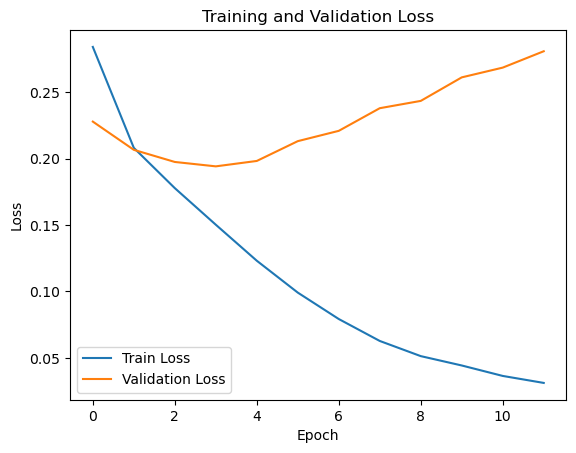

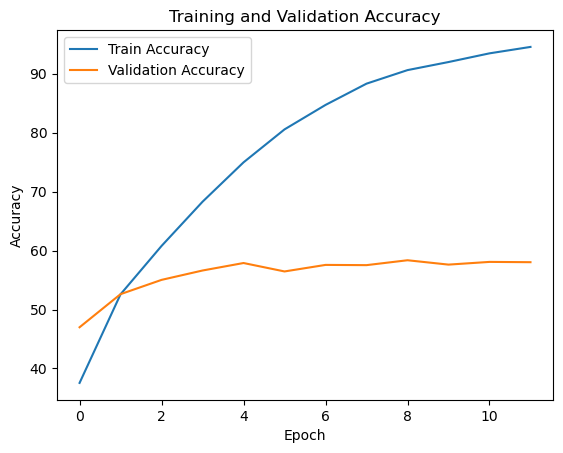

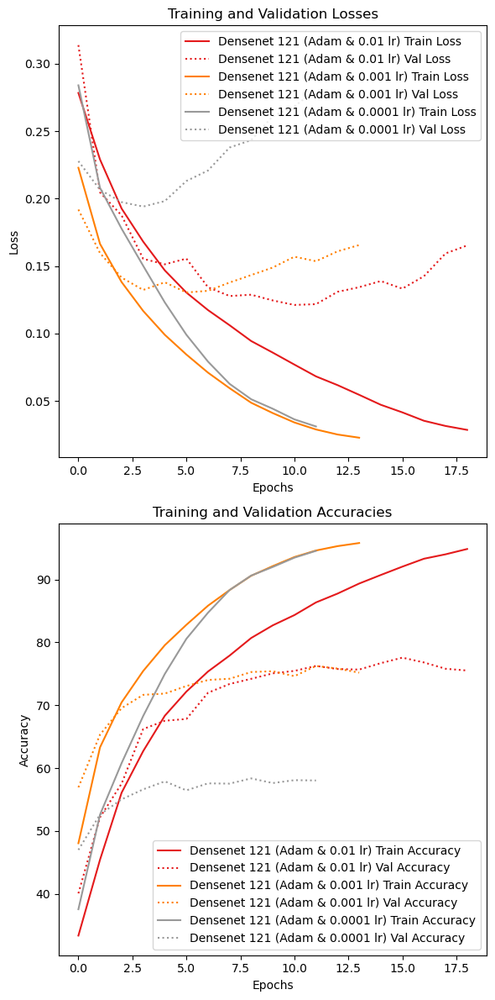

In [28]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adam, Learning rate: {i}")
    model = torchvision.models.densenet121(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Densenet 121 (Adam & {i} lr)')

densenet_121_adam_metrics=metrics
densenet_121_adam_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

### Densenet 121 with Adamax optimizer and different learning rates

Optimizer : Adamax, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.2556, Train Accuracy: 39.28%, Val Loss: 0.2262, Val Accuracy: 48.82%
Epoch [2/30], Train Loss: 0.1979, Train Accuracy: 54.69%, Val Loss: 0.1800, Val Accuracy: 59.19%
Epoch [3/30], Train Loss: 0.1657, Train Accuracy: 63.45%, Val Loss: 0.1670, Val Accuracy: 63.87%
Epoch [4/30], Train Loss: 0.1434, Train Accuracy: 69.23%, Val Loss: 0.1548, Val Accuracy: 66.97%
Epoch [5/30], Train Loss: 0.1272, Train Accuracy: 72.81%, Val Loss: 0.1405, Val Accuracy: 70.44%
Epoch [6/30], Train Loss: 0.1127, Train Accuracy: 76.43%, Val Loss: 0.1305, Val Accuracy: 72.89%
Epoch [7/30], Train Loss: 0.0982, Train Accuracy: 80.08%, Val Loss: 0.1210, Val Accuracy: 74.88%
Epoch [8/30], Train Loss: 0.0882, Train Accuracy: 81.99%, Val Loss: 0.1256, Val Accuracy: 75.09%
Epoch [9/30], Train Loss: 0.0758, Train Accuracy: 84.52%, Val Loss: 0.1414, Val Accuracy: 73.59%
Epoch [10/30], Train Loss: 0.0669, Train Accuracy: 86.61%, Val Loss: 0.1305, Val Accura

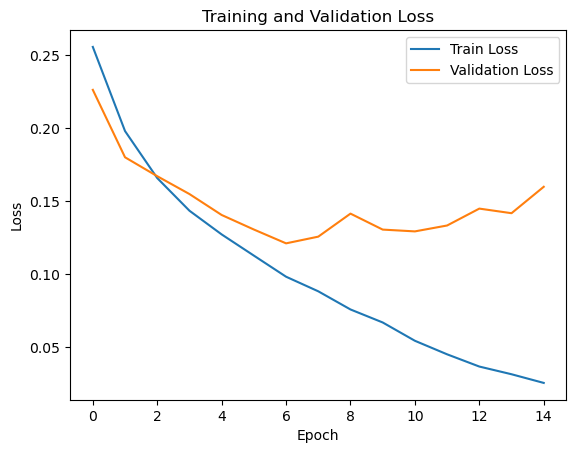

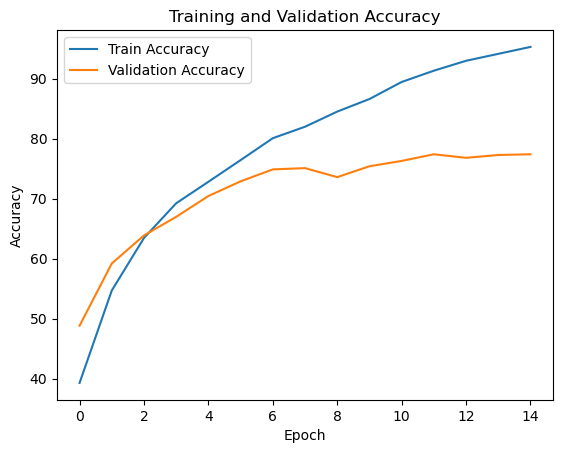

Optimizer : Adamax, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2270, Train Accuracy: 47.24%, Val Loss: 0.1938, Val Accuracy: 56.54%
Epoch [2/30], Train Loss: 0.1728, Train Accuracy: 61.75%, Val Loss: 0.1726, Val Accuracy: 61.53%
Epoch [3/30], Train Loss: 0.1423, Train Accuracy: 69.34%, Val Loss: 0.1587, Val Accuracy: 65.24%
Epoch [4/30], Train Loss: 0.1170, Train Accuracy: 75.50%, Val Loss: 0.1606, Val Accuracy: 65.90%
Epoch [5/30], Train Loss: 0.0945, Train Accuracy: 80.72%, Val Loss: 0.1734, Val Accuracy: 65.66%
Epoch [6/30], Train Loss: 0.0733, Train Accuracy: 85.53%, Val Loss: 0.1738, Val Accuracy: 67.89%
Epoch [7/30], Train Loss: 0.0583, Train Accuracy: 88.77%, Val Loss: 0.1848, Val Accuracy: 67.30%
Epoch [8/30], Train Loss: 0.0471, Train Accuracy: 91.00%, Val Loss: 0.1961, Val Accuracy: 67.32%
Epoch [9/30], Train Loss: 0.0392, Train Accuracy: 92.58%, Val Loss: 0.2001, Val Accuracy: 67.21%
Epoch [10/30], Train Loss: 0.0325, Train Accuracy: 93.98%, Val Loss: 0.2058, Val Accur

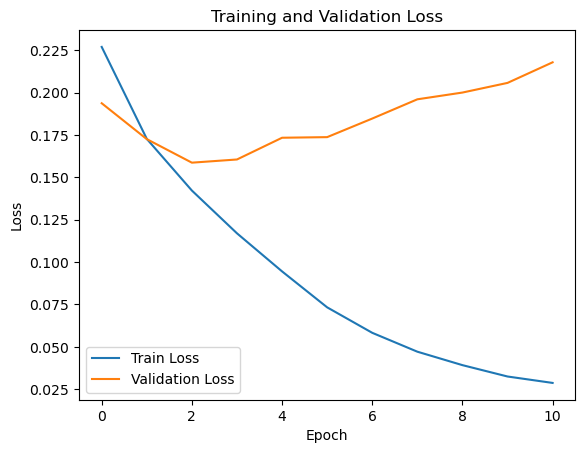

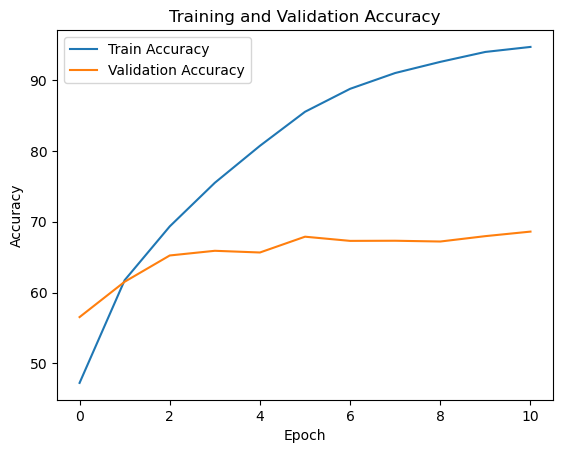

Optimizer : Adamax, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3155, Train Accuracy: 31.10%, Val Loss: 0.2558, Val Accuracy: 39.71%
Epoch [2/30], Train Loss: 0.2387, Train Accuracy: 44.68%, Val Loss: 0.2313, Val Accuracy: 46.01%
Epoch [3/30], Train Loss: 0.2138, Train Accuracy: 51.61%, Val Loss: 0.2179, Val Accuracy: 49.40%
Epoch [4/30], Train Loss: 0.1923, Train Accuracy: 58.05%, Val Loss: 0.2107, Val Accuracy: 52.33%
Epoch [5/30], Train Loss: 0.1710, Train Accuracy: 63.82%, Val Loss: 0.2097, Val Accuracy: 52.18%
Epoch [6/30], Train Loss: 0.1502, Train Accuracy: 69.16%, Val Loss: 0.2123, Val Accuracy: 52.73%
Epoch [7/30], Train Loss: 0.1286, Train Accuracy: 74.72%, Val Loss: 0.2185, Val Accuracy: 52.54%
Epoch [8/30], Train Loss: 0.1100, Train Accuracy: 79.27%, Val Loss: 0.2270, Val Accuracy: 52.29%
Epoch [9/30], Train Loss: 0.0917, Train Accuracy: 83.62%, Val Loss: 0.2368, Val Accuracy: 51.88%
Epoch [10/30], Train Loss: 0.0761, Train Accuracy: 86.88%, Val Loss: 0.2488, Val Accu

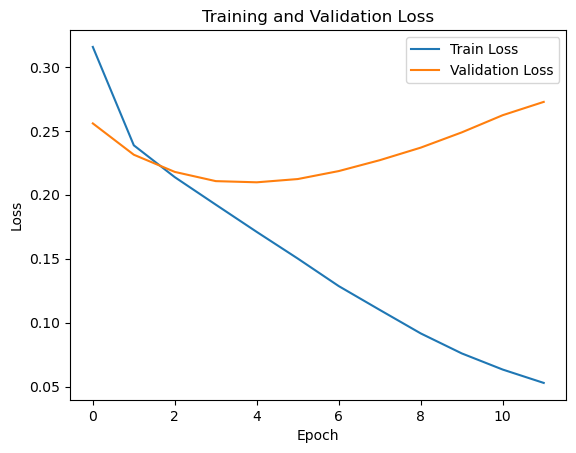

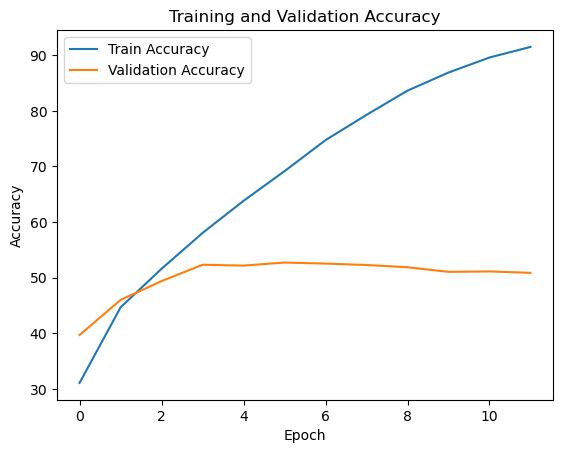

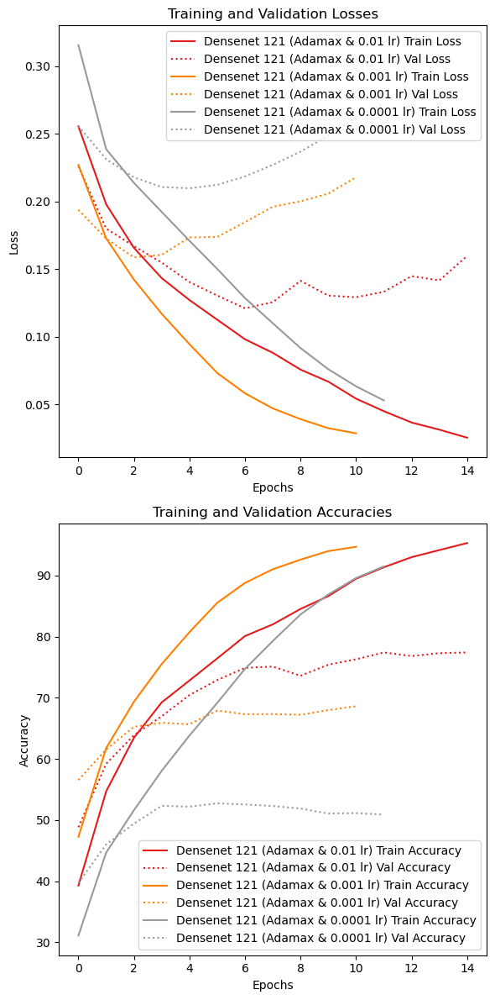

In [29]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adamax, Learning rate: {i}")
    model = torchvision.models.densenet121(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adamax(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Densenet 121 (Adamax & {i} lr)')

densenet_121_adamax_metrics=metrics
densenet_121_adamax_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

### Densenet 121 with AdamW optimizer and different learning rates

Optimizer : AdamW, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.2789, Train Accuracy: 32.42%, Val Loss: 0.2415, Val Accuracy: 42.87%
Epoch [2/30], Train Loss: 0.2169, Train Accuracy: 49.00%, Val Loss: 0.2016, Val Accuracy: 53.61%
Epoch [3/30], Train Loss: 0.1822, Train Accuracy: 58.84%, Val Loss: 0.1712, Val Accuracy: 62.21%
Epoch [4/30], Train Loss: 0.1549, Train Accuracy: 66.29%, Val Loss: 0.1660, Val Accuracy: 63.74%
Epoch [5/30], Train Loss: 0.1371, Train Accuracy: 70.55%, Val Loss: 0.1464, Val Accuracy: 68.45%
Epoch [6/30], Train Loss: 0.1234, Train Accuracy: 74.02%, Val Loss: 0.1344, Val Accuracy: 71.45%
Epoch [7/30], Train Loss: 0.1114, Train Accuracy: 76.88%, Val Loss: 0.1262, Val Accuracy: 73.61%
Epoch [8/30], Train Loss: 0.1021, Train Accuracy: 78.84%, Val Loss: 0.1206, Val Accuracy: 74.96%
Epoch [9/30], Train Loss: 0.0934, Train Accuracy: 80.84%, Val Loss: 0.1224, Val Accuracy: 75.22%
Epoch [10/30], Train Loss: 0.0867, Train Accuracy: 82.47%, Val Loss: 0.1205, Val Accurac

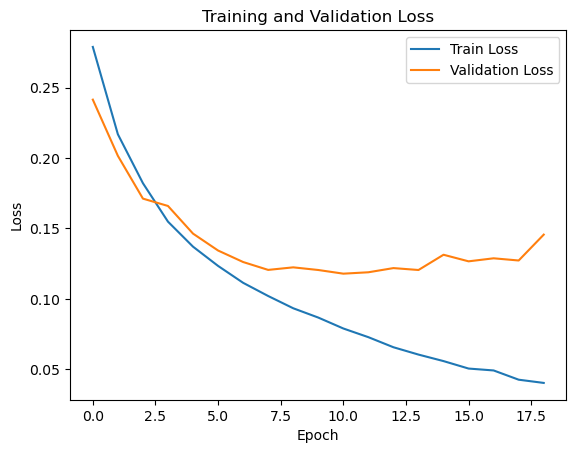

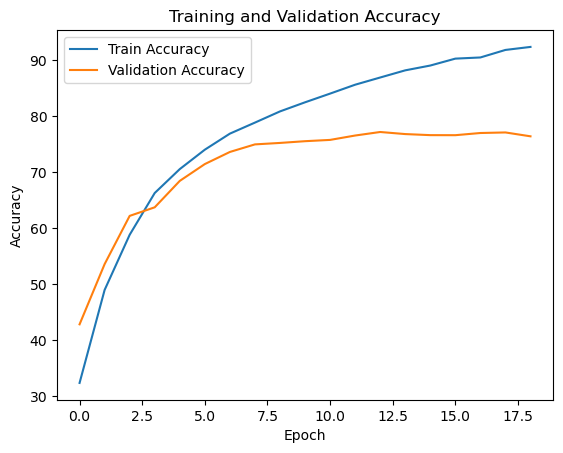

Optimizer : AdamW, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2201, Train Accuracy: 49.44%, Val Loss: 0.1845, Val Accuracy: 58.58%
Epoch [2/30], Train Loss: 0.1616, Train Accuracy: 64.47%, Val Loss: 0.1535, Val Accuracy: 66.40%
Epoch [3/30], Train Loss: 0.1343, Train Accuracy: 71.25%, Val Loss: 0.1423, Val Accuracy: 69.81%
Epoch [4/30], Train Loss: 0.1125, Train Accuracy: 76.37%, Val Loss: 0.1299, Val Accuracy: 72.47%
Epoch [5/30], Train Loss: 0.0955, Train Accuracy: 80.53%, Val Loss: 0.1228, Val Accuracy: 74.68%
Epoch [6/30], Train Loss: 0.0826, Train Accuracy: 83.29%, Val Loss: 0.1241, Val Accuracy: 74.80%
Epoch [7/30], Train Loss: 0.0692, Train Accuracy: 86.01%, Val Loss: 0.1321, Val Accuracy: 74.58%
Epoch [8/30], Train Loss: 0.0580, Train Accuracy: 88.64%, Val Loss: 0.1336, Val Accuracy: 74.98%
Epoch [9/30], Train Loss: 0.0487, Train Accuracy: 90.77%, Val Loss: 0.1348, Val Accuracy: 75.58%
Epoch [10/30], Train Loss: 0.0405, Train Accuracy: 92.32%, Val Loss: 0.1447, Val Accura

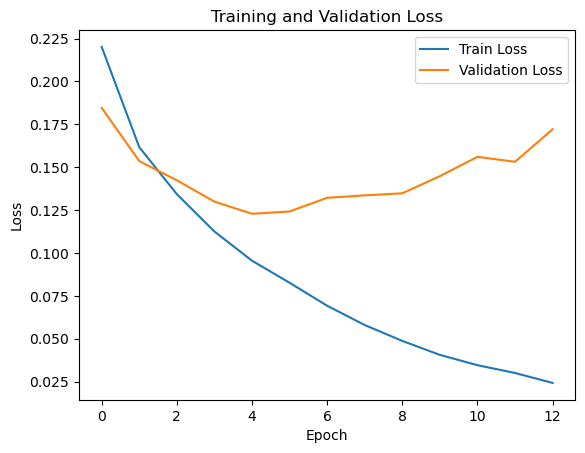

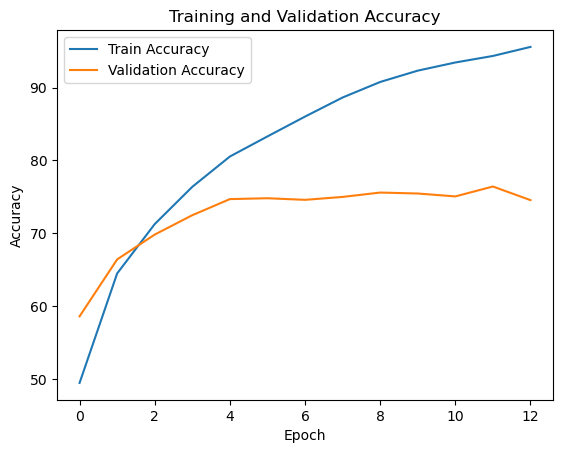

Optimizer : AdamW, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.2870, Train Accuracy: 37.13%, Val Loss: 0.2299, Val Accuracy: 45.62%
Epoch [2/30], Train Loss: 0.2100, Train Accuracy: 51.87%, Val Loss: 0.2067, Val Accuracy: 52.15%
Epoch [3/30], Train Loss: 0.1809, Train Accuracy: 59.81%, Val Loss: 0.1994, Val Accuracy: 55.08%
Epoch [4/30], Train Loss: 0.1546, Train Accuracy: 66.93%, Val Loss: 0.1969, Val Accuracy: 55.90%
Epoch [5/30], Train Loss: 0.1280, Train Accuracy: 73.72%, Val Loss: 0.2063, Val Accuracy: 55.75%
Epoch [6/30], Train Loss: 0.1039, Train Accuracy: 79.32%, Val Loss: 0.2127, Val Accuracy: 56.38%
Epoch [7/30], Train Loss: 0.0820, Train Accuracy: 84.36%, Val Loss: 0.2286, Val Accuracy: 56.52%
Epoch [8/30], Train Loss: 0.0681, Train Accuracy: 87.10%, Val Loss: 0.2331, Val Accuracy: 57.13%
Epoch [9/30], Train Loss: 0.0548, Train Accuracy: 89.88%, Val Loss: 0.2499, Val Accuracy: 55.95%
Epoch [10/30], Train Loss: 0.0447, Train Accuracy: 92.00%, Val Loss: 0.2597, Val Accur

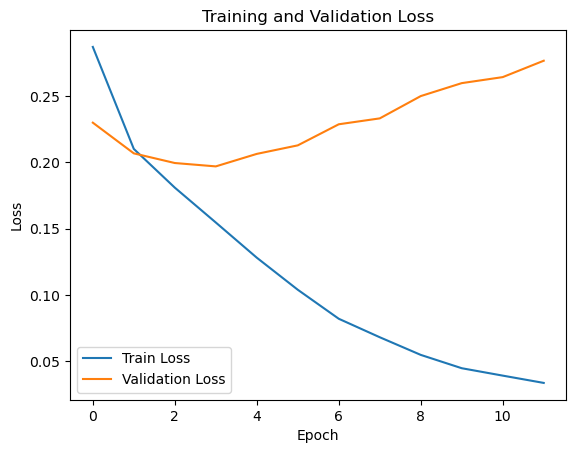

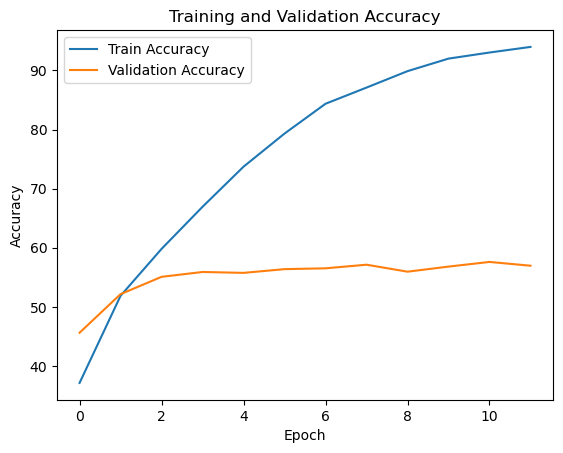

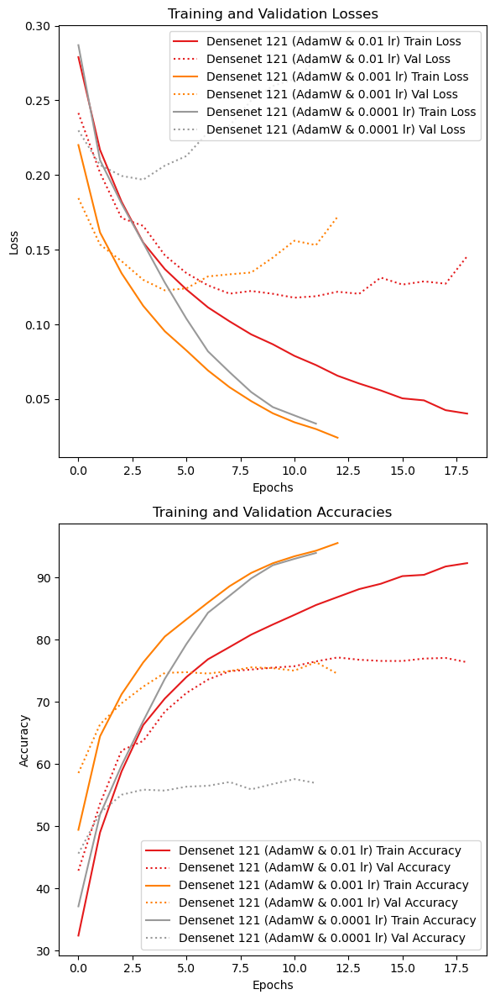

In [30]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : AdamW, Learning rate: {i}")
    model = torchvision.models.densenet121(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.AdamW(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Densenet 121 (AdamW & {i} lr)')

densenet_121_adamw_metrics=metrics
densenet_121_adamw_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

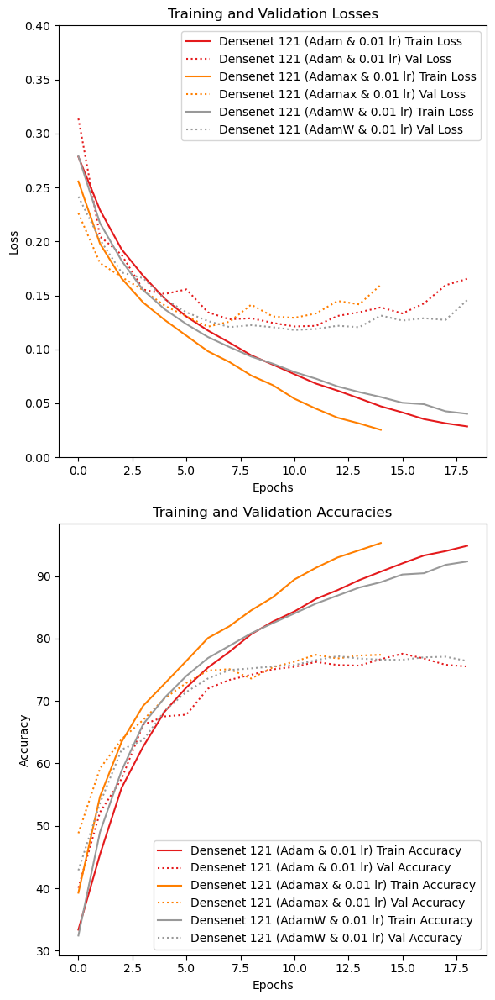

In [59]:
plot_cnn_performance([densenet_121_adam_metrics[0],densenet_121_adamax_metrics[0], densenet_121_adamw_metrics[0]],[densenet_121_adam_name[0],densenet_121_adamax_name[0],densenet_121_adamw_name[0]], ylim=(0,0.4))

Optimizer : AdamW, Learning rate: 0.01, Dropout: 0.2
Epoch [1/30], Train Loss: 0.2830, Train Accuracy: 31.79%, Val Loss: 0.2455, Val Accuracy: 40.49%
Epoch [2/30], Train Loss: 0.2353, Train Accuracy: 43.73%, Val Loss: 0.2189, Val Accuracy: 49.04%
Epoch [3/30], Train Loss: 0.2130, Train Accuracy: 50.21%, Val Loss: 0.2016, Val Accuracy: 54.77%
Epoch [4/30], Train Loss: 0.1806, Train Accuracy: 59.57%, Val Loss: 0.1699, Val Accuracy: 62.68%
Epoch [5/30], Train Loss: 0.1571, Train Accuracy: 65.86%, Val Loss: 0.1668, Val Accuracy: 63.75%
Epoch [6/30], Train Loss: 0.1388, Train Accuracy: 70.39%, Val Loss: 0.1441, Val Accuracy: 69.03%
Epoch [7/30], Train Loss: 0.1250, Train Accuracy: 73.96%, Val Loss: 0.1351, Val Accuracy: 71.52%
Epoch [8/30], Train Loss: 0.1141, Train Accuracy: 76.17%, Val Loss: 0.1329, Val Accuracy: 72.01%
Epoch [9/30], Train Loss: 0.1064, Train Accuracy: 77.94%, Val Loss: 0.1252, Val Accuracy: 73.91%
Epoch [10/30], Train Loss: 0.0955, Train Accuracy: 80.28%, Val Loss: 0.139

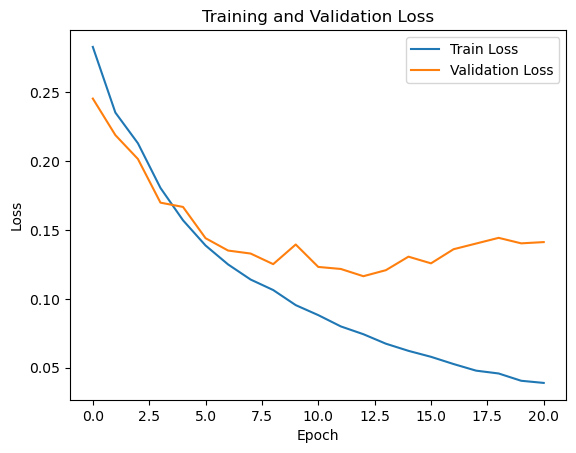

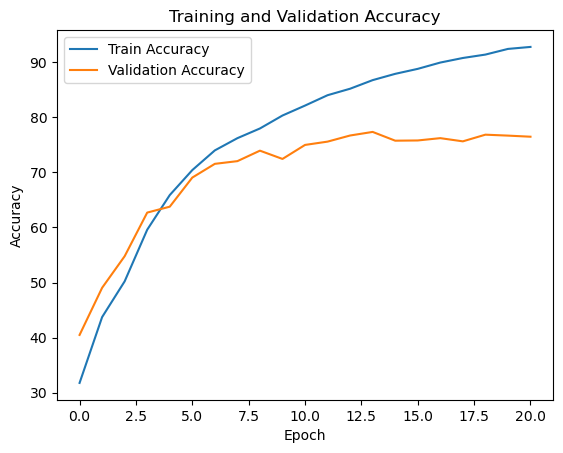

Optimizer : AdamW, Learning rate: 0.01, Dropout: 0.35
Epoch [1/30], Train Loss: 0.2910, Train Accuracy: 30.01%, Val Loss: 0.2564, Val Accuracy: 38.28%
Epoch [2/30], Train Loss: 0.2338, Train Accuracy: 45.59%, Val Loss: 0.2188, Val Accuracy: 48.38%
Epoch [3/30], Train Loss: 0.2032, Train Accuracy: 53.68%, Val Loss: 0.1835, Val Accuracy: 59.01%
Epoch [4/30], Train Loss: 0.1743, Train Accuracy: 61.35%, Val Loss: 0.1675, Val Accuracy: 63.85%
Epoch [5/30], Train Loss: 0.1571, Train Accuracy: 65.66%, Val Loss: 0.1440, Val Accuracy: 68.88%
Epoch [6/30], Train Loss: 0.1380, Train Accuracy: 70.55%, Val Loss: 0.1349, Val Accuracy: 71.37%
Epoch [7/30], Train Loss: 0.1261, Train Accuracy: 73.72%, Val Loss: 0.1324, Val Accuracy: 71.90%
Epoch [8/30], Train Loss: 0.1160, Train Accuracy: 76.03%, Val Loss: 0.1259, Val Accuracy: 73.60%
Epoch [9/30], Train Loss: 0.1071, Train Accuracy: 78.20%, Val Loss: 0.1297, Val Accuracy: 73.05%
Epoch [10/30], Train Loss: 0.0989, Train Accuracy: 79.88%, Val Loss: 0.12

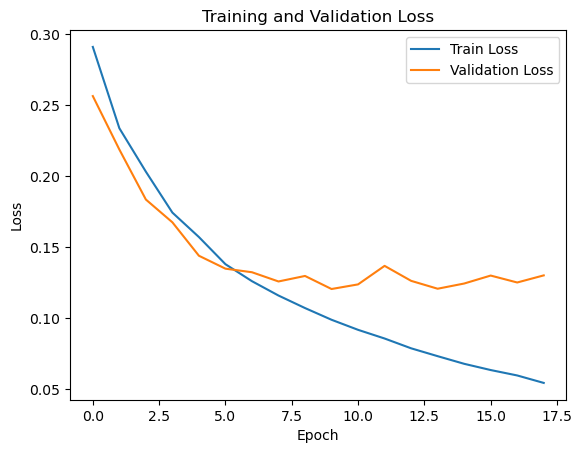

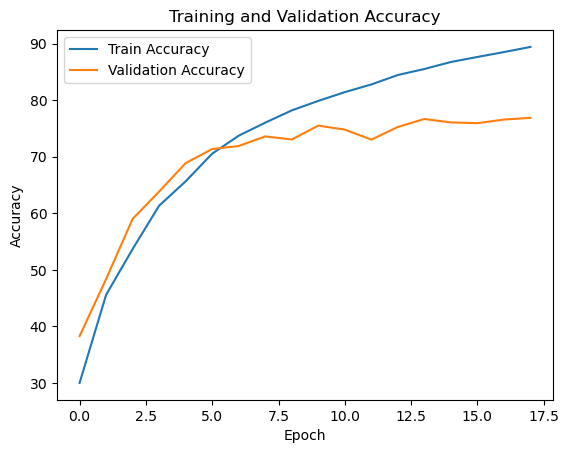

Optimizer : AdamW, Learning rate: 0.01, Dropout: 0.5
Epoch [1/30], Train Loss: 0.2932, Train Accuracy: 28.81%, Val Loss: 0.2424, Val Accuracy: 40.25%
Epoch [2/30], Train Loss: 0.2347, Train Accuracy: 44.34%, Val Loss: 0.2132, Val Accuracy: 49.05%
Epoch [3/30], Train Loss: 0.2025, Train Accuracy: 53.70%, Val Loss: 0.1912, Val Accuracy: 57.23%
Epoch [4/30], Train Loss: 0.1780, Train Accuracy: 60.75%, Val Loss: 0.1910, Val Accuracy: 59.43%
Epoch [5/30], Train Loss: 0.1584, Train Accuracy: 65.64%, Val Loss: 0.1580, Val Accuracy: 65.63%
Epoch [6/30], Train Loss: 0.1400, Train Accuracy: 70.43%, Val Loss: 0.1405, Val Accuracy: 70.17%
Epoch [7/30], Train Loss: 0.1280, Train Accuracy: 73.26%, Val Loss: 0.1453, Val Accuracy: 69.26%
Epoch [8/30], Train Loss: 0.1190, Train Accuracy: 75.11%, Val Loss: 0.1361, Val Accuracy: 71.24%
Epoch [9/30], Train Loss: 0.1084, Train Accuracy: 77.91%, Val Loss: 0.1372, Val Accuracy: 71.53%
Epoch [10/30], Train Loss: 0.1012, Train Accuracy: 79.74%, Val Loss: 0.124

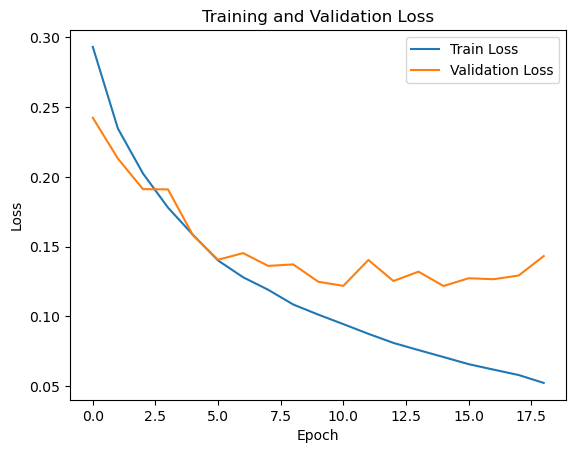

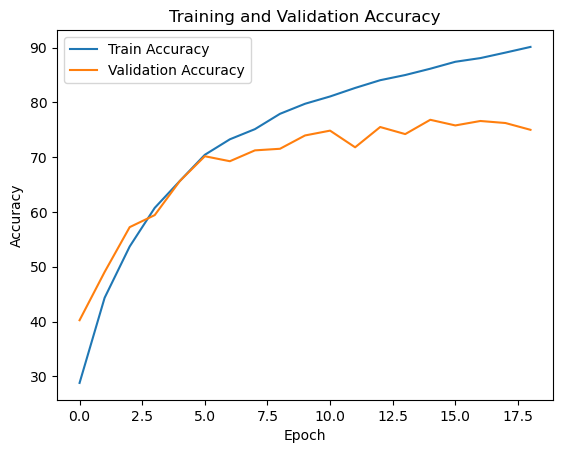

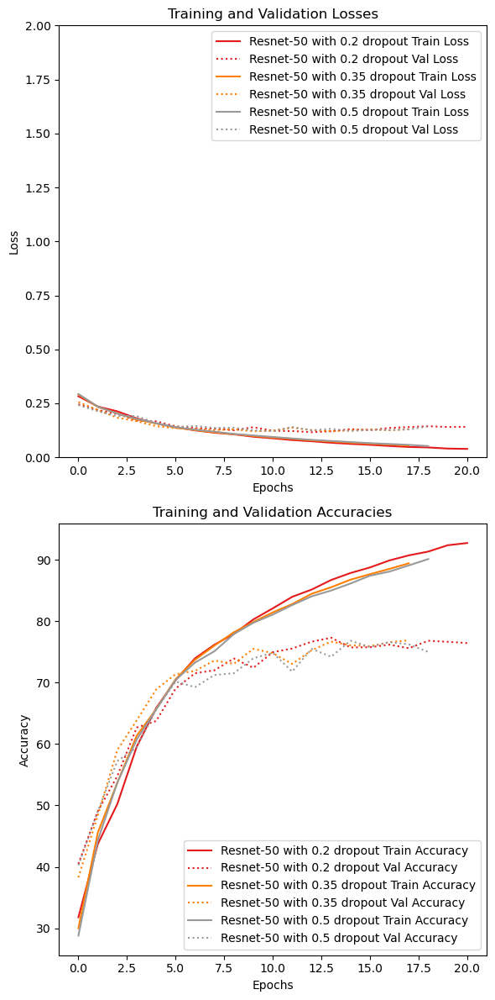

In [61]:
metrics=[]
model_names=[]
for i in [0.2,0.35,0.5]:
    print(f"Optimizer : AdamW, Learning rate: 0.01, Dropout: {i}")
    model = ModelWithDropout(model_name='densenet121', num_classes=10, dropout_prob=i).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.AdamW(model.parameters(), lr=0.01)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Densenet-121 with {i} dropout')

densenet_121_dropout_metrics=metrics
densenet_121_dropout_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

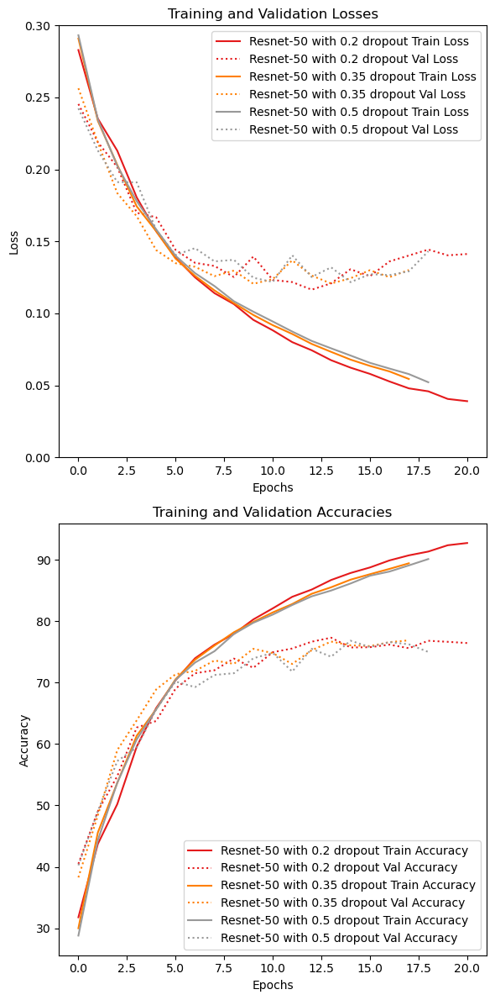

In [66]:
plot_cnn_performance(densenet_121_dropout_metrics,densenet_121_dropout_name, ylim=(0,0.3))

## Wide Resnet-50_2

### Base wide resnet-50_2

Epoch [1/30], Train Loss: 0.2634, Train Accuracy: 40.53%, Val Loss: 0.4002, Val Accuracy: 46.36%
Epoch [2/30], Train Loss: 0.2134, Train Accuracy: 53.62%, Val Loss: 0.2028, Val Accuracy: 55.55%
Epoch [3/30], Train Loss: 0.2221, Train Accuracy: 51.70%, Val Loss: 0.1918, Val Accuracy: 56.94%
Epoch [4/30], Train Loss: 0.1938, Train Accuracy: 58.67%, Val Loss: 0.1890, Val Accuracy: 58.28%
Epoch [5/30], Train Loss: 0.1746, Train Accuracy: 63.34%, Val Loss: 20.1987, Val Accuracy: 32.95%
Epoch [6/30], Train Loss: 0.1834, Train Accuracy: 60.52%, Val Loss: 0.1640, Val Accuracy: 64.97%
Epoch [7/30], Train Loss: 0.1499, Train Accuracy: 69.12%, Val Loss: 0.1587, Val Accuracy: 65.65%
Epoch [8/30], Train Loss: 0.1416, Train Accuracy: 71.38%, Val Loss: 0.1697, Val Accuracy: 66.11%
Epoch [9/30], Train Loss: 0.1455, Train Accuracy: 69.75%, Val Loss: 0.1842, Val Accuracy: 59.95%
Epoch [10/30], Train Loss: 0.1531, Train Accuracy: 68.84%, Val Loss: 0.3859, Val Accuracy: 64.65%
Epoch [11/30], Train Loss: 0

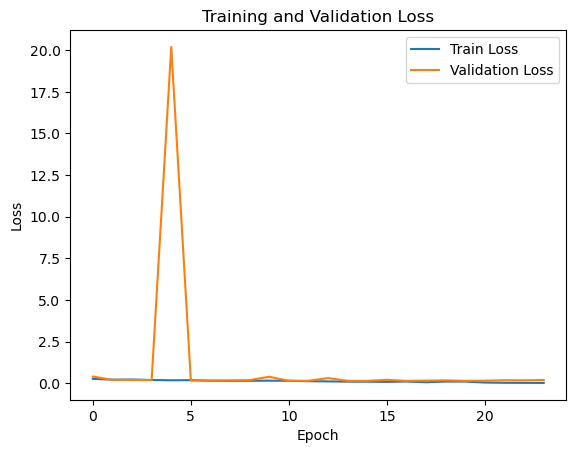

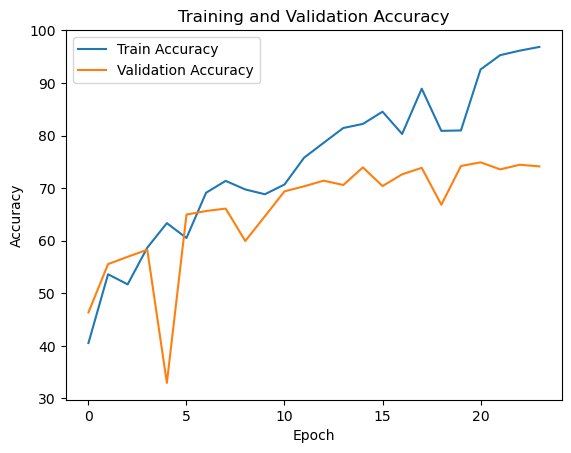

In [31]:
# wide_resnet50_2 model
model = torchvision.models.wide_resnet50_2(num_classes=10)  # CIFAR-10 has 10 classes
model = model.to(device)

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train the model
num_epochs = 30
train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, criterion, optimizer, num_epochs=num_epochs, patience=7)

### Wide Resnet-50_2 with Adam optimizer and different learning rates

Optimizer : Adam, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3798, Train Accuracy: 17.04%, Val Loss: 0.2958, Val Accuracy: 25.02%
Epoch [2/30], Train Loss: 0.2656, Train Accuracy: 33.85%, Val Loss: 0.2417, Val Accuracy: 41.87%
Epoch [3/30], Train Loss: 0.2344, Train Accuracy: 43.68%, Val Loss: 0.2256, Val Accuracy: 48.02%
Epoch [4/30], Train Loss: 0.2113, Train Accuracy: 50.67%, Val Loss: 0.2171, Val Accuracy: 50.58%
Epoch [5/30], Train Loss: 0.1949, Train Accuracy: 55.31%, Val Loss: 0.1972, Val Accuracy: 56.29%
Epoch [6/30], Train Loss: 0.1777, Train Accuracy: 60.24%, Val Loss: 0.1798, Val Accuracy: 60.20%
Epoch [7/30], Train Loss: 0.1614, Train Accuracy: 64.48%, Val Loss: 0.1773, Val Accuracy: 61.58%
Epoch [8/30], Train Loss: 0.1510, Train Accuracy: 67.26%, Val Loss: 0.1576, Val Accuracy: 65.51%
Epoch [9/30], Train Loss: 0.1317, Train Accuracy: 71.81%, Val Loss: 0.1505, Val Accuracy: 68.58%
Epoch [10/30], Train Loss: 0.1183, Train Accuracy: 74.96%, Val Loss: 0.1367, Val Accuracy

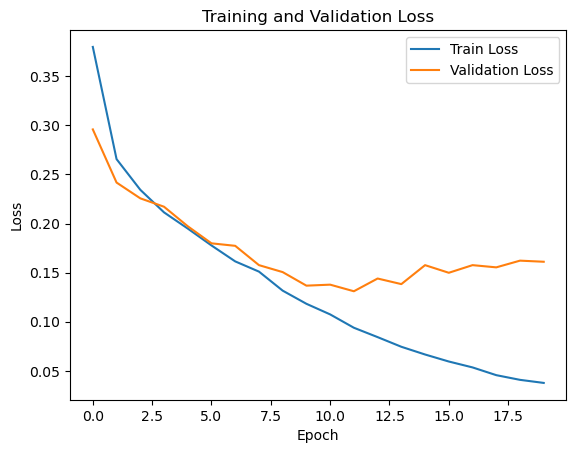

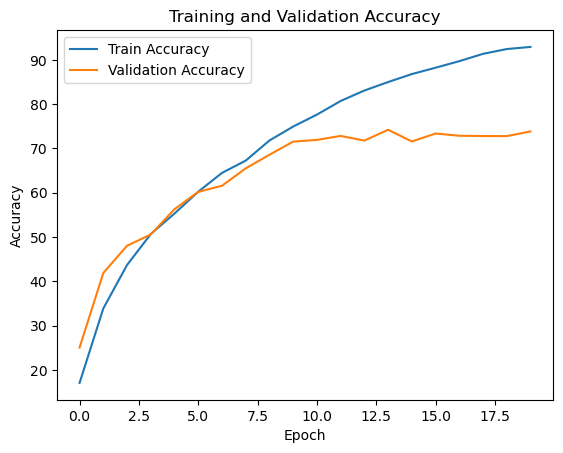

Optimizer : Adam, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2586, Train Accuracy: 41.08%, Val Loss: 0.3675, Val Accuracy: 49.89%
Epoch [2/30], Train Loss: 0.2428, Train Accuracy: 46.43%, Val Loss: 0.2054, Val Accuracy: 52.62%
Epoch [3/30], Train Loss: 0.2428, Train Accuracy: 45.49%, Val Loss: 0.2337, Val Accuracy: 47.89%
Epoch [4/30], Train Loss: 0.2429, Train Accuracy: 44.76%, Val Loss: 0.2476, Val Accuracy: 41.51%
Epoch [5/30], Train Loss: 0.2246, Train Accuracy: 49.37%, Val Loss: 0.2327, Val Accuracy: 50.14%
Epoch [6/30], Train Loss: 0.2164, Train Accuracy: 51.83%, Val Loss: 0.2118, Val Accuracy: 52.86%
Epoch [7/30], Train Loss: 0.2128, Train Accuracy: 52.95%, Val Loss: 0.2396, Val Accuracy: 51.72%
Epoch [8/30], Train Loss: 0.2089, Train Accuracy: 53.91%, Val Loss: 0.1928, Val Accuracy: 58.25%
Epoch [9/30], Train Loss: 0.1809, Train Accuracy: 60.44%, Val Loss: 0.1852, Val Accuracy: 60.78%
Epoch [10/30], Train Loss: 0.1814, Train Accuracy: 60.62%, Val Loss: 0.3934, Val Accurac

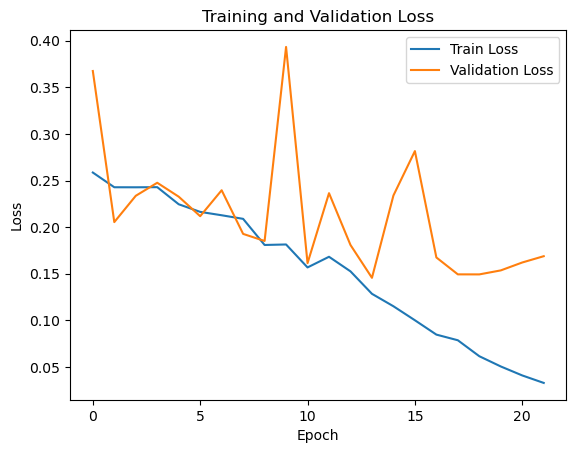

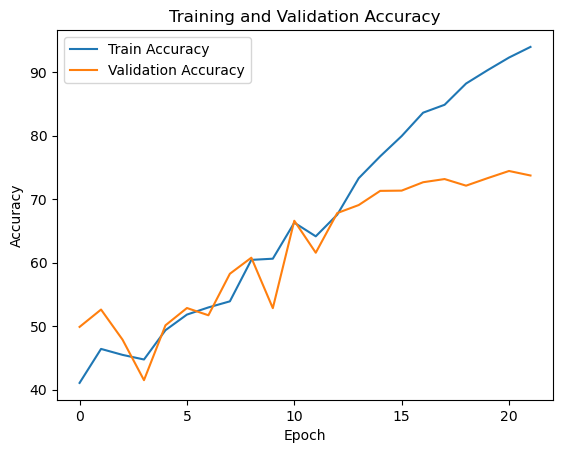

Optimizer : Adam, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3043, Train Accuracy: 25.68%, Val Loss: 0.2735, Val Accuracy: 33.84%
Epoch [2/30], Train Loss: 0.2522, Train Accuracy: 39.52%, Val Loss: 0.2469, Val Accuracy: 41.86%
Epoch [3/30], Train Loss: 0.2215, Train Accuracy: 48.85%, Val Loss: 0.2331, Val Accuracy: 45.23%
Epoch [4/30], Train Loss: 0.1943, Train Accuracy: 56.74%, Val Loss: 0.2283, Val Accuracy: 47.95%
Epoch [5/30], Train Loss: 0.1686, Train Accuracy: 63.34%, Val Loss: 0.2256, Val Accuracy: 50.57%
Epoch [6/30], Train Loss: 0.1436, Train Accuracy: 69.32%, Val Loss: 0.2325, Val Accuracy: 51.15%
Epoch [7/30], Train Loss: 0.1210, Train Accuracy: 74.80%, Val Loss: 0.2382, Val Accuracy: 51.99%
Epoch [8/30], Train Loss: 0.1006, Train Accuracy: 79.74%, Val Loss: 0.2484, Val Accuracy: 53.41%
Epoch [9/30], Train Loss: 0.0833, Train Accuracy: 83.44%, Val Loss: 0.2592, Val Accuracy: 52.14%
Epoch [10/30], Train Loss: 0.0694, Train Accuracy: 86.38%, Val Loss: 0.2797, Val Accura

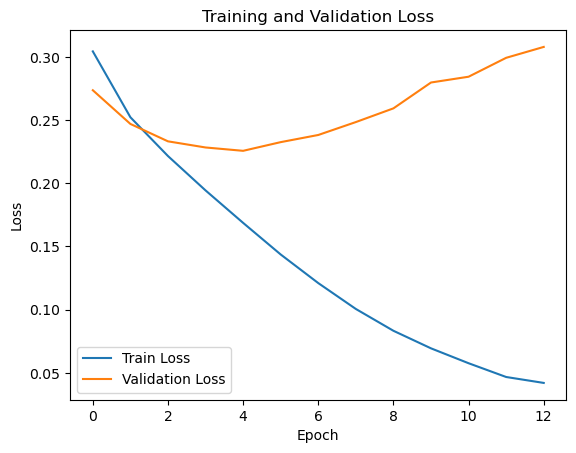

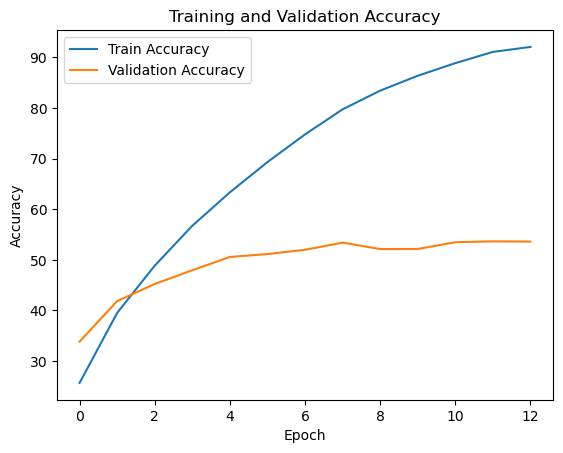

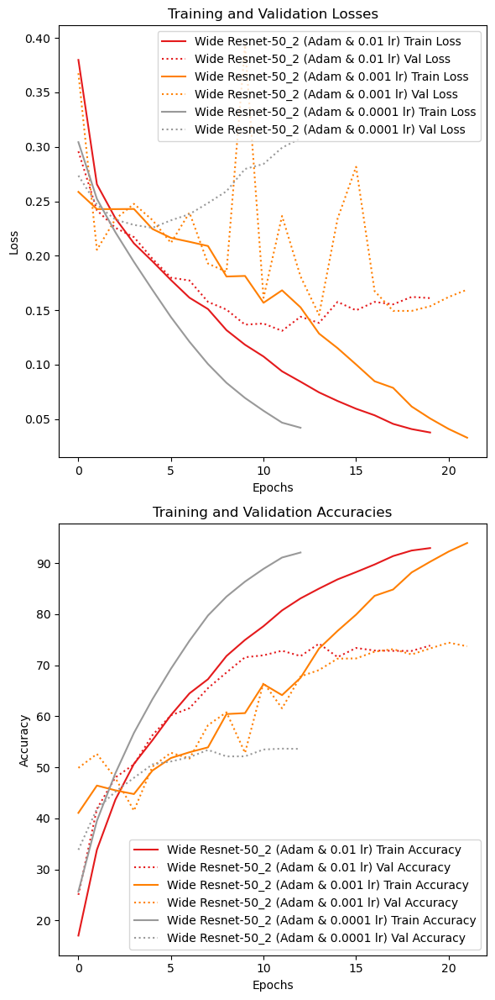

In [32]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adam, Learning rate: {i}")
    model = torchvision.models.wide_resnet50_2(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Wide Resnet-50_2 (Adam & {i} lr)')

wide_resnet50_2_adam_metrics=metrics
wide_resnet50_2_adam_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

### Wide Resnet-50_2 with Adamax optimizer and different learning rates

Optimizer : Adamax, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3588, Train Accuracy: 22.36%, Val Loss: 0.4108, Val Accuracy: 29.67%
Epoch [2/30], Train Loss: 0.2776, Train Accuracy: 36.66%, Val Loss: 0.4297, Val Accuracy: 36.99%
Epoch [3/30], Train Loss: 0.2608, Train Accuracy: 40.02%, Val Loss: 0.3727, Val Accuracy: 42.37%
Epoch [4/30], Train Loss: 0.2367, Train Accuracy: 45.41%, Val Loss: 0.2647, Val Accuracy: 45.02%
Epoch [5/30], Train Loss: 0.2183, Train Accuracy: 50.29%, Val Loss: 0.2578, Val Accuracy: 52.41%
Epoch [6/30], Train Loss: 0.2008, Train Accuracy: 54.63%, Val Loss: 0.2042, Val Accuracy: 56.38%
Epoch [7/30], Train Loss: 0.1858, Train Accuracy: 58.34%, Val Loss: 0.1885, Val Accuracy: 58.96%
Epoch [8/30], Train Loss: 0.1704, Train Accuracy: 62.48%, Val Loss: 0.2139, Val Accuracy: 62.54%
Epoch [9/30], Train Loss: 0.1569, Train Accuracy: 66.00%, Val Loss: 0.1915, Val Accuracy: 63.04%
Epoch [10/30], Train Loss: 0.1458, Train Accuracy: 68.66%, Val Loss: 0.1694, Val Accura

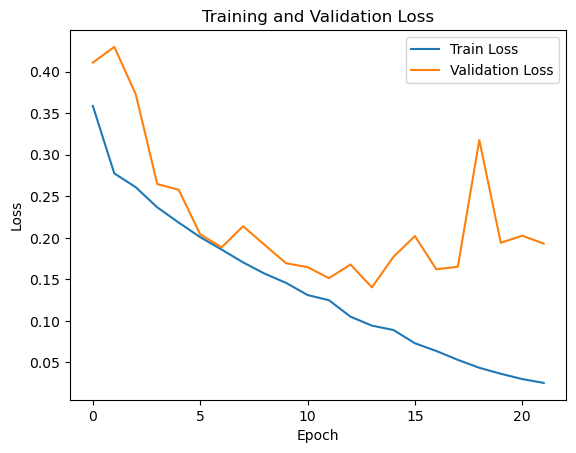

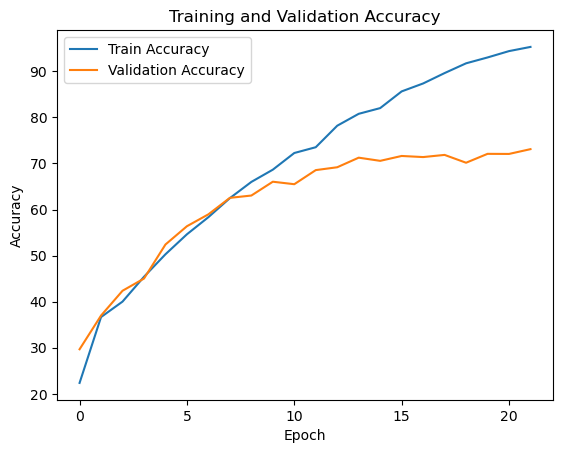

Optimizer : Adamax, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2615, Train Accuracy: 37.97%, Val Loss: 0.2297, Val Accuracy: 47.13%
Epoch [2/30], Train Loss: 0.2086, Train Accuracy: 52.81%, Val Loss: 0.2114, Val Accuracy: 52.19%
Epoch [3/30], Train Loss: 0.1810, Train Accuracy: 60.26%, Val Loss: 0.2070, Val Accuracy: 53.71%
Epoch [4/30], Train Loss: 0.1597, Train Accuracy: 65.60%, Val Loss: 0.1980, Val Accuracy: 57.39%
Epoch [5/30], Train Loss: 0.1419, Train Accuracy: 70.17%, Val Loss: 0.1862, Val Accuracy: 59.37%
Epoch [6/30], Train Loss: 0.1255, Train Accuracy: 73.73%, Val Loss: 0.1908, Val Accuracy: 60.53%
Epoch [7/30], Train Loss: 0.1086, Train Accuracy: 77.86%, Val Loss: 0.1795, Val Accuracy: 62.80%
Epoch [8/30], Train Loss: 0.0944, Train Accuracy: 80.92%, Val Loss: 0.1766, Val Accuracy: 64.42%
Epoch [9/30], Train Loss: 0.0793, Train Accuracy: 84.18%, Val Loss: 0.1867, Val Accuracy: 63.98%
Epoch [10/30], Train Loss: 0.0664, Train Accuracy: 87.16%, Val Loss: 0.1855, Val Accur

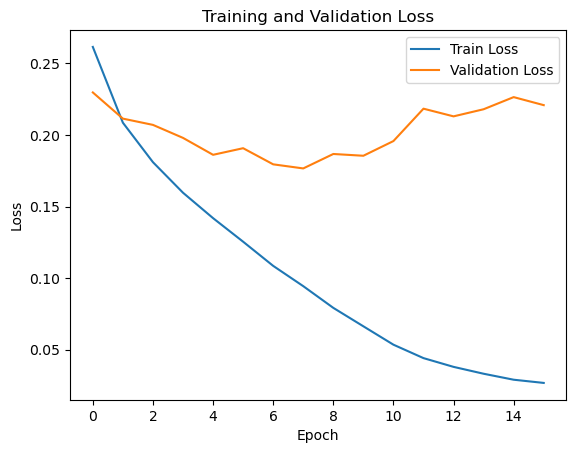

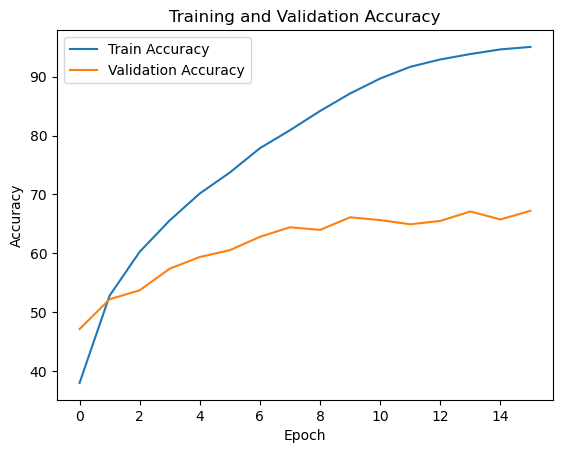

Optimizer : Adamax, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3159, Train Accuracy: 20.44%, Val Loss: 0.2971, Val Accuracy: 24.75%
Epoch [2/30], Train Loss: 0.2838, Train Accuracy: 29.95%, Val Loss: 0.2786, Val Accuracy: 31.92%
Epoch [3/30], Train Loss: 0.2639, Train Accuracy: 36.22%, Val Loss: 0.2640, Val Accuracy: 36.54%
Epoch [4/30], Train Loss: 0.2462, Train Accuracy: 41.48%, Val Loss: 0.2558, Val Accuracy: 39.03%
Epoch [5/30], Train Loss: 0.2277, Train Accuracy: 47.37%, Val Loss: 0.2458, Val Accuracy: 42.01%
Epoch [6/30], Train Loss: 0.2101, Train Accuracy: 52.34%, Val Loss: 0.2389, Val Accuracy: 44.14%
Epoch [7/30], Train Loss: 0.1876, Train Accuracy: 58.23%, Val Loss: 0.2417, Val Accuracy: 45.26%
Epoch [8/30], Train Loss: 0.1625, Train Accuracy: 65.01%, Val Loss: 0.2459, Val Accuracy: 46.16%
Epoch [9/30], Train Loss: 0.1358, Train Accuracy: 71.70%, Val Loss: 0.2568, Val Accuracy: 46.26%
Epoch [10/30], Train Loss: 0.1095, Train Accuracy: 78.02%, Val Loss: 0.2792, Val Accu

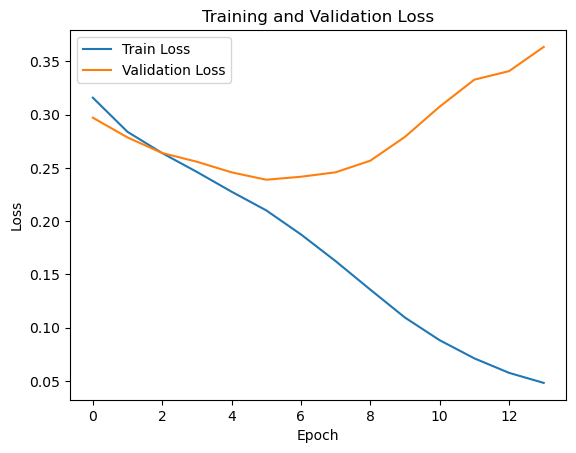

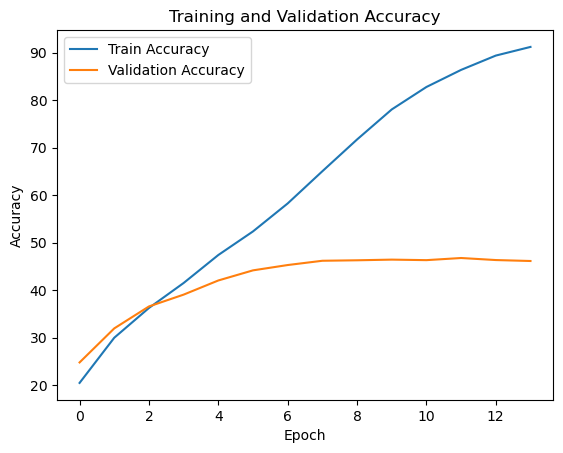

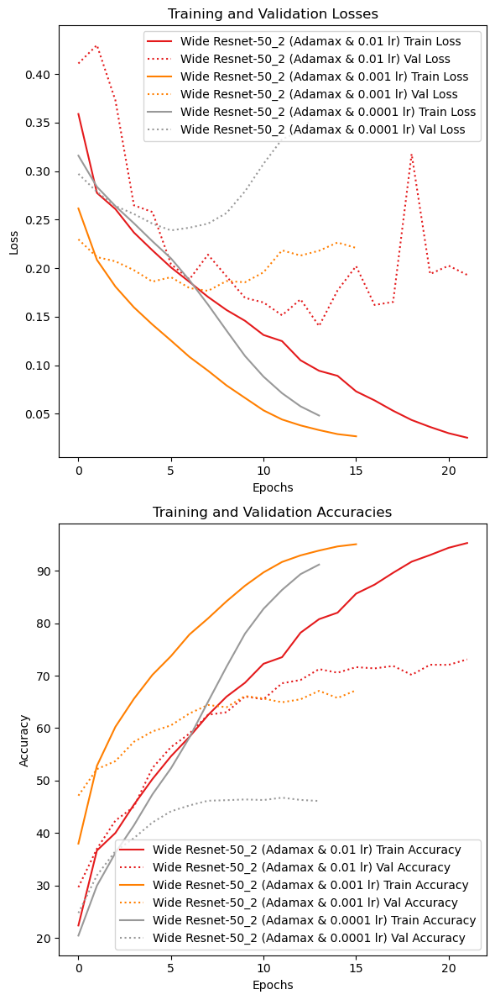

In [33]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adamax, Learning rate: {i}")
    model = torchvision.models.wide_resnet50_2(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adamax(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Wide Resnet-50_2 (Adamax & {i} lr)')

wide_resnet50_2_adamax_metrics=metrics
wide_resnet50_2_adamax_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

### Wide Resnet-50_2 with AdamW optimizer and different learning rates

Optimizer : AdamW, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3770, Train Accuracy: 19.83%, Val Loss: 0.3360, Val Accuracy: 26.89%
Epoch [2/30], Train Loss: 0.2612, Train Accuracy: 35.09%, Val Loss: 0.2412, Val Accuracy: 41.72%
Epoch [3/30], Train Loss: 0.2295, Train Accuracy: 45.12%, Val Loss: 0.2472, Val Accuracy: 46.02%
Epoch [4/30], Train Loss: 0.2102, Train Accuracy: 51.02%, Val Loss: 0.2144, Val Accuracy: 51.20%
Epoch [5/30], Train Loss: 0.1948, Train Accuracy: 55.73%, Val Loss: 0.1910, Val Accuracy: 57.00%
Epoch [6/30], Train Loss: 0.1782, Train Accuracy: 59.96%, Val Loss: 0.1834, Val Accuracy: 59.97%
Epoch [7/30], Train Loss: 0.1598, Train Accuracy: 64.97%, Val Loss: 0.4345, Val Accuracy: 58.29%
Epoch [8/30], Train Loss: 0.1499, Train Accuracy: 67.32%, Val Loss: 0.1700, Val Accuracy: 62.50%
Epoch [9/30], Train Loss: 0.1440, Train Accuracy: 69.12%, Val Loss: 0.1505, Val Accuracy: 67.44%
Epoch [10/30], Train Loss: 0.1297, Train Accuracy: 72.71%, Val Loss: 0.1592, Val Accurac

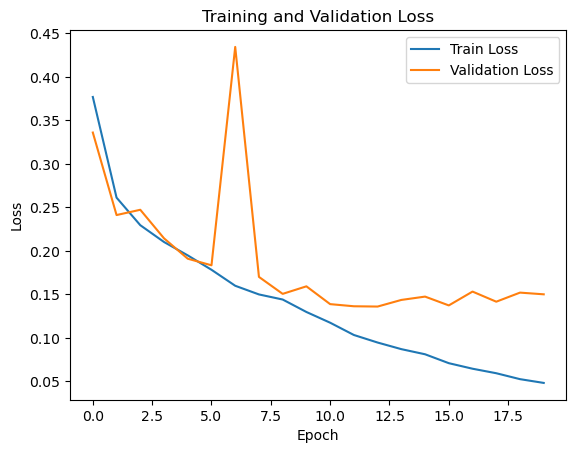

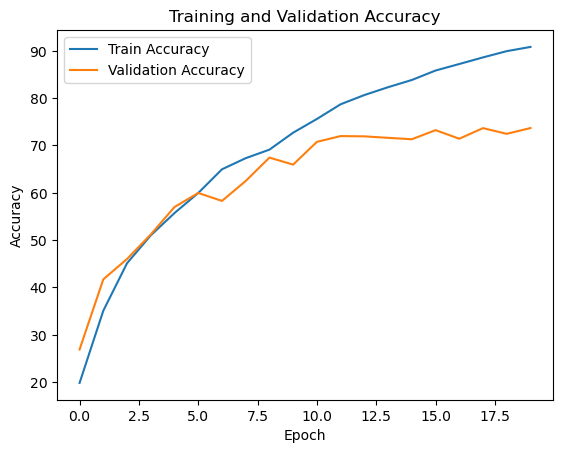

Optimizer : AdamW, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2580, Train Accuracy: 41.08%, Val Loss: 2.7237, Val Accuracy: 28.36%
Epoch [2/30], Train Loss: 0.2239, Train Accuracy: 50.46%, Val Loss: 0.2115, Val Accuracy: 55.21%
Epoch [3/30], Train Loss: 0.1974, Train Accuracy: 58.04%, Val Loss: 0.2430, Val Accuracy: 57.73%
Epoch [4/30], Train Loss: 0.2029, Train Accuracy: 56.15%, Val Loss: 0.4029, Val Accuracy: 55.90%
Epoch [5/30], Train Loss: 0.2125, Train Accuracy: 53.52%, Val Loss: 0.3134, Val Accuracy: 43.52%
Epoch [6/30], Train Loss: 0.2318, Train Accuracy: 47.88%, Val Loss: 0.2707, Val Accuracy: 38.55%
Epoch [7/30], Train Loss: 0.2012, Train Accuracy: 55.33%, Val Loss: 0.2593, Val Accuracy: 60.40%
Epoch [8/30], Train Loss: 0.1672, Train Accuracy: 63.74%, Val Loss: 0.1887, Val Accuracy: 58.48%
Epoch [9/30], Train Loss: 0.1741, Train Accuracy: 62.58%, Val Loss: 0.1809, Val Accuracy: 59.11%
Epoch [10/30], Train Loss: 0.2046, Train Accuracy: 55.10%, Val Loss: 0.1843, Val Accura

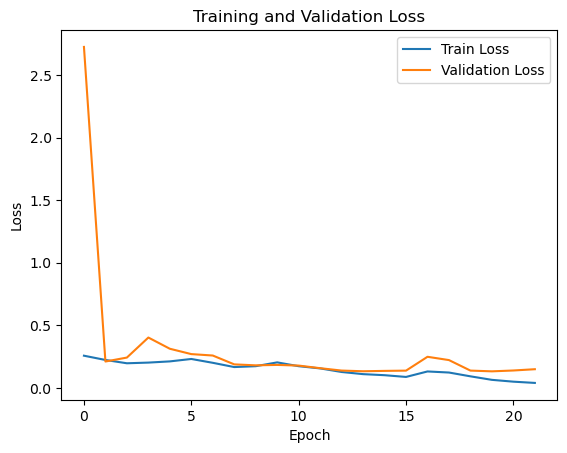

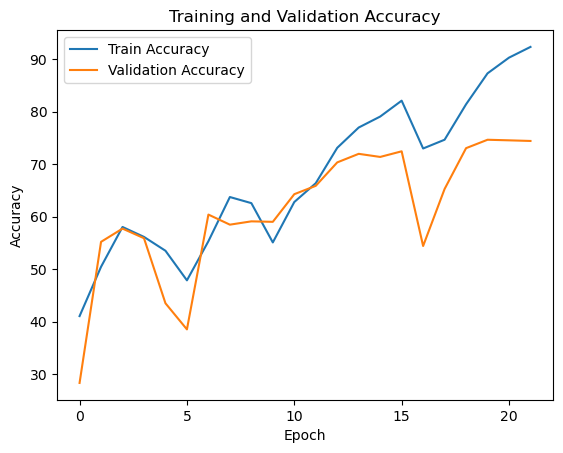

Optimizer : AdamW, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3012, Train Accuracy: 26.51%, Val Loss: 0.2677, Val Accuracy: 35.21%
Epoch [2/30], Train Loss: 0.2491, Train Accuracy: 40.72%, Val Loss: 0.2425, Val Accuracy: 42.78%
Epoch [3/30], Train Loss: 0.2188, Train Accuracy: 49.61%, Val Loss: 0.2291, Val Accuracy: 46.41%
Epoch [4/30], Train Loss: 0.1937, Train Accuracy: 56.58%, Val Loss: 0.2239, Val Accuracy: 48.81%
Epoch [5/30], Train Loss: 0.1683, Train Accuracy: 63.12%, Val Loss: 0.2226, Val Accuracy: 50.67%
Epoch [6/30], Train Loss: 0.1436, Train Accuracy: 69.44%, Val Loss: 0.2261, Val Accuracy: 50.59%
Epoch [7/30], Train Loss: 0.1209, Train Accuracy: 75.01%, Val Loss: 0.2433, Val Accuracy: 50.98%
Epoch [8/30], Train Loss: 0.1019, Train Accuracy: 79.29%, Val Loss: 0.2488, Val Accuracy: 52.01%
Epoch [9/30], Train Loss: 0.0829, Train Accuracy: 83.52%, Val Loss: 0.2592, Val Accuracy: 52.01%
Epoch [10/30], Train Loss: 0.0674, Train Accuracy: 87.03%, Val Loss: 0.2778, Val Accur

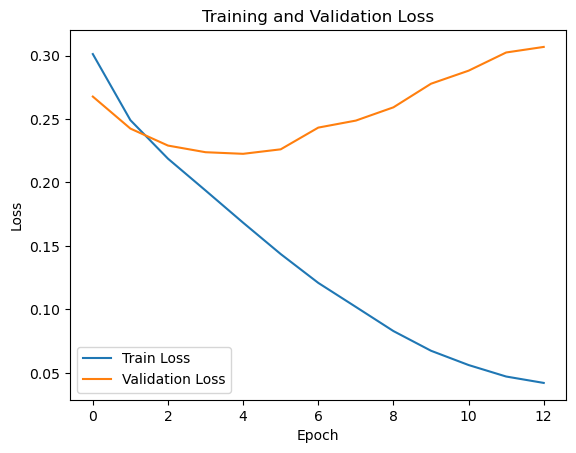

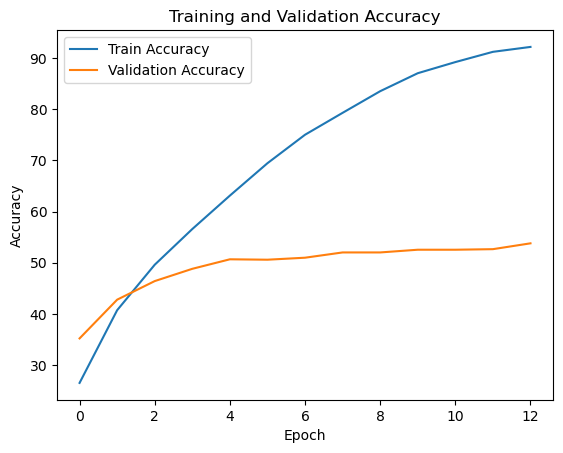

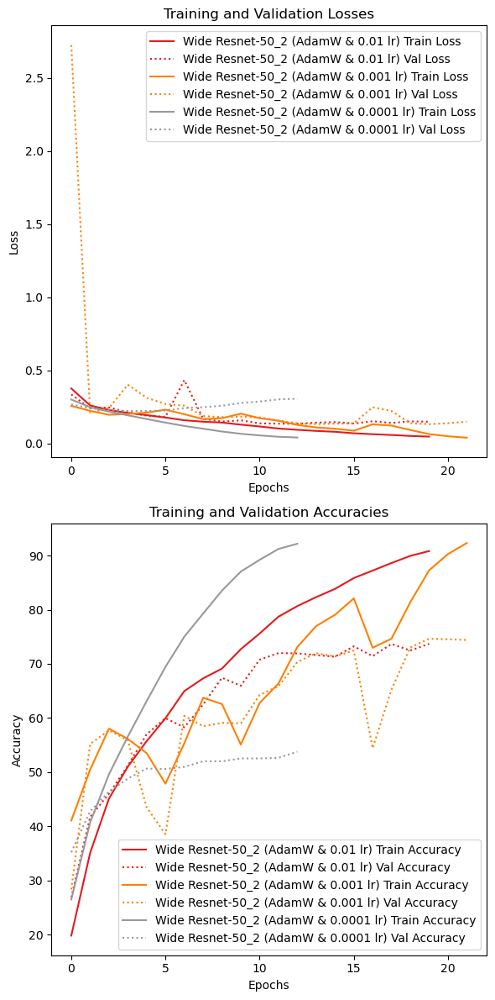

In [34]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : AdamW, Learning rate: {i}")
    model = torchvision.models.wide_resnet50_2(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.AdamW(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Wide Resnet-50_2 (AdamW & {i} lr)')

wide_resnet50_2_adamw_metrics=metrics
wide_resnet50_2_adamw_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

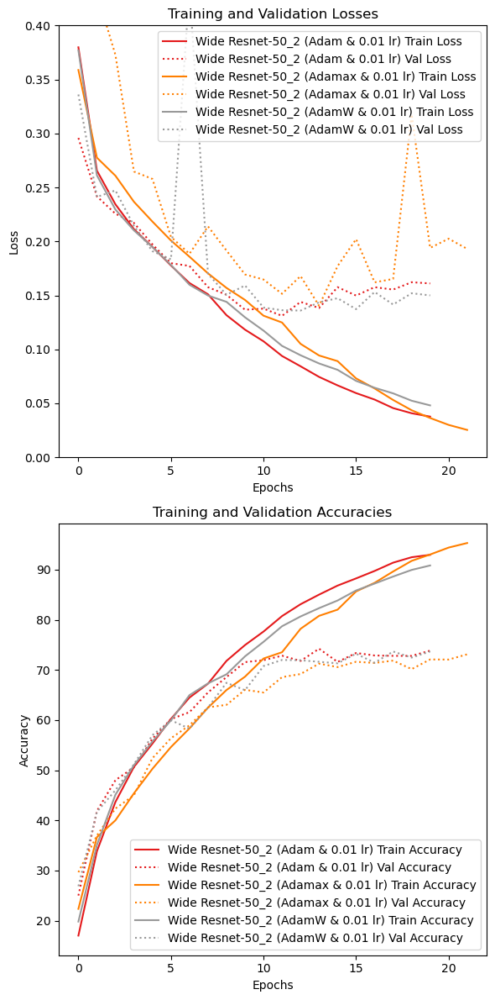

In [62]:
plot_cnn_performance([wide_resnet50_2_adam_metrics[0],wide_resnet50_2_adamax_metrics[0], wide_resnet50_2_adamw_metrics[0]],[wide_resnet50_2_adam_name[0],wide_resnet50_2_adamax_name[0],wide_resnet50_2_adamw_name[0]], ylim=(0,0.4))

Optimizer : Adam, Learning rate: 0.01, Dropout: 0.2
Epoch [1/30], Train Loss: 0.3692, Train Accuracy: 18.36%, Val Loss: 0.2928, Val Accuracy: 23.57%
Epoch [2/30], Train Loss: 0.2743, Train Accuracy: 31.91%, Val Loss: 0.2540, Val Accuracy: 38.05%
Epoch [3/30], Train Loss: 0.2460, Train Accuracy: 40.86%, Val Loss: 0.2319, Val Accuracy: 45.87%
Epoch [4/30], Train Loss: 0.2235, Train Accuracy: 47.92%, Val Loss: 0.2192, Val Accuracy: 49.20%
Epoch [5/30], Train Loss: 0.2057, Train Accuracy: 53.13%, Val Loss: 0.1984, Val Accuracy: 54.67%
Epoch [6/30], Train Loss: 0.1909, Train Accuracy: 57.21%, Val Loss: 0.1828, Val Accuracy: 59.66%
Epoch [7/30], Train Loss: 0.1769, Train Accuracy: 61.09%, Val Loss: 0.1762, Val Accuracy: 62.06%
Epoch [8/30], Train Loss: 0.1716, Train Accuracy: 62.19%, Val Loss: 0.1680, Val Accuracy: 63.79%
Epoch [9/30], Train Loss: 0.1589, Train Accuracy: 65.57%, Val Loss: 0.1703, Val Accuracy: 63.79%
Epoch [10/30], Train Loss: 0.1541, Train Accuracy: 67.08%, Val Loss: 0.2296

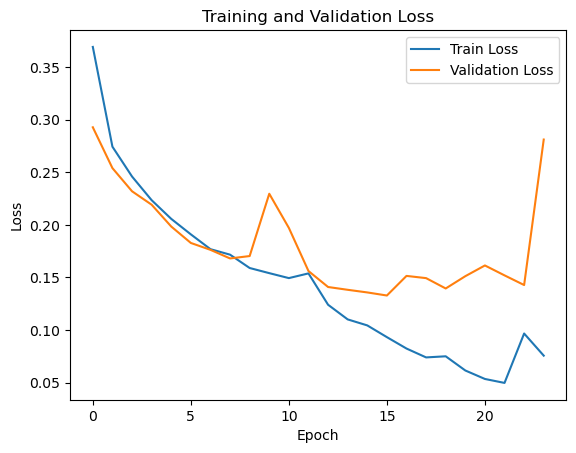

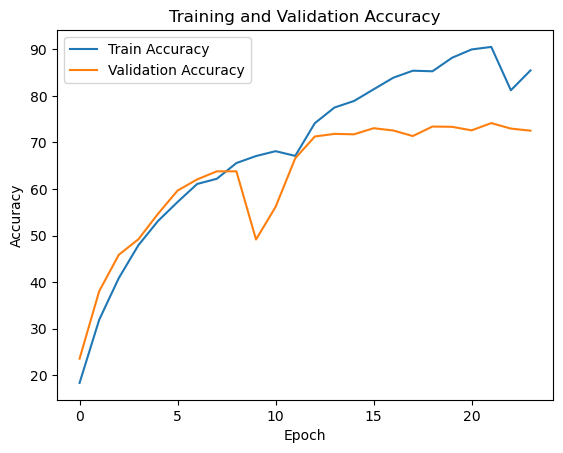

Optimizer : Adam, Learning rate: 0.01, Dropout: 0.35
Epoch [1/30], Train Loss: 0.4038, Train Accuracy: 17.45%, Val Loss: 0.5618, Val Accuracy: 16.60%
Epoch [2/30], Train Loss: 0.3013, Train Accuracy: 27.49%, Val Loss: 0.4170, Val Accuracy: 30.74%
Epoch [3/30], Train Loss: 0.2648, Train Accuracy: 37.10%, Val Loss: 0.2575, Val Accuracy: 40.37%
Epoch [4/30], Train Loss: 0.2425, Train Accuracy: 42.64%, Val Loss: 0.2348, Val Accuracy: 44.98%
Epoch [5/30], Train Loss: 0.2250, Train Accuracy: 47.60%, Val Loss: 0.2083, Val Accuracy: 52.00%
Epoch [6/30], Train Loss: 0.2055, Train Accuracy: 53.03%, Val Loss: 0.2043, Val Accuracy: 54.50%
Epoch [7/30], Train Loss: 0.2228, Train Accuracy: 48.01%, Val Loss: 0.2513, Val Accuracy: 39.99%
Epoch [8/30], Train Loss: 0.2324, Train Accuracy: 45.24%, Val Loss: 0.2864, Val Accuracy: 48.27%
Epoch [9/30], Train Loss: 0.2079, Train Accuracy: 52.59%, Val Loss: 0.2450, Val Accuracy: 55.01%
Epoch [10/30], Train Loss: 0.1882, Train Accuracy: 58.03%, Val Loss: 0.194

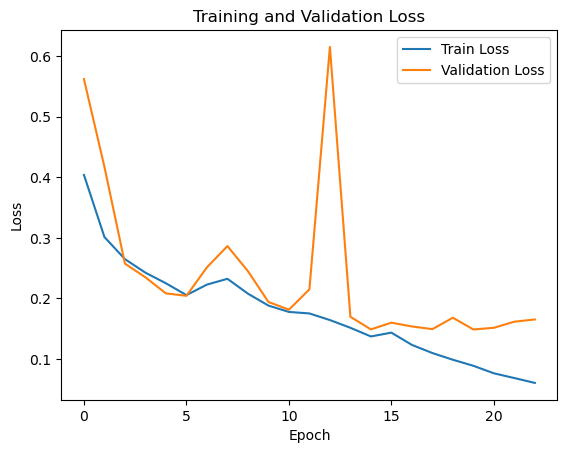

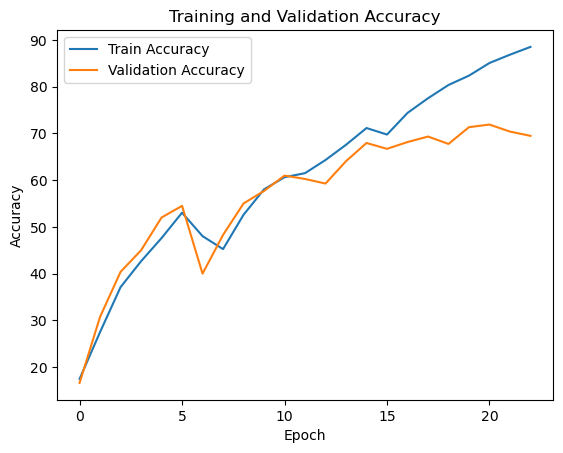

Optimizer : Adam, Learning rate: 0.01, Dropout: 0.5
Epoch [1/30], Train Loss: 0.4268, Train Accuracy: 15.30%, Val Loss: 0.4587, Val Accuracy: 19.40%
Epoch [2/30], Train Loss: 0.3214, Train Accuracy: 29.03%, Val Loss: 0.2810, Val Accuracy: 32.88%
Epoch [3/30], Train Loss: 0.2963, Train Accuracy: 31.44%, Val Loss: 0.3060, Val Accuracy: 23.91%
Epoch [4/30], Train Loss: 0.2929, Train Accuracy: 28.87%, Val Loss: 0.2741, Val Accuracy: 30.95%
Epoch [5/30], Train Loss: 0.2588, Train Accuracy: 37.48%, Val Loss: 0.2749, Val Accuracy: 41.32%
Epoch [6/30], Train Loss: 0.2413, Train Accuracy: 42.16%, Val Loss: 0.2668, Val Accuracy: 45.05%
Epoch [7/30], Train Loss: 0.2269, Train Accuracy: 46.88%, Val Loss: 0.2428, Val Accuracy: 46.08%
Epoch [8/30], Train Loss: 0.2130, Train Accuracy: 51.09%, Val Loss: 0.2480, Val Accuracy: 50.41%
Epoch [9/30], Train Loss: 0.1992, Train Accuracy: 55.05%, Val Loss: 0.2244, Val Accuracy: 56.09%
Epoch [10/30], Train Loss: 0.1893, Train Accuracy: 57.92%, Val Loss: 0.1883

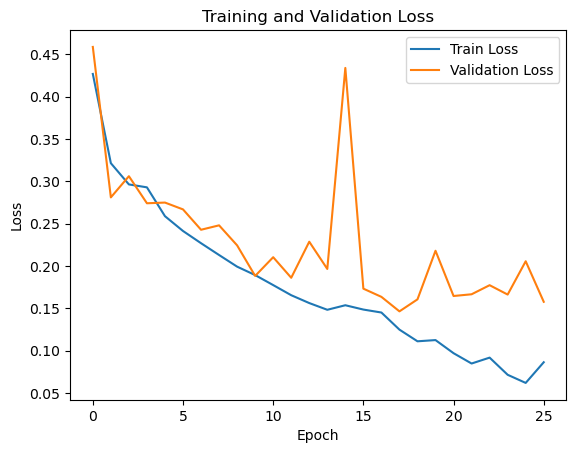

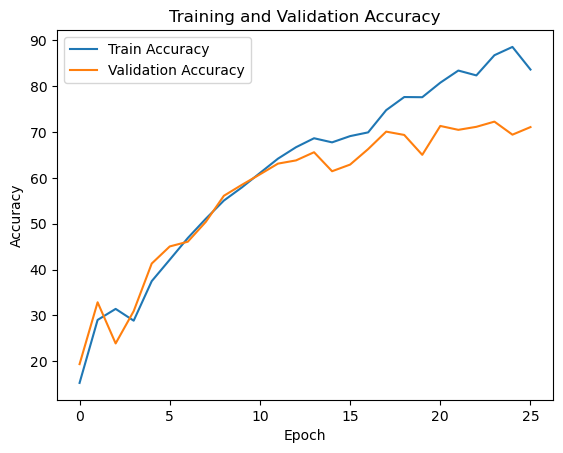

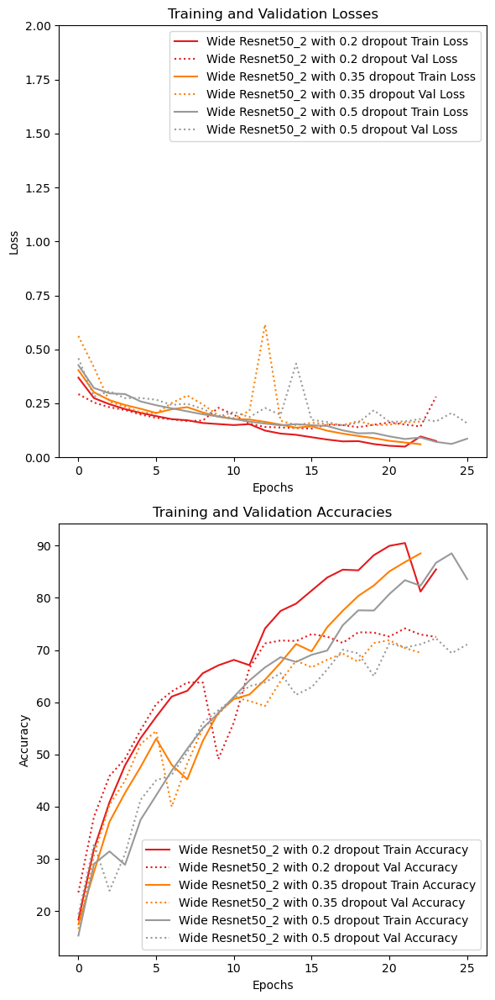

In [67]:
metrics=[]
model_names=[]
for i in [0.2,0.35,0.5]:
    print(f"Optimizer : Adam, Learning rate: 0.01, Dropout: {i}")
    model = ModelWithDropout(model_name='wide_resnet50_2', num_classes=10, dropout_prob=i).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.01)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Wide Resnet50_2 with {i} dropout')

wide_resnet50_2_dropout_metrics=metrics
wide_resnet50_2_dropout_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

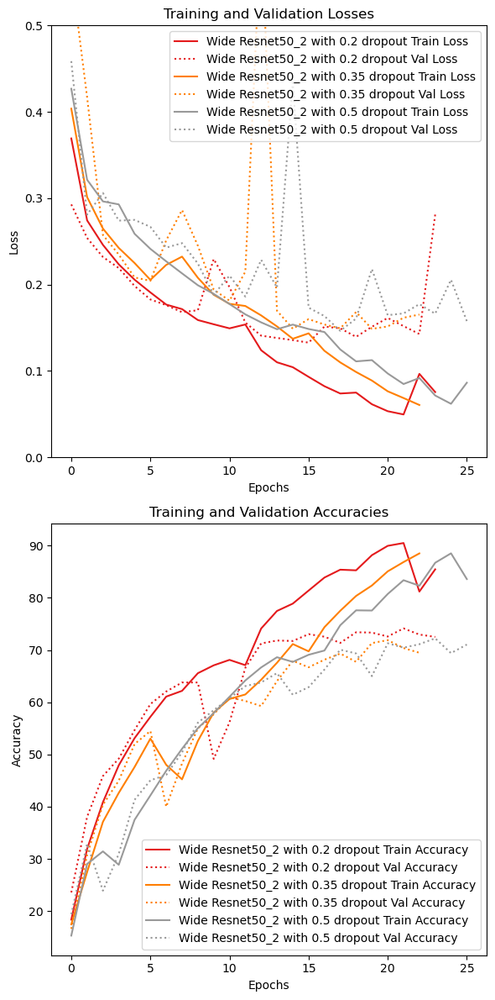

In [68]:
plot_cnn_performance(wide_resnet50_2_dropout_metrics, wide_resnet50_2_dropout_name, ylim=(0,0.5))

## Mobilnet V3 large

### Base Mobilnet V3 large

Epoch [1/30], Train Loss: 0.2717, Train Accuracy: 33.19%, Val Loss: 0.3410, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2219, Train Accuracy: 47.91%, Val Loss: 0.2585, Val Accuracy: 40.78%
Epoch [3/30], Train Loss: 0.1995, Train Accuracy: 54.33%, Val Loss: 0.2130, Val Accuracy: 52.97%
Epoch [4/30], Train Loss: 0.1840, Train Accuracy: 58.87%, Val Loss: 0.2073, Val Accuracy: 55.34%
Epoch [5/30], Train Loss: 0.1703, Train Accuracy: 62.52%, Val Loss: 0.1941, Val Accuracy: 60.51%
Epoch [6/30], Train Loss: 0.1589, Train Accuracy: 65.46%, Val Loss: 0.1937, Val Accuracy: 60.81%
Epoch [7/30], Train Loss: 0.1476, Train Accuracy: 68.06%, Val Loss: 0.1880, Val Accuracy: 61.00%
Epoch [8/30], Train Loss: 0.1379, Train Accuracy: 70.53%, Val Loss: 0.2048, Val Accuracy: 59.44%
Epoch [9/30], Train Loss: 0.1806, Train Accuracy: 60.15%, Val Loss: 0.1848, Val Accuracy: 61.16%
Epoch [10/30], Train Loss: 0.1448, Train Accuracy: 69.09%, Val Loss: 0.1685, Val Accuracy: 64.30%
Epoch [11/30], Train Loss: 0.

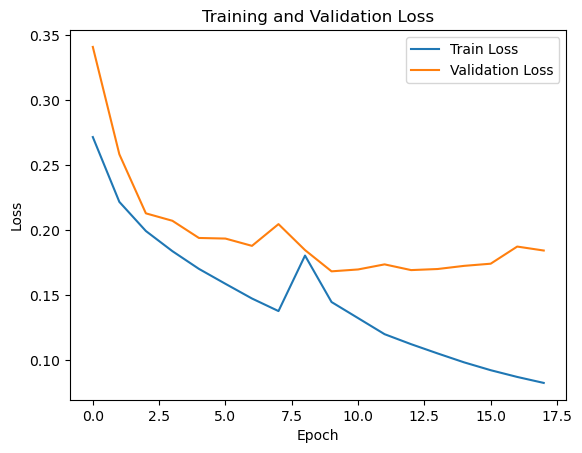

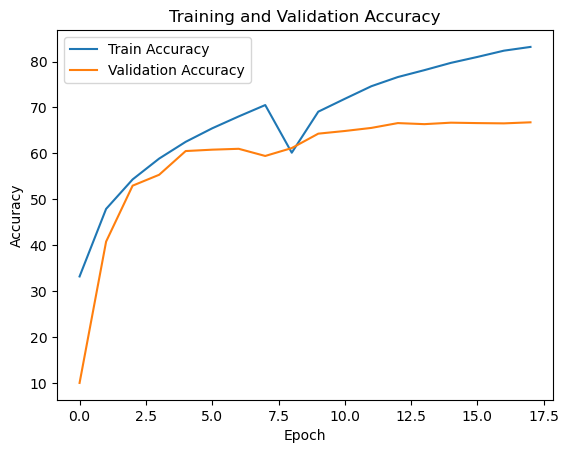

In [35]:
# mobilenet_v3_large model
model = torchvision.models.mobilenet_v3_large(num_classes=10)  # CIFAR-10 has 10 classes
model = model.to(device)

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train the model
num_epochs = 30
train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, criterion, optimizer, num_epochs=num_epochs, patience=8)

### Mobilnet V3 large with Adam optimizer and differnet learning rates

Optimizer : Adam, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3253, Train Accuracy: 18.11%, Val Loss: 0.3633, Val Accuracy: 9.29%
Epoch [2/30], Train Loss: 0.2725, Train Accuracy: 29.93%, Val Loss: 0.3245, Val Accuracy: 27.20%
Epoch [3/30], Train Loss: 0.2818, Train Accuracy: 29.30%, Val Loss: 0.3530, Val Accuracy: 24.68%
Epoch [4/30], Train Loss: 0.2774, Train Accuracy: 30.61%, Val Loss: 6494.2155, Val Accuracy: 10.00%
Epoch [5/30], Train Loss: 0.3103, Train Accuracy: 18.32%, Val Loss: 0.3145, Val Accuracy: 20.13%
Epoch [6/30], Train Loss: 0.2968, Train Accuracy: 22.59%, Val Loss: 0.3250, Val Accuracy: 20.27%
Epoch [7/30], Train Loss: 0.3058, Train Accuracy: 19.06%, Val Loss: 0.3914, Val Accuracy: 15.34%
Epoch [8/30], Train Loss: 0.2941, Train Accuracy: 22.04%, Val Loss: 0.2993, Val Accuracy: 23.23%
Epoch [9/30], Train Loss: 0.2886, Train Accuracy: 24.69%, Val Loss: 0.3453, Val Accuracy: 19.52%
Epoch [10/30], Train Loss: 0.2897, Train Accuracy: 26.19%, Val Loss: 60664.2384, Val Ac

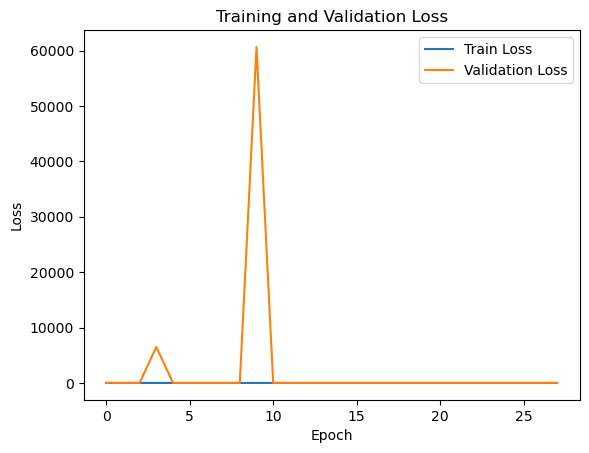

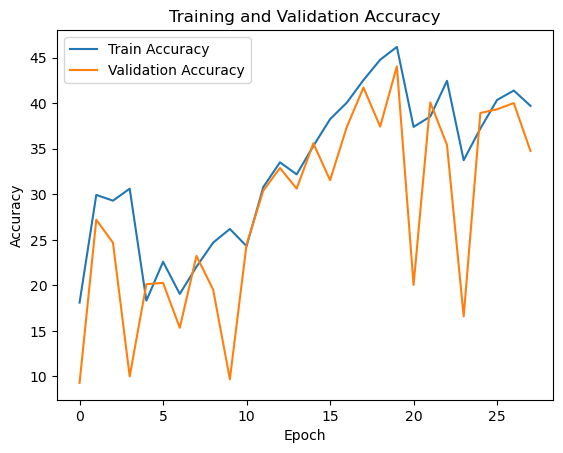

Optimizer : Adam, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2736, Train Accuracy: 32.55%, Val Loss: 0.3421, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2224, Train Accuracy: 48.10%, Val Loss: 0.2453, Val Accuracy: 47.06%
Epoch [3/30], Train Loss: 0.2032, Train Accuracy: 53.58%, Val Loss: 0.2247, Val Accuracy: 50.66%
Epoch [4/30], Train Loss: 0.1861, Train Accuracy: 58.03%, Val Loss: 0.1994, Val Accuracy: 56.38%
Epoch [5/30], Train Loss: 0.1744, Train Accuracy: 61.39%, Val Loss: 0.2165, Val Accuracy: 54.77%
Epoch [6/30], Train Loss: 0.1638, Train Accuracy: 63.95%, Val Loss: 0.1851, Val Accuracy: 60.41%
Epoch [7/30], Train Loss: 0.1507, Train Accuracy: 67.39%, Val Loss: 0.1745, Val Accuracy: 62.74%
Epoch [8/30], Train Loss: 0.1426, Train Accuracy: 69.34%, Val Loss: 0.1821, Val Accuracy: 61.90%
Epoch [9/30], Train Loss: 0.1969, Train Accuracy: 56.06%, Val Loss: 0.1919, Val Accuracy: 58.27%
Epoch [10/30], Train Loss: 0.1608, Train Accuracy: 64.92%, Val Loss: 0.1754, Val Accurac

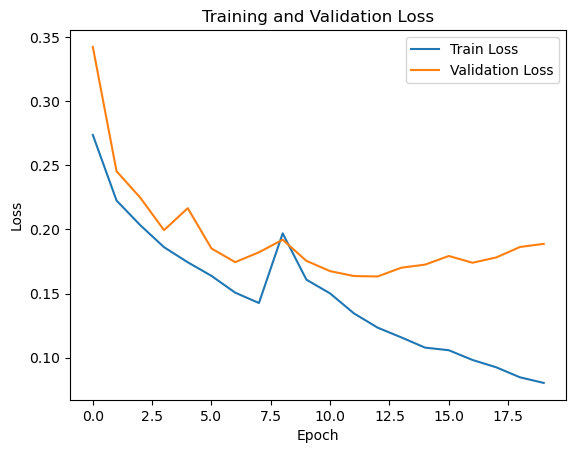

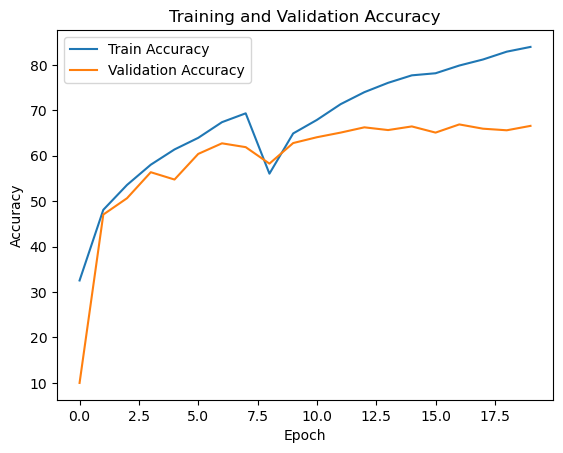

Optimizer : Adam, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3333, Train Accuracy: 20.39%, Val Loss: 0.5316, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2712, Train Accuracy: 31.28%, Val Loss: 0.3310, Val Accuracy: 25.84%
Epoch [3/30], Train Loss: 0.2494, Train Accuracy: 38.57%, Val Loss: 0.2474, Val Accuracy: 39.55%
Epoch [4/30], Train Loss: 0.2326, Train Accuracy: 44.54%, Val Loss: 0.2438, Val Accuracy: 41.91%
Epoch [5/30], Train Loss: 0.2196, Train Accuracy: 48.23%, Val Loss: 0.2380, Val Accuracy: 43.22%
Epoch [6/30], Train Loss: 0.2078, Train Accuracy: 51.73%, Val Loss: 0.2401, Val Accuracy: 43.89%
Epoch [7/30], Train Loss: 0.1965, Train Accuracy: 54.96%, Val Loss: 0.2449, Val Accuracy: 43.98%
Epoch [8/30], Train Loss: 0.1854, Train Accuracy: 57.99%, Val Loss: 0.2468, Val Accuracy: 44.27%
Epoch [9/30], Train Loss: 0.1762, Train Accuracy: 60.21%, Val Loss: 0.2564, Val Accuracy: 43.93%
Epoch [10/30], Train Loss: 0.1668, Train Accuracy: 62.65%, Val Loss: 0.2613, Val Accura

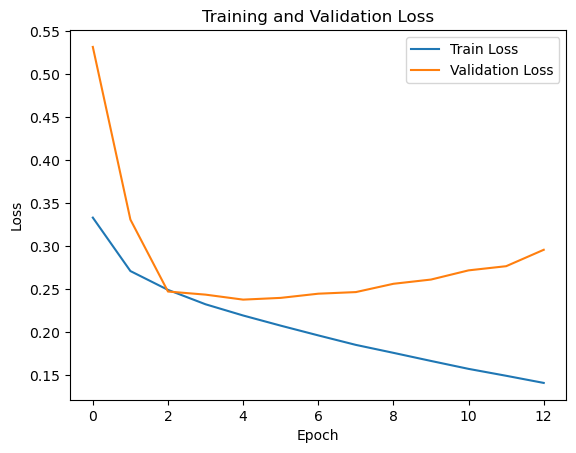

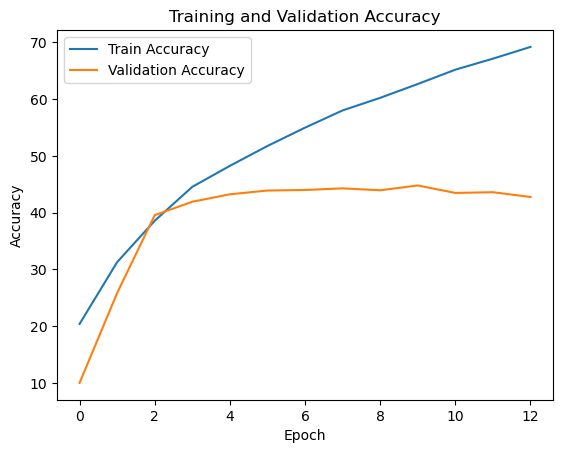

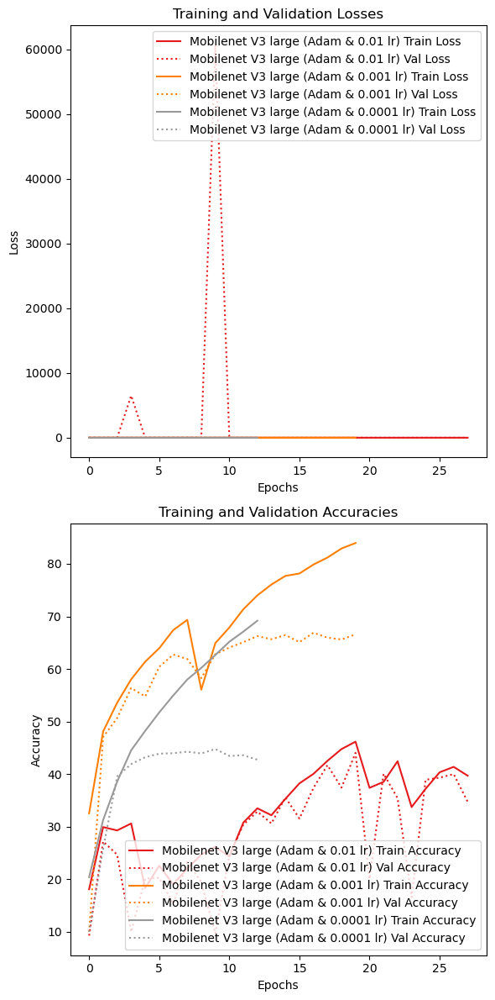

In [36]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adam, Learning rate: {i}")
    model = torchvision.models.mobilenet_v3_large(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Mobilenet V3 large (Adam & {i} lr)')

mobilenet_v3_large_adam_metrics=metrics
mobilenet_v3_large_adam_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

### Mobilnet V3 large with Adamax optimizer and differnet learning rates

Optimizer : Adamax, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3056, Train Accuracy: 21.87%, Val Loss: 0.3421, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2535, Train Accuracy: 36.56%, Val Loss: 0.2717, Val Accuracy: 32.44%
Epoch [3/30], Train Loss: 0.2327, Train Accuracy: 44.39%, Val Loss: 0.2291, Val Accuracy: 48.17%
Epoch [4/30], Train Loss: 0.2169, Train Accuracy: 49.73%, Val Loss: 0.2358, Val Accuracy: 48.31%
Epoch [5/30], Train Loss: 0.2056, Train Accuracy: 53.02%, Val Loss: 0.2228, Val Accuracy: 50.89%
Epoch [6/30], Train Loss: 0.1927, Train Accuracy: 56.41%, Val Loss: 0.2134, Val Accuracy: 53.05%
Epoch [7/30], Train Loss: 0.1879, Train Accuracy: 57.91%, Val Loss: 0.2244, Val Accuracy: 52.26%
Epoch [8/30], Train Loss: 0.1782, Train Accuracy: 60.81%, Val Loss: 0.2132, Val Accuracy: 53.99%
Epoch [9/30], Train Loss: 0.1745, Train Accuracy: 62.04%, Val Loss: 0.2415, Val Accuracy: 54.89%
Epoch [10/30], Train Loss: 0.1661, Train Accuracy: 64.08%, Val Loss: 0.1975, Val Accura

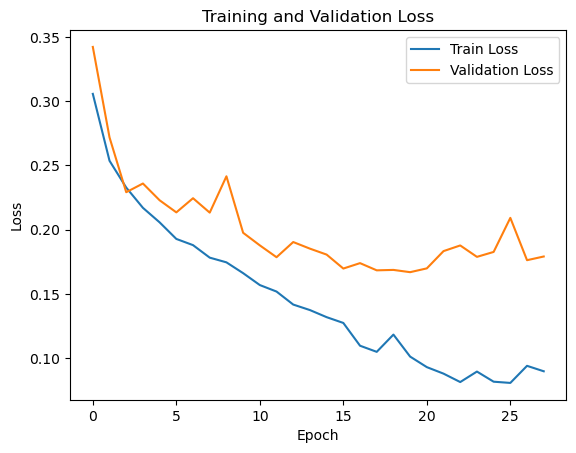

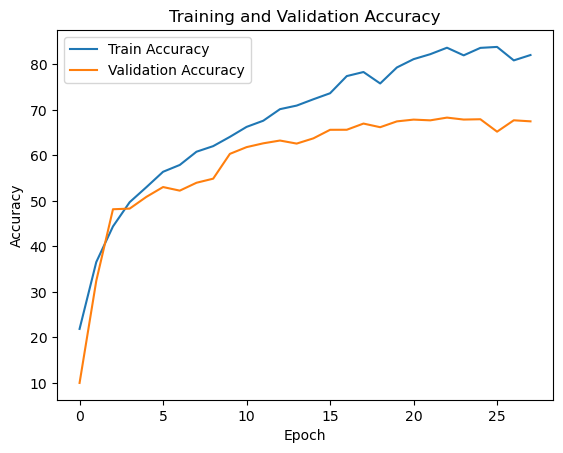

Optimizer : Adamax, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2941, Train Accuracy: 26.48%, Val Loss: 0.4947, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2461, Train Accuracy: 40.31%, Val Loss: 0.3129, Val Accuracy: 27.68%
Epoch [3/30], Train Loss: 0.2232, Train Accuracy: 47.47%, Val Loss: 0.2235, Val Accuracy: 47.69%
Epoch [4/30], Train Loss: 0.2060, Train Accuracy: 52.46%, Val Loss: 0.2189, Val Accuracy: 49.48%
Epoch [5/30], Train Loss: 0.1906, Train Accuracy: 56.65%, Val Loss: 0.2202, Val Accuracy: 50.57%
Epoch [6/30], Train Loss: 0.1776, Train Accuracy: 60.09%, Val Loss: 0.2211, Val Accuracy: 51.05%
Epoch [7/30], Train Loss: 0.1651, Train Accuracy: 63.34%, Val Loss: 0.2186, Val Accuracy: 52.15%
Epoch [8/30], Train Loss: 0.1544, Train Accuracy: 66.40%, Val Loss: 0.2229, Val Accuracy: 53.01%
Epoch [9/30], Train Loss: 0.1429, Train Accuracy: 69.11%, Val Loss: 0.2339, Val Accuracy: 51.26%
Epoch [10/30], Train Loss: 0.1329, Train Accuracy: 71.49%, Val Loss: 0.2509, Val Accur

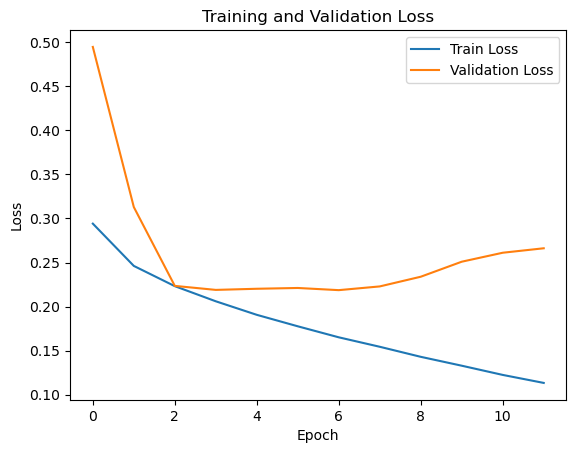

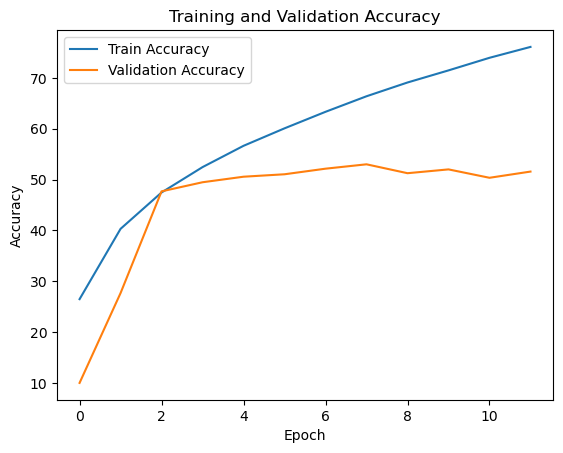

Optimizer : Adamax, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3663, Train Accuracy: 15.95%, Val Loss: 0.5506, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.3005, Train Accuracy: 22.57%, Val Loss: 0.3492, Val Accuracy: 17.55%
Epoch [3/30], Train Loss: 0.2856, Train Accuracy: 27.33%, Val Loss: 0.2818, Val Accuracy: 29.44%
Epoch [4/30], Train Loss: 0.2729, Train Accuracy: 31.98%, Val Loss: 0.2719, Val Accuracy: 32.36%
Epoch [5/30], Train Loss: 0.2612, Train Accuracy: 35.91%, Val Loss: 0.2644, Val Accuracy: 35.01%
Epoch [6/30], Train Loss: 0.2517, Train Accuracy: 38.92%, Val Loss: 0.2597, Val Accuracy: 36.81%
Epoch [7/30], Train Loss: 0.2437, Train Accuracy: 41.51%, Val Loss: 0.2573, Val Accuracy: 37.32%
Epoch [8/30], Train Loss: 0.2367, Train Accuracy: 43.78%, Val Loss: 0.2551, Val Accuracy: 38.45%
Epoch [9/30], Train Loss: 0.2302, Train Accuracy: 45.76%, Val Loss: 0.2546, Val Accuracy: 38.92%
Epoch [10/30], Train Loss: 0.2242, Train Accuracy: 47.75%, Val Loss: 0.2553, Val Accu

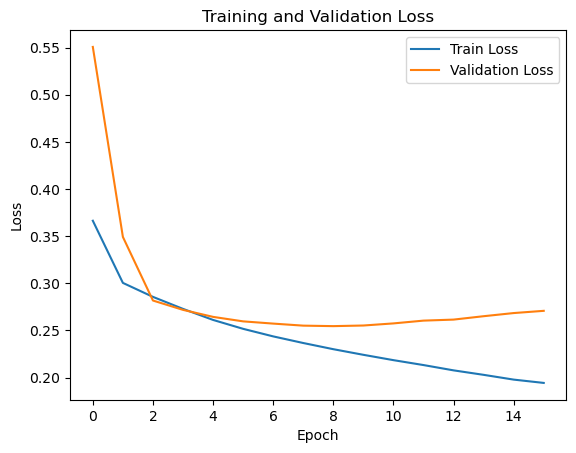

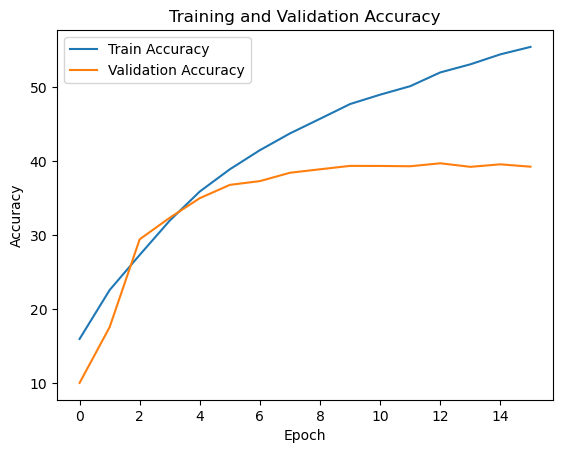

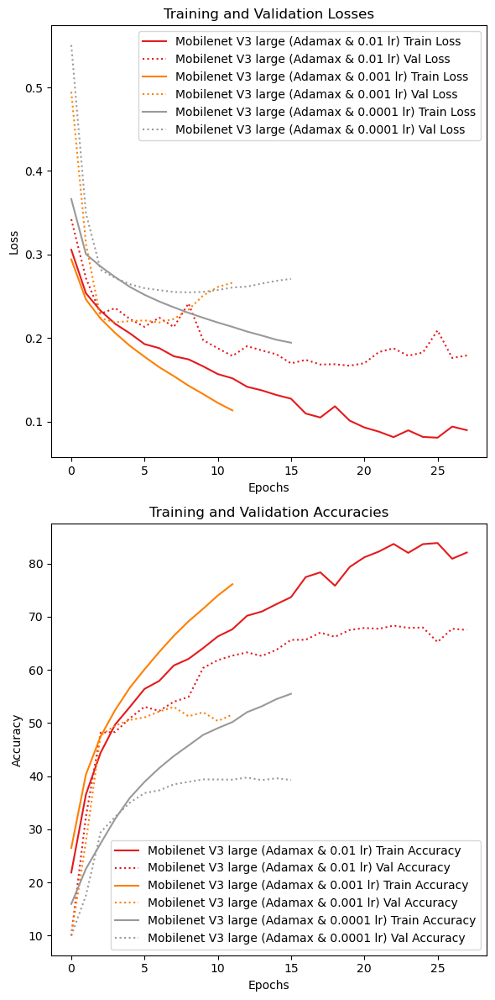

In [37]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : Adamax, Learning rate: {i}")
    model = torchvision.models.mobilenet_v3_large(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adamax(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Mobilenet V3 large (Adamax & {i} lr)')

mobilenet_v3_large_adamax_metrics=metrics
mobilenet_v3_large_adamax_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

### Mobilnet V3 large with AdamW optimizer and differnet learning rates

Optimizer : AdamW, Learning rate: 0.01
Epoch [1/30], Train Loss: 0.3125, Train Accuracy: 21.24%, Val Loss: 0.3409, Val Accuracy: 12.64%
Epoch [2/30], Train Loss: 0.2914, Train Accuracy: 25.47%, Val Loss: 0.4228, Val Accuracy: 14.11%
Epoch [3/30], Train Loss: 0.2847, Train Accuracy: 27.71%, Val Loss: 0.2678, Val Accuracy: 32.62%
Epoch [4/30], Train Loss: 0.2568, Train Accuracy: 37.12%, Val Loss: 0.2799, Val Accuracy: 32.89%
Epoch [5/30], Train Loss: 0.2720, Train Accuracy: 31.96%, Val Loss: 0.3119, Val Accuracy: 25.24%
Epoch [6/30], Train Loss: 0.2601, Train Accuracy: 36.08%, Val Loss: 0.2553, Val Accuracy: 38.04%
Epoch [7/30], Train Loss: 0.2861, Train Accuracy: 27.32%, Val Loss: 1.5474, Val Accuracy: 16.19%
Epoch [8/30], Train Loss: 0.2958, Train Accuracy: 21.73%, Val Loss: 0.3180, Val Accuracy: 19.90%
Epoch [9/30], Train Loss: 0.2939, Train Accuracy: 23.71%, Val Loss: 0.3397, Val Accuracy: 15.74%
Epoch [10/30], Train Loss: 0.3014, Train Accuracy: 21.68%, Val Loss: 0.4456, Val Accurac

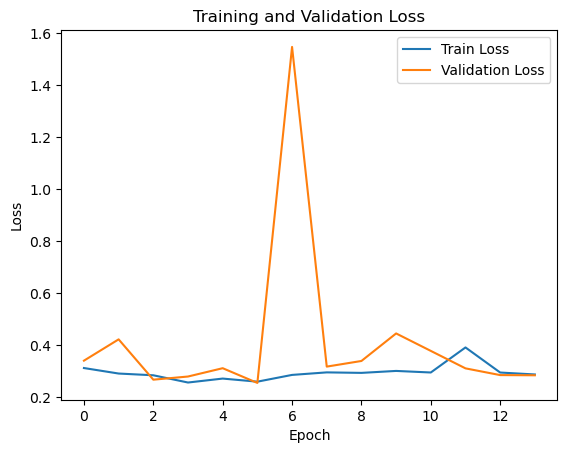

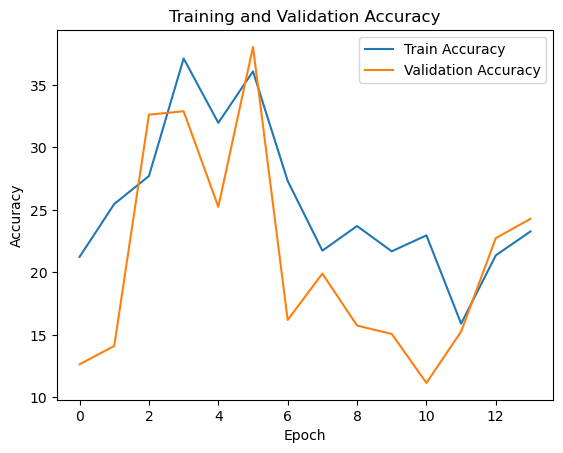

Optimizer : AdamW, Learning rate: 0.001
Epoch [1/30], Train Loss: 0.2712, Train Accuracy: 33.70%, Val Loss: 0.3431, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2245, Train Accuracy: 47.35%, Val Loss: 0.2555, Val Accuracy: 44.45%
Epoch [3/30], Train Loss: 0.2109, Train Accuracy: 51.40%, Val Loss: 0.2162, Val Accuracy: 52.04%
Epoch [4/30], Train Loss: 0.1908, Train Accuracy: 56.93%, Val Loss: 0.2034, Val Accuracy: 55.35%
Epoch [5/30], Train Loss: 0.1780, Train Accuracy: 60.34%, Val Loss: 0.1969, Val Accuracy: 58.00%
Epoch [6/30], Train Loss: 0.1660, Train Accuracy: 63.48%, Val Loss: 0.1966, Val Accuracy: 56.80%
Epoch [7/30], Train Loss: 0.1567, Train Accuracy: 65.88%, Val Loss: 0.1828, Val Accuracy: 60.37%
Epoch [8/30], Train Loss: 0.1467, Train Accuracy: 68.23%, Val Loss: 0.1821, Val Accuracy: 62.24%
Epoch [9/30], Train Loss: 0.1377, Train Accuracy: 70.74%, Val Loss: 0.1815, Val Accuracy: 62.69%
Epoch [10/30], Train Loss: 0.1295, Train Accuracy: 72.48%, Val Loss: 0.1857, Val Accura

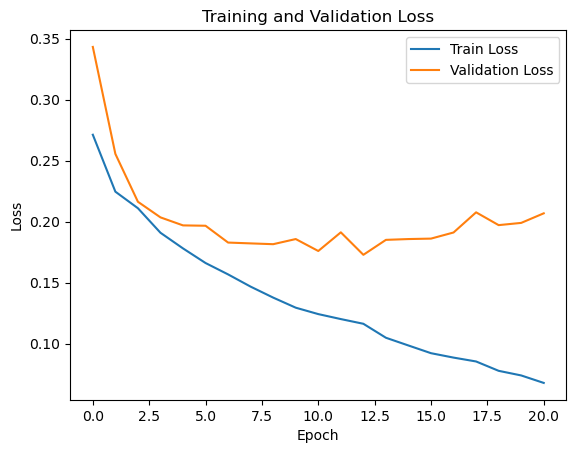

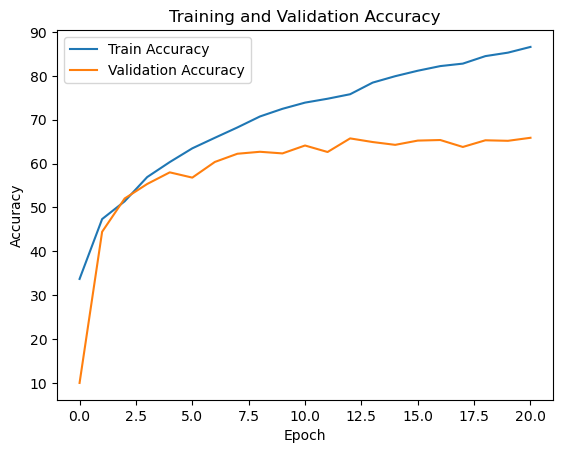

Optimizer : AdamW, Learning rate: 0.0001
Epoch [1/30], Train Loss: 0.3378, Train Accuracy: 18.90%, Val Loss: 0.5481, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2759, Train Accuracy: 29.91%, Val Loss: 0.3309, Val Accuracy: 26.32%
Epoch [3/30], Train Loss: 0.2528, Train Accuracy: 38.06%, Val Loss: 0.2500, Val Accuracy: 38.63%
Epoch [4/30], Train Loss: 0.2365, Train Accuracy: 43.10%, Val Loss: 0.2445, Val Accuracy: 40.99%
Epoch [5/30], Train Loss: 0.2240, Train Accuracy: 47.40%, Val Loss: 0.2405, Val Accuracy: 42.13%
Epoch [6/30], Train Loss: 0.2125, Train Accuracy: 50.45%, Val Loss: 0.2435, Val Accuracy: 43.02%
Epoch [7/30], Train Loss: 0.2011, Train Accuracy: 53.43%, Val Loss: 0.2463, Val Accuracy: 43.11%
Epoch [8/30], Train Loss: 0.1905, Train Accuracy: 56.50%, Val Loss: 0.2507, Val Accuracy: 43.39%
Epoch [9/30], Train Loss: 0.1801, Train Accuracy: 59.28%, Val Loss: 0.2588, Val Accuracy: 42.68%
Epoch [10/30], Train Loss: 0.1711, Train Accuracy: 61.54%, Val Loss: 0.2653, Val Accur

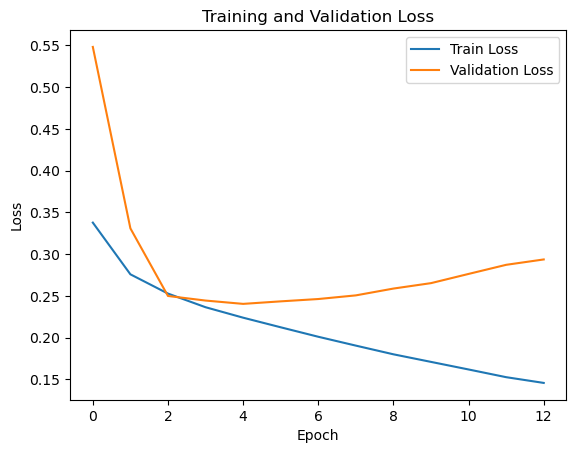

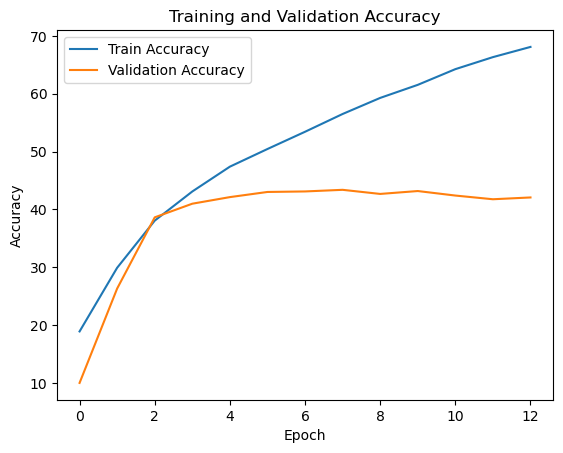

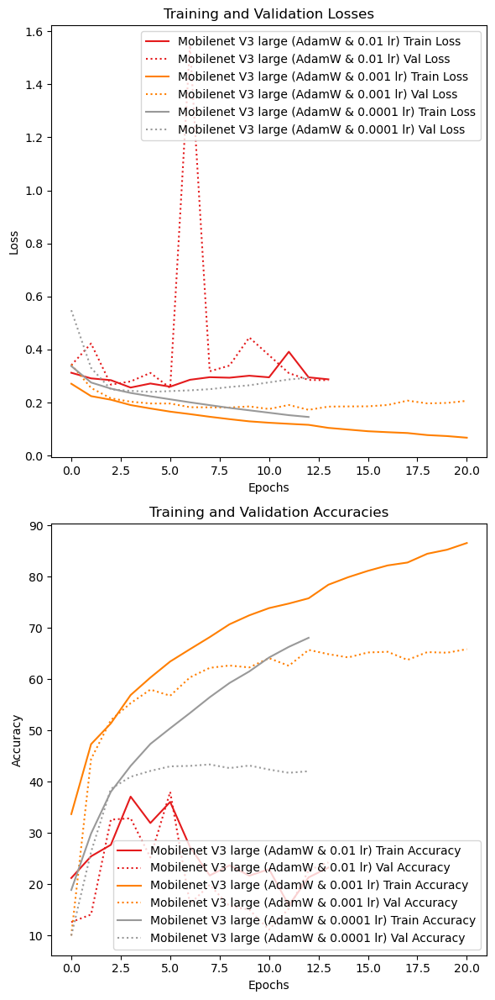

In [38]:
metrics=[]
model_names=[]
for i in [0.01,0.001,0.0001]:
    print(f"Optimizer : AdamW, Learning rate: {i}")
    model = torchvision.models.mobilenet_v3_large(num_classes=10).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.AdamW(model.parameters(), lr=i)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Mobilenet V3 large (AdamW & {i} lr)')

mobilenet_v3_large_adamw_metrics=metrics
mobilenet_v3_large_adamw_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

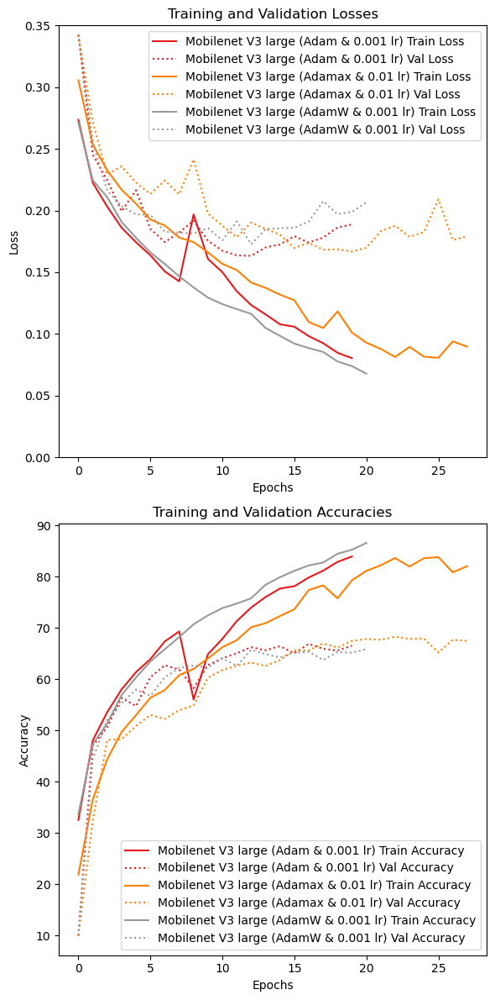

In [70]:
plot_cnn_performance([mobilenet_v3_large_adam_metrics[1],mobilenet_v3_large_adamax_metrics[0], mobilenet_v3_large_adamw_metrics[1]],[mobilenet_v3_large_adam_name[1],mobilenet_v3_large_adamax_name[0],mobilenet_v3_large_adamw_name[1]], ylim=(0,0.35))

Optimizer : Adamax, Learning rate: 0.01, Dropout: 0.2
Epoch [1/30], Train Loss: 0.3089, Train Accuracy: 23.26%, Val Loss: 0.3312, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2480, Train Accuracy: 39.19%, Val Loss: 0.2643, Val Accuracy: 37.50%
Epoch [3/30], Train Loss: 0.2309, Train Accuracy: 45.39%, Val Loss: 0.2324, Val Accuracy: 46.29%
Epoch [4/30], Train Loss: 0.2154, Train Accuracy: 50.31%, Val Loss: 0.2377, Val Accuracy: 48.80%
Epoch [5/30], Train Loss: 0.2048, Train Accuracy: 53.42%, Val Loss: 0.3372, Val Accuracy: 47.08%
Epoch [6/30], Train Loss: 0.1960, Train Accuracy: 56.19%, Val Loss: 0.2084, Val Accuracy: 53.61%
Epoch [7/30], Train Loss: 0.1882, Train Accuracy: 58.53%, Val Loss: 0.2182, Val Accuracy: 54.17%
Epoch [8/30], Train Loss: 0.1868, Train Accuracy: 58.75%, Val Loss: 0.2090, Val Accuracy: 54.30%
Epoch [9/30], Train Loss: 0.1852, Train Accuracy: 59.63%, Val Loss: 0.2104, Val Accuracy: 56.57%
Epoch [10/30], Train Loss: 0.1785, Train Accuracy: 61.34%, Val Loss: 0.21

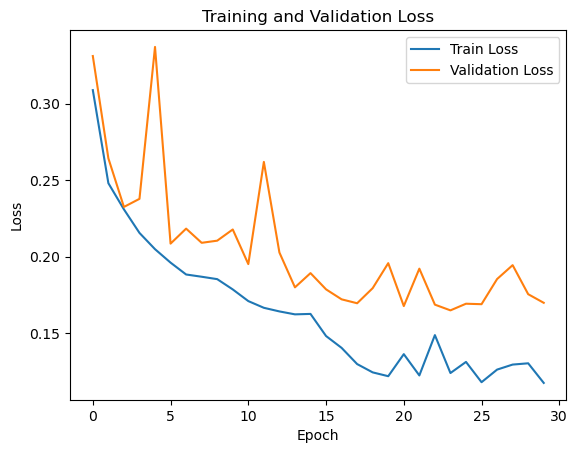

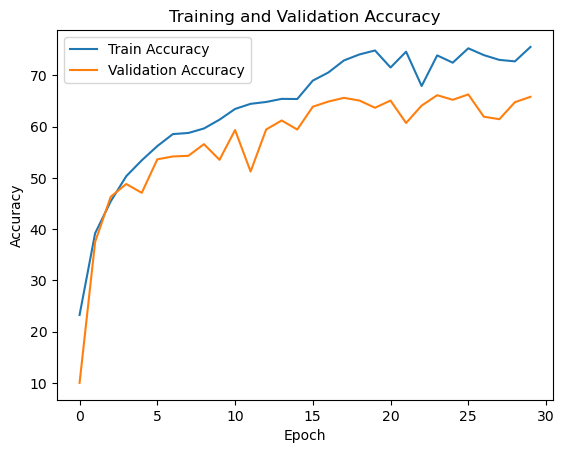

Optimizer : Adamax, Learning rate: 0.01, Dropout: 0.35
Epoch [1/30], Train Loss: 0.3205, Train Accuracy: 18.72%, Val Loss: 0.3388, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2606, Train Accuracy: 35.10%, Val Loss: 0.2651, Val Accuracy: 38.50%
Epoch [3/30], Train Loss: 0.2371, Train Accuracy: 43.74%, Val Loss: 0.2499, Val Accuracy: 42.72%
Epoch [4/30], Train Loss: 0.2295, Train Accuracy: 46.54%, Val Loss: 0.2416, Val Accuracy: 46.55%
Epoch [5/30], Train Loss: 0.2175, Train Accuracy: 50.08%, Val Loss: 0.2141, Val Accuracy: 50.11%
Epoch [6/30], Train Loss: 0.2042, Train Accuracy: 53.72%, Val Loss: 0.2097, Val Accuracy: 52.01%
Epoch [7/30], Train Loss: 0.1940, Train Accuracy: 56.35%, Val Loss: 0.2118, Val Accuracy: 54.50%
Epoch [8/30], Train Loss: 0.1928, Train Accuracy: 56.86%, Val Loss: 0.2100, Val Accuracy: 55.57%
Epoch [9/30], Train Loss: 0.1836, Train Accuracy: 59.66%, Val Loss: 0.2119, Val Accuracy: 54.94%
Epoch [10/30], Train Loss: 0.1832, Train Accuracy: 59.57%, Val Loss: 0.2

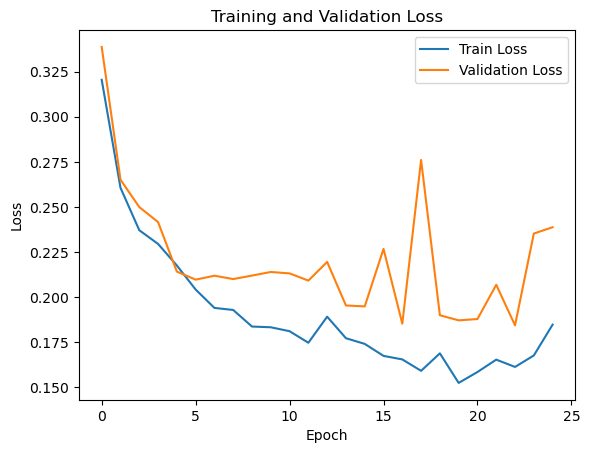

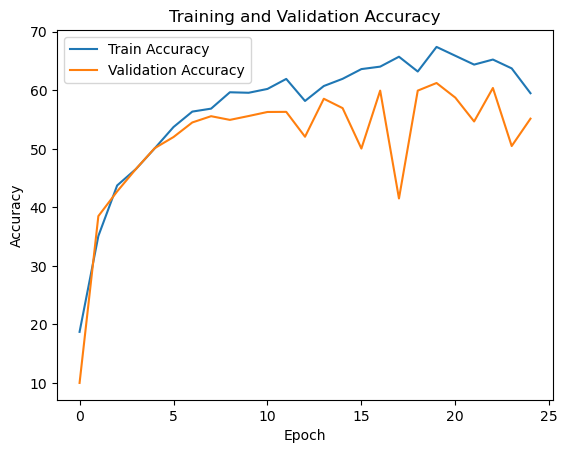

Optimizer : Adamax, Learning rate: 0.01, Dropout: 0.5
Epoch [1/30], Train Loss: 0.3134, Train Accuracy: 20.75%, Val Loss: 0.3415, Val Accuracy: 10.00%
Epoch [2/30], Train Loss: 0.2565, Train Accuracy: 36.33%, Val Loss: 0.2762, Val Accuracy: 34.92%
Epoch [3/30], Train Loss: 0.2385, Train Accuracy: 42.99%, Val Loss: 0.2299, Val Accuracy: 44.42%
Epoch [4/30], Train Loss: 0.2235, Train Accuracy: 47.97%, Val Loss: 0.2251, Val Accuracy: 48.42%
Epoch [5/30], Train Loss: 0.2168, Train Accuracy: 50.09%, Val Loss: 0.2250, Val Accuracy: 49.35%
Epoch [6/30], Train Loss: 0.2129, Train Accuracy: 51.33%, Val Loss: 0.2326, Val Accuracy: 47.81%
Epoch [7/30], Train Loss: 0.2024, Train Accuracy: 54.34%, Val Loss: 0.2030, Val Accuracy: 54.46%
Epoch [8/30], Train Loss: 0.1955, Train Accuracy: 56.33%, Val Loss: 0.2178, Val Accuracy: 52.20%
Epoch [9/30], Train Loss: 0.2181, Train Accuracy: 51.23%, Val Loss: 0.2256, Val Accuracy: 47.58%
Epoch [10/30], Train Loss: 0.2154, Train Accuracy: 50.51%, Val Loss: 0.21

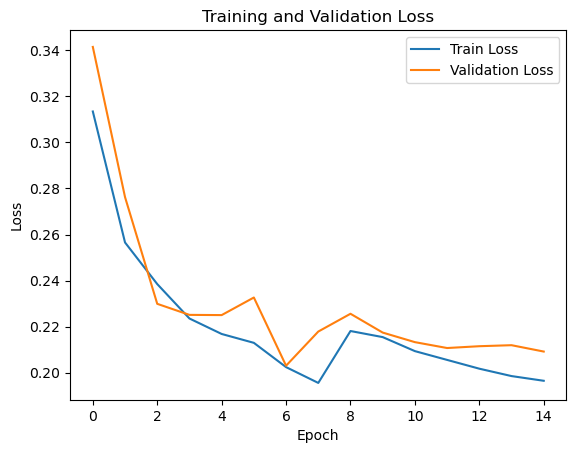

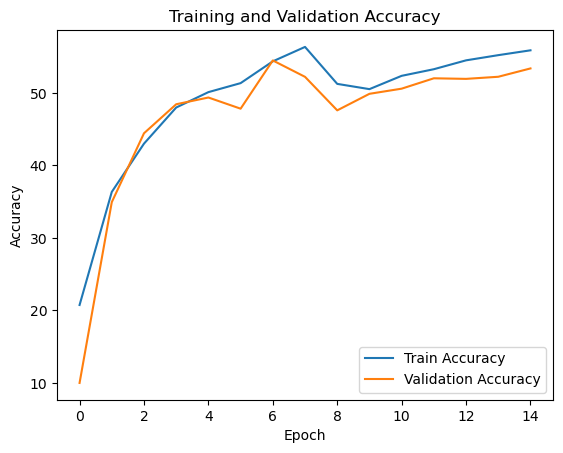

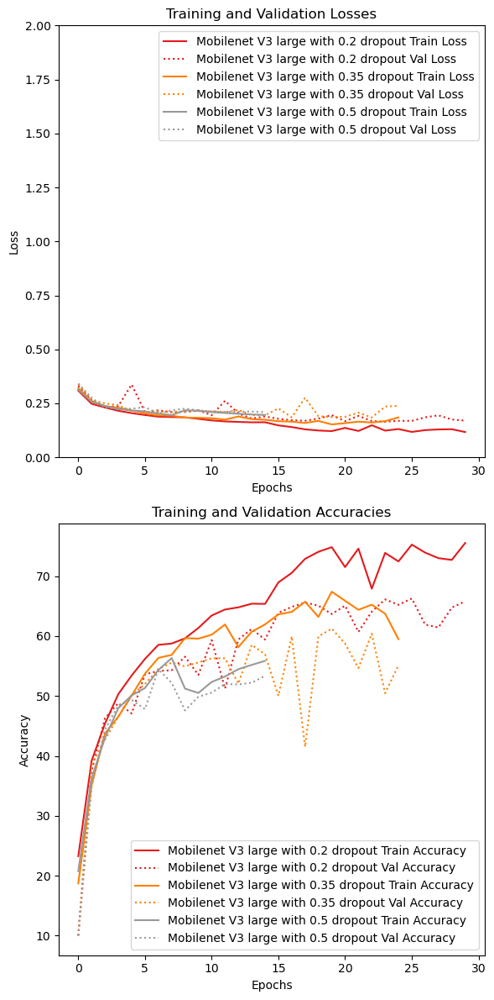

In [72]:
metrics=[]
model_names=[]
for i in [0.2,0.35,0.5]:
    print(f"Optimizer : Adamax, Learning rate: 0.01, Dropout: {i}")
    model = ModelWithDropout(model_name='mobilenet_v3_large', num_classes=10, dropout_prob=i).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adamax(model.parameters(), lr=0.01)
    metrics_dict={}
    metrics_dict['train_losses'], metrics_dict['val_losses'], metrics_dict['train_accuracies'], metrics_dict['val_accuracies'] = train_model(model, criterion, optimizer, num_epochs=30, patience=8)
    metrics.append(metrics_dict)
    model_names.append(f'Mobilenet V3 large with {i} dropout')

mobilenet_v3_dropout_metrics=metrics
mobilenet_v3_dropout_name=model_names
plot_cnn_performance(metrics, model_names=model_names)

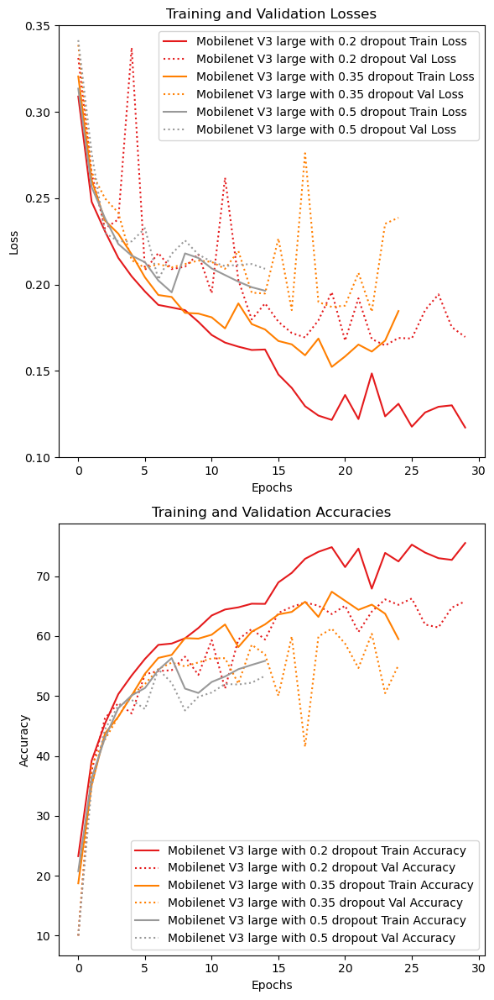

In [78]:
plot_cnn_performance(mobilenet_v3_dropout_metrics, mobilenet_v3_dropout_name, ylim=(0.10,0.35))

### Comparing all the best CNN models

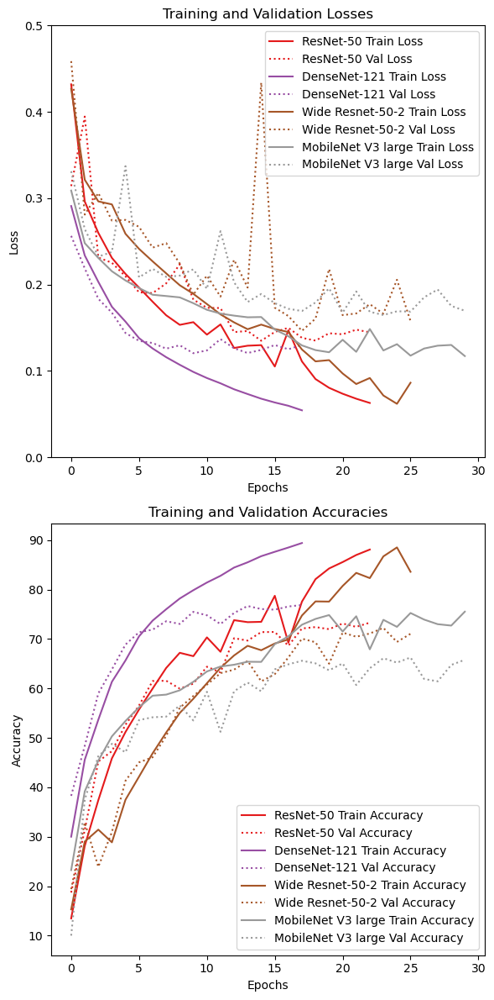

In [84]:
plot_cnn_performance([resnet_50_dropout_metrics[1],densenet_121_dropout_metrics[1],wide_resnet50_2_dropout_metrics[2],mobilenet_v3_dropout_metrics[0]],['ResNet-50','DenseNet-121','Wide Resnet-50-2','MobileNet V3 large'], ylim=(0,0.5))

### Training the best model again

Epoch [1/30], Train Loss: 0.2889, Train Accuracy: 31.05%, Val Loss: 0.2630, Val Accuracy: 37.61%
Epoch [2/30], Train Loss: 0.2322, Train Accuracy: 44.53%, Val Loss: 0.2324, Val Accuracy: 48.86%
Epoch [3/30], Train Loss: 0.2015, Train Accuracy: 53.94%, Val Loss: 0.1819, Val Accuracy: 59.30%
Epoch [4/30], Train Loss: 0.1733, Train Accuracy: 61.53%, Val Loss: 0.1630, Val Accuracy: 64.03%
Epoch [5/30], Train Loss: 0.1516, Train Accuracy: 67.21%, Val Loss: 0.1626, Val Accuracy: 64.42%
Epoch [6/30], Train Loss: 0.1366, Train Accuracy: 71.19%, Val Loss: 0.1412, Val Accuracy: 69.82%
Epoch [7/30], Train Loss: 0.1239, Train Accuracy: 73.91%, Val Loss: 0.1349, Val Accuracy: 72.02%
Epoch [8/30], Train Loss: 0.1131, Train Accuracy: 76.60%, Val Loss: 0.1308, Val Accuracy: 72.79%
Epoch [9/30], Train Loss: 0.1040, Train Accuracy: 78.64%, Val Loss: 0.1243, Val Accuracy: 74.59%
Epoch [10/30], Train Loss: 0.0964, Train Accuracy: 80.41%, Val Loss: 0.1238, Val Accuracy: 74.73%
Epoch [11/30], Train Loss: 0.

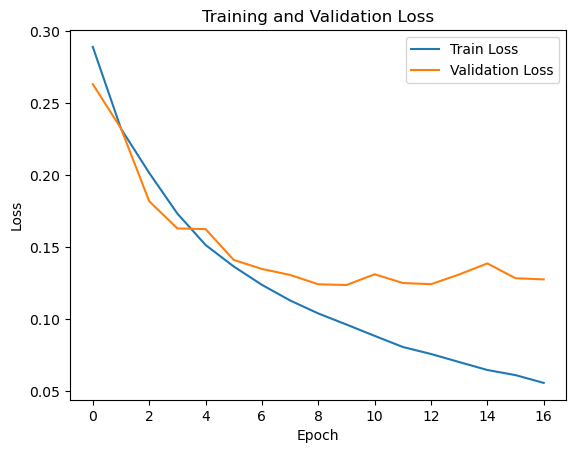

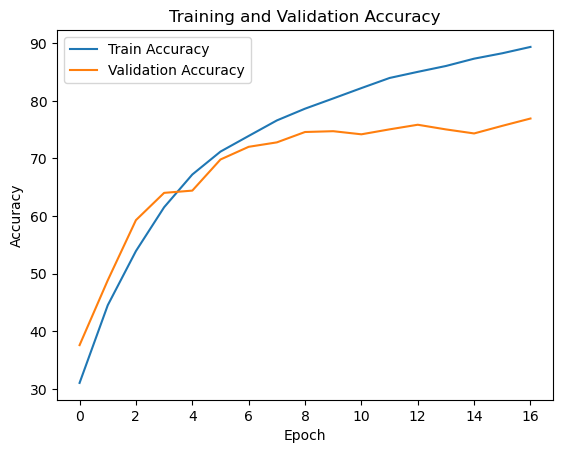

In [82]:

model = ModelWithDropout(model_name='densenet121', num_classes=10, dropout_prob=0.35)
model = model.to(device)

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.01)

# Train the model
num_epochs = 30
train_losses, val_losses, train_accuracies, val_accuracies = train_model(model, criterion, optimizer, num_epochs=num_epochs, patience=8)

### Testing the model

Test Loss: 0.0404, Test Accuracy: 92.58%
Test Loss: 0.1277, Test Accuracy: 76.93%
Test Loss: 0.1314, Test Accuracy: 76.54%


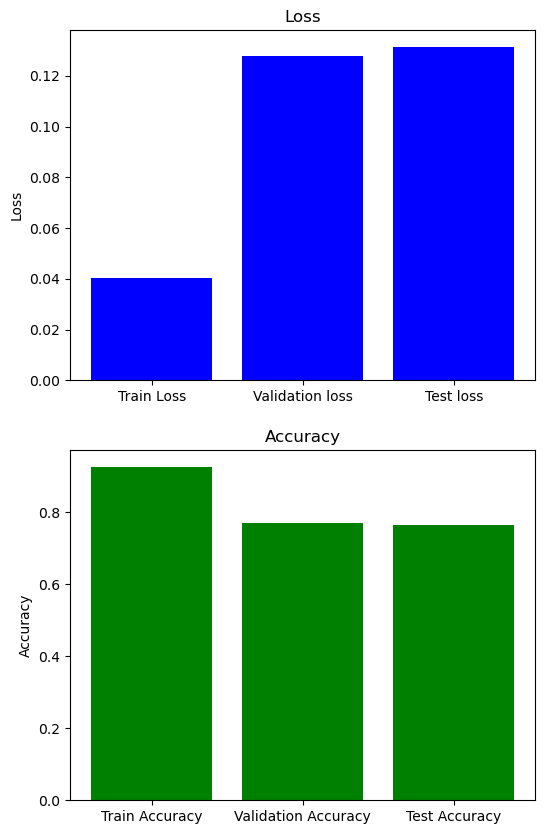

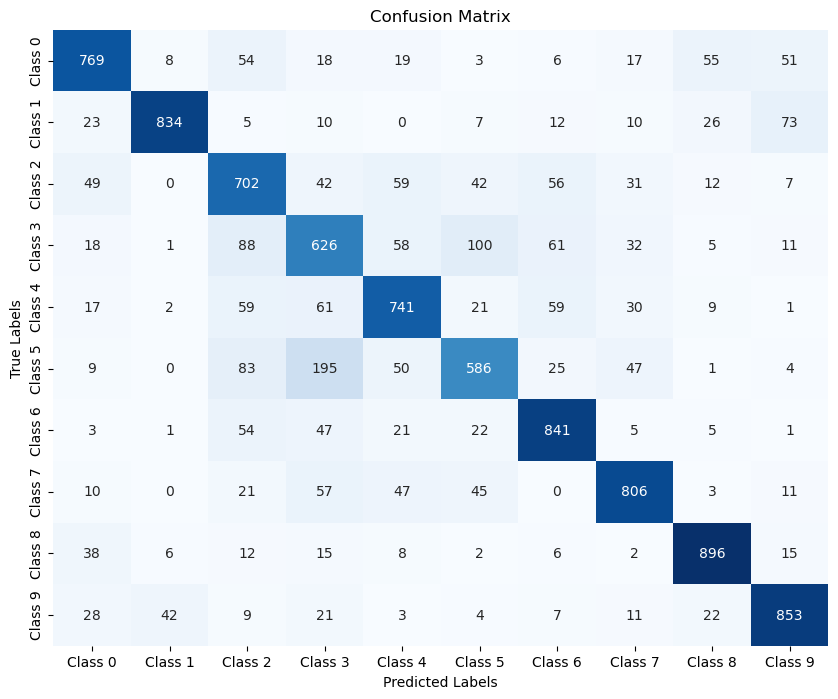

In [89]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import seaborn as sns

# Function to evaluate the model on the test set
def test_model(model, testloader, criterion):
    model.eval()  # Set model to evaluation mode
    test_loss = 0.0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in testloader:
            images, labels = images.to(device), labels.to(device)

            # One-hot encode labels for BCEWithLogitsLoss
            labels_onehot = F.one_hot(labels, num_classes=10).float()

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels_onehot)
            test_loss += loss.item()

            # Store predictions and labels for accuracy and confusion matrix
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate average loss and accuracy
    test_loss /= len(testloader)
    test_accuracy = accuracy_score(all_labels, all_preds)
    print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2%}')

    return test_loss, test_accuracy, all_labels, all_preds

# Run the test evaluation
train_loss, train_accuracy, all_labels, all_preds = test_model(model, trainloader, criterion)
val_loss, val_accuracy, all_labels, all_preds = test_model(model, valloader, criterion)
test_loss, test_accuracy, all_labels, all_preds = test_model(model, testloader, criterion)

# Plotting test loss and accuracy
plt.figure(figsize=(6, 10))

# Loss plot
plt.subplot(2, 1, 1)
plt.title("Loss")
plt.bar(['Train Loss', 'Validation loss','Test loss'], [train_loss,val_loss,test_loss], color='blue')
plt.ylabel('Loss')

# Accuracy plot
plt.subplot(2, 1, 2)
plt.title("Accuracy")
plt.bar(['Train Accuracy', 'Validation Accuracy','Test Accuracy'], [train_accuracy,val_accuracy,test_accuracy], color='green')
plt.ylabel('Accuracy')

plt.show()

# Confusion Matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, 
            xticklabels=[f"Class {i}" for i in range(10)], 
            yticklabels=[f"Class {i}" for i in range(10)])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()
